note - this notebook best viewed by launching with jupyter to enable user to collapse output cells and scroll through figures

<a id='home'></a>
### purpose

- validate offset calculations by plotting relationships between GF offset and phenotypes, and calculation correlation coeficients for pearson and spearman
    
### outline

1. [Read in population data](#read)
    - lat/long + phenotypic data (just like in `../08_climate_and_geographic_distance_vs_phenotypes`)

1. [2. Read in kfold assignments](#kfold)
    - get the populations that were in test/training sets, created in `../01_split_training_and_testing.ipynb`

1. [Extract offset values from netCDF files](#netcdf)
    - for each model's netCDF file, extract each population's predicted offset, created in 
    `../07_fit_gradient_forest_models_to_common_garden_data.ipynb#fit` using fitting script from 
    `../05_gradient_forest_processing_scripts.ipynb`

1. [Get stats for relationship between offset and phenotypes](#stats)
    - use Pearson's, Spearman's, RMSE (and derivatives)

1. [get stats from full-variety/interior model for each variety and genetic group (interior DF)](#subset)
    - use Pearson's, Spearman's, RMSE (and derivatives)

1. [jump to bottom of notebook](#bottom)

<!-- 
[ - Plot relationships](#)
- TODO

[99 - explore training data](#explore)
- TODO: create circos plots to compare ranks of climate importance across runs -->

In [1]:
from pythonimports import *
from myfigs import save_pdf

import xarray
import rioxarray
from matplotlib.lines import Line2D
from scipy.stats import pearsonr, spearmanr, linregress, kendalltau
import scipy.odr as odr  # orthogonal distance regression
import scipy
import seaborn as sns
from numpy.linalg import norm

t1 = dt.now()  # notebook timer

jpphenodir = '/data/projects/pool_seq/pangenome/JP_pangenome/JP_pooled/phenotypes'
dfphenodir = '/data/projects/pool_seq/phenotypic_data/doug-fir'

txtdir = makedir('/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests')
figdir = makedir(op.join(txtdir, 'figs'))

lview,dview = get_client()

latest_commit()
sinfo(html=True)

56 56
##################################################################
Today:	June 26, 2023 - 11:30:30
python version: 3.8.5
conda env: newpy385

Current commit of pythonimports:
commit 03d76f7a992130f4b94ac34a09ad439e918d3044  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Fri Jun 9 09:42:21 2023 -0400
##################################################################



<a id='read'></a>
# 1. read in population data
[top](#home)

### jack pine popdata

In [2]:
envdata = {}
envdata['jp'] = pd.read_table('/data/projects/pool_seq/environemental_data/jp_rm_p24/jp_no-p24_std_env-19variables.txt')
envdata['jp'].index = envdata['jp']['our_id'].tolist()
envdata['jp'].head()

,id1,id2,our_id,LAT,LONG,Elevation,AHM,CMD,DD5,DD_0,EMT,EXT,Eref,FFP,MAP,MAT,MCMT,MSP,MWMT,NFFD,PAS,SHM,TD,bFFP,eFFP,group_color
JP_p98,9150251,38,JP_p98,54.3333,-106.6333,537,0.675175,0.520607,-0.903668,1.089738,-0.977280,-0.426821,-0.730607,-0.884497,-1.150172,-1.078601,-0.980098,-1.159142,-0.873067,0.024306,-0.875072,0.771358,0.796677,0.297097,-1.185008,green
JP_p73,3273,22,JP_p73,44.4200,-84.6800,359,0.836472,1.368359,1.495515,-1.369016,1.486357,0.679033,1.970275,1.047245,-0.089609,1.506884,1.449041,0.000330,1.202338,0.909053,-0.778393,0.304132,-1.205688,-0.729581,1.010494,blue
JP_p97,8060006,37,JP_p97,56.1167,-116.9167,636,1.138905,1.382488,-1.202248,0.719680,-0.625332,-0.368618,-0.448998,-1.781378,-1.263664,-0.914443,-0.919871,-1.584282,-1.651344,-0.670852,-0.839916,0.994352,0.436701,0.737103,-2.282760,green
JP_p60,3260,17,JP_p60,46.7200,-84.3900,203,-0.272448,-0.129337,0.093943,-0.869081,0.927381,-0.659632,0.101418,0.495318,0.364358,0.645056,0.907002,0.026096,-0.224503,0.466680,0.320236,-0.311756,-1.093195,0.150429,1.010494,blue
JP_p100,9040116,40,JP_p100,55.7667,-97.8167,205,-0.917638,-0.199983,-1.852100,2.404514,-1.743285,-0.135807,-1.831440,-2.333304,-0.974064,-2.350824,-1.943723,-1.030312,-1.456774,-2.693131,-0.330152,0.293514,1.674118,2.497123,-1.843659,green


### jack pine phenotypes

In [3]:
# get the common garden files for jack pine
jpfiles = fs(jpphenodir, 'cg-data_provpops')

phenos = ['Mortality_2018', 'Mean_Height_2018', 'Mean_DBH2018']

jpdata = {}
for f in jpfiles:
    garden = f.split("_")[-1].rstrip('.txt')
    if garden == 'petawawa':
        continue
    if garden == 'st-christine':
        garden = 'christine'  # match name in `cgdata.index`
    jpdata[garden] = pd.read_table(f)
    jpdata[garden].index = jpdata[garden]['our_id'].tolist()
    jpdata[garden] = jpdata[garden][phenos]
    print(garden, nrow(jpdata[garden]))

jpdata[garden].head()

fontbrune 27
christine 28


,Mortality_2018,Mean_Height_2018,Mean_DBH2018
JP_p4,70.0,1799.09,228.00
JP_p6,64.0,1856.67,239.60
JP_p8,58.0,1988.95,259.63
JP_p14,72.0,1636.67,211.83
JP_p20,88.0,1578.33,218.50


### doug-fir pop data

In [4]:
# map prov ID to our ID to translate pop names in phenotype data below
envdata['combined'] = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/df_ALL-naturalpops_raw_env-19variables_change-p6.txt')
envdata['combined'].index = envdata['combined']['our_id'].tolist()
provdict = dict(zip(envdata['combined']['prov'], envdata['combined']['our_id']))
print(provdict)

{1: 'DF_p1', 2: 'DF_p2', 3: 'DF_p3', 4: 'DF_p4', 5: 'DF_p5', 6: 'DF_p6', 7: 'DF_p7', 8: 'DF_p8', 9: 'DF_p9', 10: 'DF_p10', 11: 'DF_p11', 12: 'DF_p12', 13: 'DF_p13', 14: 'DF_p14', 15: 'DF_p15', 16: 'DF_p16', 17: 'DF_p17', 18: 'DF_p18', 19: 'DF_p19', 20: 'DF_p20', 23: 'DF_p23', 24: 'DF_p24', 25: 'DF_p25', 26: 'DF_p26', 27: 'DF_p27', 28: 'DF_p28', 29: 'DF_p29', 30: 'DF_p30', 31: 'DF_p31', 32: 'DF_p32', 33: 'DF_p33', 34: 'DF_p34', 35: 'DF_p35', 36: 'DF_p36', 37: 'DF_p37', 38: 'DF_p38', 39: 'DF_p39', 40: 'DF_p40', 41: 'DF_p41', 42: 'DF_p42', 43: 'DF_p43', 44: 'DF_p44', 45: 'DF_p45', 46: 'DF_p46', 47: 'DF_p47', 48: 'DF_p48', 49: 'DF_p49', 50: 'DF_p50', 51: 'DF_p51', 52: 'DF_p52', 53: 'DF_p53', 54: 'DF_p54', 55: 'DF_p55', 56: 'DF_p56', 57: 'DF_p57', 58: 'DF_p58', 59: 'DF_p59', 60: 'DF_p60', 61: 'DF_p61', 62: 'DF_p62', 72: 'DF_p72', 73: 'DF_p73', 74: 'DF_p74', 75: 'DF_p75', 76: 'DF_p76', 77: 'DF_p77', 78: 'DF_p78', 79: 'DF_p79', 80: 'DF_p80', 81: 'DF_p81', 82: 'DF_p82', 83: 'DF_p83', 84: 'DF_p

In [5]:
# coastal
envdata['fdc'] = envdata['combined'][envdata['combined']['Variety']=='FDC'].copy()
nrow(envdata['fdc'])

38

In [6]:
# interior
envdata['fdi'] = envdata['combined'][envdata['combined']['Variety']=='FDI'].copy()
nrow(envdata['fdi'])

35

In [7]:
assert nrow(envdata['fdi']) + nrow(envdata['fdc']) == nrow(envdata['combined'])

In [8]:
# create color dict for pop colors
cdict = dict(zip(envdata['jp'].index,
                 envdata['jp']['group_color']))

df_colors = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/doug-fir_colored_pops.txt')
df_colors.loc[df_colors['our_id']=='DF_p40', ['group', 'group_color']] = 'North BC', '#f205f4'  # as in ../01_split_training_and_testing.ipynb

cdict.update(dict(
    zip(df_colors['our_id'],
        df_colors['group_color'])
))


assert len(cdict) == nrow(envdata['jp']) + nrow(envdata['combined'])

In [9]:
# from ../08_climate_and_geographic_distance_vs_phenotypes.ipynb#calc
# separate interior into two genetic groups seen in PCA
western_groups = ['North BC', 'South Central BC']

fdi_envdata = envdata['fdi'].copy()
group_dict = dict(zip(df_colors['our_id'], df_colors['group']))
fdi_envdata['group'] = fdi_envdata['our_id'].map(group_dict)
fdi_envdata['genetic_group'] = ['western' if group in western_groups else 'eastern' for group in fdi_envdata['group']]

fdi_groups = fdi_envdata[['our_id', 'genetic_group']].groupby('genetic_group')['our_id'].apply(list).to_dict()
print(fdi_groups)

{'eastern': ['DF_p3', 'DF_p5', 'DF_p18', 'DF_p19', 'DF_p20', 'DF_p33', 'DF_p34', 'DF_p37', 'DF_p46', 'DF_p47', 'DF_p54', 'DF_p55', 'DF_p56', 'DF_p57', 'DF_p58', 'DF_p59', 'DF_p60', 'DF_p61', 'DF_p62'], 'western': ['DF_p4', 'DF_p7', 'DF_p8', 'DF_p9', 'DF_p35', 'DF_p36', 'DF_p38', 'DF_p39', 'DF_p40', 'DF_p41', 'DF_p42', 'DF_p43', 'DF_p44', 'DF_p45', 'DF_p48', 'DF_p49']}


### doug-fir phenotypes

In [10]:
# get common garden files for doug-fir
# read in two phenofiles, combine - skip this after updating phenotypes in Nov 2021

# drought = pd.read_table('/data/projects/pool_seq/phenotypic_data/doug-fir/Data_Drought_Blups_May_01_2021_Brandon_prov.txt')
# drought = drought[drought['Prov'].isin(keys(provdict))]
# drought.index = drought['Prov'].map(provdict)
# print(sum(envdata['combined'].index.isin(drought.index)))

# _phenodata = pd.read_table('/data/projects/pool_seq/phenotypic_data/doug-fir/Data_Totem_Blups_April_26_2021_Brandon-BLUPs_prov.txt')
_phenodata = pd.read_excel('/data/projects/pool_seq/phenotypic_data/doug-fir/Data_Totem_Blups_Nov_17_2021_Brandon.xlsx')  # new pheno
_phenodata = _phenodata[_phenodata['Prov'].isin(keys(provdict))]
assert nrow(_phenodata) == nrow(envdata['combined'])
_phenodata.index = _phenodata['Prov'].map(provdict)
_phenodata.index.name = None
print(sum(envdata['combined'].index.isin(_phenodata.index)))
# _phenodata = _phenodata.loc[envdata.index]

# blups = _phenodata[['blup_increment', 'blup_shoot_biomass']].copy()
dfdata = _phenodata[['blup_increment', 'blup_shoot_biomass']].copy()
# dfdata = pd.merge(blups,
#                   drought[['Blup_lm_slope_corrected',
#                            'Blup_beta_inflec_correc_before',
#                            ' Blup_Tem4_corrected_fv_fm',
#                            ' Blup_Tem3_corrected_fv_fm',
#                            'Blup_h_max_dry',
#                            'Blup_h_increment_total_wet']],
#                   left_index=True,
#                   right_index=True)

dfdata.head()

73


,blup_increment,blup_shoot_biomass
DF_p1,35.15544,15.445821
DF_p2,28.85236,12.384858
DF_p3,16.22677,3.514184
DF_p4,18.40748,4.782511
DF_p5,14.47699,2.578436


### wl pop data

In [11]:
envdata['wl'] = pd.read_table('/data/projects/pool_seq/environemental_data/wl_raw_env-19variables_45pops.txt')
envdata['wl'].columns.values[3:5] = ['LAT', 'LONG']
envdata['wl'].index = envdata['wl']['our_id'].tolist()
envdata['wl'].head()

,id1,our_id,id2,LAT,LONG,Elevation,MAT,MWMT,MCMT,TD,MAP,MSP,AHM,SHM,DD_0,DD5,DD_18,DD18,NFFD,bFFP,eFFP,FFP,PAS,EMT,EXT,Eref,CMD,MAR,RH
WL_p272,272,WL_p272,NI,48.28,-116.92,701.0,7.3,18.7,-4.0,22.7,713,205,24.3,91.3,426,1816,4008.0,127.0,197,141,265,125,175,-30.1,38.8,809,462,12.9,58.0
WL_p281,281,WL_p281,WA,48.75,-118.00,610.0,7.6,19.5,-4.6,24.1,535,190,32.9,102.7,457,1958,3938.0,172.0,204,136,274,138,125,-30.9,39.2,808,498,11.9,59.0
WL_p285,285,WL_p285,WA,48.83,-118.83,1311.0,4.6,16.3,-6.6,22.9,433,195,33.8,83.3,770,1369,4893.0,50.0,173,147,272,126,144,-36.5,35.2,600,343,12.9,63.0
WL_p287,287,WL_p287,WM,47.35,-115.43,1219.0,5.5,17.0,-5.1,22.0,853,243,18.2,69.8,585,1484,4595.0,60.0,168,159,260,101,315,-32.7,37.4,700,367,13.8,59.0
WL_p291,291,WL_p291,CM,46.93,-113.72,1244.0,5.4,17.5,-6.3,23.8,512,207,30.0,84.7,673,1542,4649.0,73.0,160,157,254,97,172,-36.4,37.9,728,455,14.2,54.0


### bundle phenotype data into dict

In [12]:
phenodata = {'jp' : jpdata,
             'fdi' : {'vancouver' : dfdata[dfdata.index.isin(envdata['fdi'].index)].copy()},
             'fdc' : {'vancouver' : dfdata[dfdata.index.isin(envdata['fdc'].index)].copy()},
             'combined' : {'vancouver' : dfdata}
            }

<a id='kfold'></a>
# 2. read in kfold assignments
[top](#home)

In [13]:
offset_dir = '/data/projects/pool_seq/phenotypic_data/offset_misc_files'
testtrain = pklload(op.join(offset_dir, 'train_test_assignment_for_kfold_crossval.pkl'))

for spp,df in testtrain.items():
    print(spp)
    df['full'] = True

df.head()

fdc
fdi
combined
jp
wl


,k1 training,k2 training,k3 training,k4 training,full
WL_p272,True,True,False,True,True
WL_p281,True,True,True,False,True
WL_p285,True,True,True,False,True
WL_p287,True,False,True,True,True
WL_p291,True,True,True,False,True


In [14]:
keys(testtrain)

['fdc', 'fdi', 'combined', 'jp', 'wl']

In [15]:
sum(df['k1 training'])

33

In [16]:
nrow(df)

45

<a id='netcdf'></a>
# 3. extract offset values from netCDF files
[top](#home)

In [17]:
def read_offset_file(offset_file, x_dim="latitude", y_dim="longitude"):
    """Read in netcdf file."""
    import xarray as xr
    import rioxarray

    ds = xr.open_dataset(offset_file)
    ds.rio.set_spatial_dims(x_dim=x_dim, y_dim=y_dim, inplace=True)
    ds.rio.write_crs("epsg:4326", inplace=True)
    
    layers = [var for var in list(ds.variables) if var not in ['crs', 'longitude', 'latitude']]
    assert len(layers) == 1
    layer = layers[0]
    vals = ds[layer][:,:]
    lons = ds[layer]['longitude']
    lats = ds[layer]['latitude']
    
    return ds, layer, vals, lons, lats
dview['read_offset_file'] = read_offset_file


def get_offset_data(offset_file, envdata, latcol='LAT', loncol='LONG'):
    """Read in offset data from netCDF `offset_file` for each of the pops in `envdata`."""
    import xarray as xr

    # read in offset data
    ds,layer,*args = read_offset_file(offset_file)

    # pull offset values directly from the shapefile
    target_lat = xr.DataArray(envdata[latcol], dims='points')
    target_lon = xr.DataArray(envdata[loncol], dims='points')
    offsets = ds[layer].sel(longitude=target_lon, latitude=target_lat, method='nearest').to_dataframe()
    offsets.index = envdata['our_id'].tolist()
    
    try:
        assert offsets[offsets.columns[-1]].isnull().sum() == 0
    except AssertionError as e:
        # there can be null vals if a population resides outside of the shapefile boundaries ...
        # ... when shapefiles have been used to clip climate data
        print(offset_file, envdata.index)
        raise e

    return offsets


In [18]:
sleeping(10)

sleeping: 100%|███████████████| 10/10 [00:10<00:00,  1.00s/it]


In [19]:
# get the files that contain the offset information
fitting_dir = '/data/projects/pool_seq/phenotypic_data/offset_misc_files/fitting'
ncfiles = fs(fitting_dir, endswith='.nc', exclude=['NA_'])
len(ncfiles), gettimestamp(ncfiles[0])

(102, 'Mon Jun 26 08:25:29 2023')

In [20]:
len(ncfiles)

102

In [21]:
# for each of the netCDF files, partition into garden, species, dataset (wza/baypass/random), and whether ...
# ... it's one of the k-fold cross-validation sets or the full (no test set) dataset
# raw_offset[garden][spp][dataset][k_or_full] = f
raw_offset = wrap_defaultdict(None, 4)
species = []
for f in ncfiles:
    spp, method, setname, kfold, *args = op.basename(f).rstrip(".txt").split("-")
    kfold = kfold.split("_gradient")[0]
    garden = args[0].split("_")[0]
    dataset = '-'.join([method, setname])
    
    assert garden in ['vancouver', 'christine', 'fontbrune']
    assert spp in ['wl', 'jp', 'fdi', 'fdc', 'combined']
    assert kfold in ['full', 'k1', 'k2', 'k3', 'k4']
    
    species.append(spp)
    raw_offset[garden][spp][dataset][kfold] = f

for garden ,sppdict in raw_offset.items():
    for spp, datadict in sppdict.items():
        for dataset, kdict in datadict.items():
            print(garden, spp, dataset, len(kdict), keys(kdict))

vancouver combined baypass-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver combined baypass-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver combined wza-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver combined wza-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdc baypass-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdc baypass-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdc wza-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdc wza-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdi baypass-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdi baypass-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdi wza-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver fdi wza-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver wl wza-random 5 ['full', 'k1', 'k2', 'k3', 'k4']
vancouver wl wza-real 5 ['full', 'k1', 'k2', 'k3', 'k4']
christine jp baypass-random 4 ['full', 'k1', 'k2', 'k3']
christine jp baypass-real 4 ['full', 'k1', 'k2', 'k3']
christine jp wza-ran

In [22]:
# retrieve offset data in parallel
jobs = []
arg_order = []
for garden, sppdict in raw_offset.items():
    for spp, datadict in sppdict.items():
        latcol = 'LAT' #if spp != 'wl' else 'Latitude'
        loncol = 'LONG' #if spp != 'wl' else 'Longitude'
        for dataset, kdict in datadict.items():
            for kfold, f in kdict.items():
                arg_order.append([garden, spp, dataset, kfold, f])
                jobs.append(
                    lview.apply_async(
                        get_offset_data, *(f, envdata[spp]), **dict(latcol=latcol, loncol=loncol)
                    )
                )
watch_async(jobs)


Watching 102 jobs ...


100%|███████████████| 102/102 [00:00<00:00, 481778.16it/s]


In [23]:
# get job returns, store in dict
offsets = wrap_defaultdict(None, 4)
for i,job in enumerate(jobs):
    garden,spp,dataset,kfold,f = arg_order[i]
    df = job.r
    offsets[garden][spp][dataset][kfold] = df.copy()
df.head()

,crs,longitude,latitude,X..Downloads.NA_ENSEMBLE_rcp45_2050s.TD_WGS84_clipped_jp.tif
JP_p98,0,-106.627715,54.323131,0.063671
JP_p73,0,-84.675644,44.410801,0.046646
JP_p97,0,-116.914096,56.123248,0.061985
JP_p60,0,-84.395107,46.725237,0.026653
JP_p100,0,-97.814158,55.772576,0.084369


<a id='stats'></a>
# 4. get stats for relationship between offset and phenotypes

- capture stats from all, but only plot 'full' datasets (those with no pops left out of training)

[top](#home)

In [24]:
def clean_statistic(stat, pval):
    """Round statistic and pval to four decimal places."""
    stat = round(stat, 4)
    pval = round(pval, 4)
    
    return stat,pval


def pretty_pheno(pheno):
    """Update phenotype name to print pretty for figures."""
    return pheno.split()[0].replace('_', ' ').title().replace("Dbh", "DBH ")


def linear_fit(coefs, x):
    '''Linear function y = m*x + b'''
    m,b = coefs
    return m*x + b

def shortest_distance(p1, p2, p3):
    """Calculate shortest distance between a point, `p3`, and the line segment connecting `p1` and `p2`.
    
    Parameters
    ----------
    - p1, p2, p3 : tuple of length 2; contains x and y coordinates, respectively
    - p1, p2 : the end points of a line segment
    - p3 : the point used to calculate distance to lien segment
    
    Notes
    -----
    - see ../11_validate_offset_predictions_residual_proof.ipynb for testing
    - thanks https://stackoverflow.com/questions/39840030/distance-between-point-and-a-line-from-two-points
    - verified with https://www.geeksforgeeks.org/perpendicular-distance-between-a-point-and-a-line-in-2-d
    """
    p1 = np.asarray(p1); p2 = np.asarray(p2); p3 = np.asarray(p3)
    return abs(
        norm(
            np.cross(p2-p1, p1-p3)
        ) / norm(p2-p1)
    )

def perform_odr(x, y, maxit=500):
    """Perform Orthogonal Distance Regression, calculate residuals."""
    OLS_m,OLS_b = linregress(x, y)[:2]  # priors
    linmod = scipy.odr.Model(linear_fit)
    mydata = scipy.odr.Data(x, y)
    myodr = scipy.odr.ODR(mydata, linmod, beta0=[OLS_m, OLS_b], maxit=maxit)
    fitted = myodr.run()    
    return fitted

def plot_odr(x, y, ax=None):
    """Plot Orthogonal Distance Regression line of best fit, calculate residuals."""
    if ax is None:
        fig, ax = plt.subplots()

    fitted = perform_odr(x, y)

    fitted.pprint()
    a,b = tuple(round(coef, 5) for coef in fitted.beta)
    print(f'y = {a}x + {b}')

    # extend line to boundaries of figure by adding points corresponding to xmin/xmax
    xlims = plt.xlim()
    ylims = plt.ylim()
    xnew = pd.Series(xlims[0]).append(x)
    xnew = xnew.append(pd.Series(xlims[1]))

    # plot
    plt.plot(xnew, linear_fit(fitted.beta, xnew), 'k-', linewidth=1.5, label='ODR regression', zorder=1)
    plt.xlim(xlims)
    plt.ylim(ylims)

    return ax, fitted


def plot_linear_fit(x, y, ax=None, alpha=1):
    """Plot linear fit line of `x` and `y` that extends across extent of figure.
    
    thanks https://stackoverflow.com/questions/54469267/\
    matplotlib-extending-linear-regression-line-to-entire-width-of-graph
    """
#     x, y = subset_xy(x, y)
    if ax is None:
        fig,ax = plt.subplots()
    x = x.tolist()
    y = y.tolist()
    
    p1 = np.polyfit(x, y, 1)
    print('y = %sx + %s' % tuple(round(coef, 5) for coef in p1))
    xlims = plt.xlim()
    x.insert(0, xlims[0])
    y.insert(0, np.polyval(p1, xlims[0]))
    x.append(xlims[1])
    y.append(np.polyval(p1, xlims[1]))
    plt.plot(x, np.polyval(p1, x), 'k-', linewidth = 1.5, label='regression', alpha=alpha, zorder=1)
    plt.xlim(xlims)

    return ax

def calc_rmse(obs, pred, kind=None):
    # from ../08_climate_and_geographic_distance_vs_phenotypes.ipynb
    """Calculate (+/- normalized) root mean squared error.
    
    if kind is None : return unnormalized RMSE
    if kind == 'mean' : normalize by mean obs
    if kind == 'quantile' : normalize by interquartile range
    """
    goodvals = np.logical_and(obs.notnull(), pred.notnull())
    obs = obs.loc[goodvals]
    pred = pred.loc[goodvals]
    
    rmse = np.sqrt((
        (obs - pred)**2).mean()
    )
    
    if kind == 'mean':
        rmse /= np.mean(obs)
    elif kind == 'quantile':
        rmse /= (np.quantile(obs, 0.75) - np.quantile(obs, 0.25))
        
    return round(rmse, 4)

def scale(x):
    """Center and standardize, use unbiased estimator to standardize."""
    return (x - x.mean()) / x.std()

def calculate_residuals(x, y, pops_in_test):
    """Calculate shortest distance to TLS linear model of training data for each population in `xtest`."""
    # split into test and training
    xtraining = x.loc[~x.index.isin(pops_in_test)]
    ytraining = y.loc[~y.index.isin(pops_in_test)]
    if len(pops_in_test) == 0:
        # if I'm looking at the full model
        xtest,ytest = x,y
    else:
        # if I'm looking at a cross-validation model
        xtest = x.loc[pops_in_test]
        ytest = x.loc[pops_in_test]

    # estimate coefficients of TLS linear model from training data
    fitted = perform_odr(xtraining, ytraining)

    # calculate residuals (perpendicular distance of p3 to line of linear fit - ie line connecting p1 and p2)
    minx = min(x) - min(x)  # a value lower than the lowest x
    maxx = max(x) + max(x)  # a value higher than the highest x
    p1 = (minx, linear_fit(fitted.beta, minx))
    p2 = (maxx, linear_fit(fitted.beta, maxx))

    residuals = {}
    for pop,xcoord in xtest.items():
        ycoord = ytest.loc[pop]
        p3 = (xcoord, ycoord)
        residuals[pop] = shortest_distance(p1, p2, p3)

    return residuals

def calculate_statistics(
    offsets, phenodata, cvdata=None, switch_xy=False, plot_with=None, saveloc=None, **kwargs
):
    """Calculate pearson's/spearman's/kendall's between offset and phenotype.
    
    Optionally, plot relationship between genetic offset and garden performance + line of best fit
    
    Optionally, reduce populations to only those in the test sets to calc stats among cross-val pops
    
    Parameters
    ----------
    offsets : offset data
    phenodata : phenotype data
    cvdata : None if full dataset, else pd.Series = one of the boolean kfold columns from `testtrain`
    switch_xy : bool; flip axis assignment of variables
    plot_with : {'linear', 'odr'} - choice of algorithm to choose line of best fit
    
    Returns
    -------
    Pearson's and Spearman's correlation coeficcient
    """
    interpops = list(set(offsets.index).intersection(phenodata.index))  # DF had one pop with too little info
    pears = {}
    spears = {}
    rmse = {}
    rmse_mean = {}
    rmse_iq = {}
    tls_residuals = {}
    for pheno in phenodata.columns:
        x,y = phenodata[pheno].loc[interpops], offsets[offsets.columns[-1]].loc[interpops]
        xlabel,ylabel = pretty_pheno(pheno), 'genetic offset'
        if switch_xy is True:
            x,y = y,x
            xlabel,ylabel = ylabel,xlabel

        if cvdata is not None:  # if I'm looking at a cross-validation model
            # get names of pops that are in the test set (these pops are NOT in the training set)
            pops_in_test = cvdata.index[(cvdata==False) & (cvdata.index.isin(interpops))]
            
            # calculate residuals of test data to TLS model built on training pops
            tls_residuals[pheno] = calculate_residuals(scale(x), scale(y), pops_in_test)
            
            # reduce data to only data for pops in test groups to calculate cross-val r2
            x = x.loc[pops_in_test]
            y = y.loc[pops_in_test]
        else:
            # get residuals of all pops if this is the full model (ie if all pops were in training)
            tls_residuals[pheno] = calculate_residuals(scale(x), scale(y), pops_in_test=[])

        # calc validation scores
        pears[pheno] = clean_statistic(*pearsonr(x, y))
        spears[pheno] = clean_statistic(*spearmanr(x, y))
        k = clean_statistic(*kendalltau(x, y))
        rmse[pheno] = (calc_rmse(x, y), )  # enforce tuple for 0-indexing downstream
        rmse_mean[pheno] = (calc_rmse(x, y, kind='mean'), )  # enforce tuple for 0-indexing downstream
        rmse_iq[pheno] = (calc_rmse(x, y, kind='quantile'), )  # enforce tuple for 0-indexing downstream
        
        # decide to plot
        if plot_with is not None:
            plotcolors = [cdict[pop] for pop in x.index]
            if plot_with != 'regplot':
                fig, ax = plt.subplots()
                plt.scatter(x, y, s=100, c=plotcolors, zorder=5, edgecolor='k')
                if plot_with == 'linear':
                    ax = plot_linear_fit(x, y, ax, **kwargs)
                elif plot_with == 'odr':
                    ax,fit = plot_odr(x, y, ax)
                elif plot_with == 'odr_norm':
                    ax,fit = plot_odr(scale(x), scale(y), ax)
                else:
                    raise Exception(f"`{plot_with}` is not an option for `plot_with`, you doof.")
            elif plot_with == 'regplot':
                ax = sns.regplot(x=x,
                                 y=y,
                                 truncate=False,
                                 scatter_kws={'color' : plotcolors,
                                              'zorder' : 5,
                                              'edgecolor' : 'k',
                                              's' : 100},
                                 **kwargs
                                )
            plt.ylabel(ylabel)
            plt.xlabel(xlabel)
            plt.title(f'{pheno}\n' +
                      f'pearson $r$= %s , $p$ = %s' % pears[pheno] +
                      f'\nspearman $\\rho$= %s , $p$ = %s' % spears[pheno] +
                      f'\nkendall $\\tau$= %s , $p$ = %s' % k +
                      f'\nRMSE = {rmse[pheno]}' +
                      f'\nmean-normalized RMSE = {rmse_mean[pheno]}' +
                      f'\nquantile-normalized RMSE = {rmse_iq[pheno]}'
                     )
            if saveloc is not None:
                save_pdf(saveloc.replace('.pdf', f'_{pheno}.pdf'))
            plt.show()

    return dict(pearson=pears, spearman=spears, rmse=rmse, rmse_mean=rmse_mean, rmse_iq=rmse_iq,
                tls_residuals=tls_residuals)


@timer
def get_statistics(plot_using='linear', switch_xy=False, save=False, **kwargs):
    sns.set(rc={'figure.figsize':(8,5)})
    val_scores = wrap_defaultdict(None, 5)
    for garden,sppdict in offsets.items():
        for spp,datadict in sppdict.items():
            if spp == 'wl':
                # no phenotypic data for WL yet
                continue
            for dataset,kdict in datadict.items():
                for kfold,offset in kdict.items():
                    title = f'{spp} {garden} {dataset} {kfold}'
                    print(ColorText(title).bold())

                    # decide if I need to reduce data to calculate average cross-validated r2
                    if kfold != 'full':
                        cvdata = testtrain[spp][f'{kfold} training']
                        plot_with = None
                    else:
                        cvdata = None
                        plot_with = plot_using
                        
                    if save is True:
                        saveloc = op.join(figdir, f'{spp}_{garden}_{dataset}_{kfold}_{plot_with}.pdf')
                    else:
                        saveloc = None

                    valdict = calculate_statistics(
                        offset, phenodata[spp][garden], cvdata=cvdata, plot_with=plot_with,
                        switch_xy=switch_xy, saveloc=saveloc, **kwargs
                    )

                    for statistic in keys(valdict):
                        val_scores[statistic][garden][spp][dataset][kfold] = valdict[statistic]

                    plt.show()
    return val_scores
 

### linear fits

- with so many figures, it'd probably be best to download the .ipynb, launch jupyter and open the file so you can collapse each cell's output for easier scrolling/comparisons

combined vancouver baypass-random full
y = -0.00486x + 0.18806


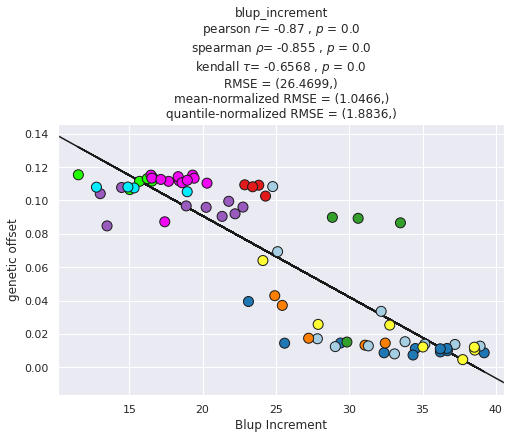

y = -0.00825x + 0.13835


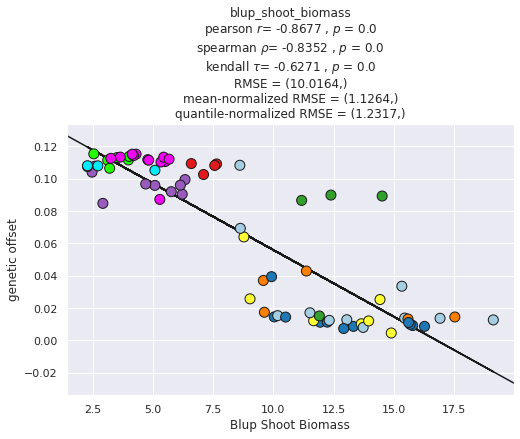

combined vancouver baypass-random k1
combined vancouver baypass-random k2
combined vancouver baypass-random k3
combined vancouver baypass-random k4
combined vancouver baypass-real full
y = -0.005x + 0.20007


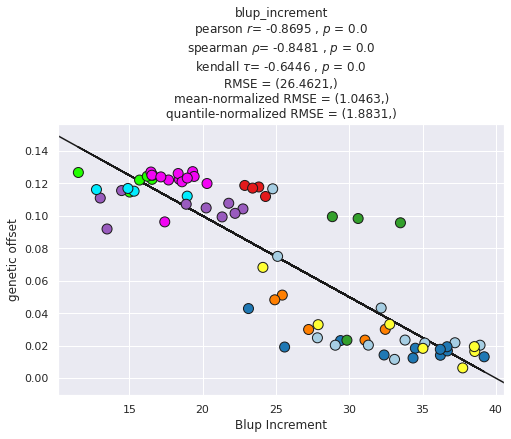

y = -0.00846x + 0.14871


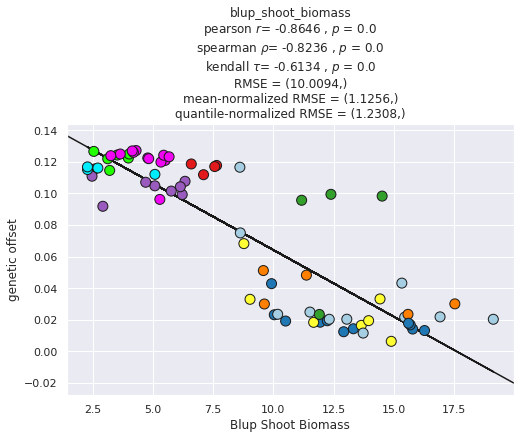

combined vancouver baypass-real k1
combined vancouver baypass-real k2
combined vancouver baypass-real k3
combined vancouver baypass-real k4
combined vancouver wza-random full
y = -0.00497x + 0.19186


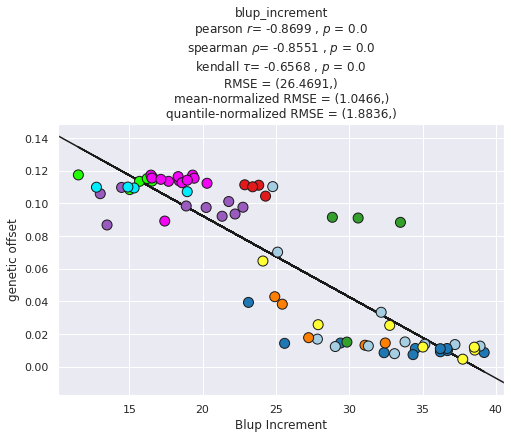

y = -0.00843x + 0.14108


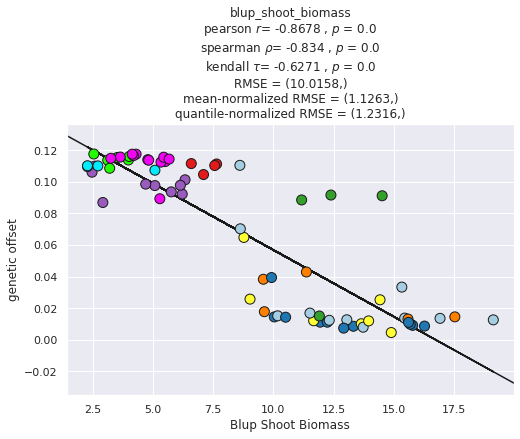

combined vancouver wza-random k1
combined vancouver wza-random k2
combined vancouver wza-random k3
combined vancouver wza-random k4
combined vancouver wza-real full
y = -0.00436x + 0.17971


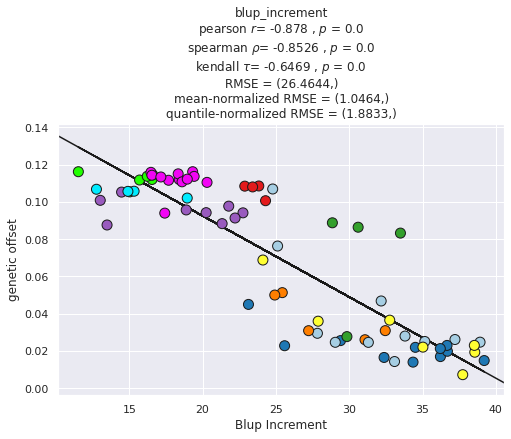

y = -0.00734x + 0.1347


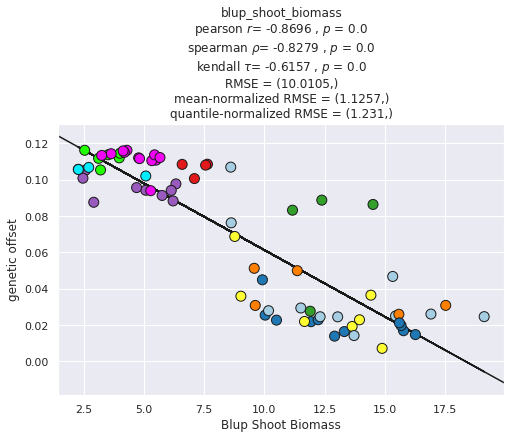

combined vancouver wza-real k1
combined vancouver wza-real k2
combined vancouver wza-real k3
combined vancouver wza-real k4
fdc vancouver baypass-random full
y = -0.00057x + 0.02837


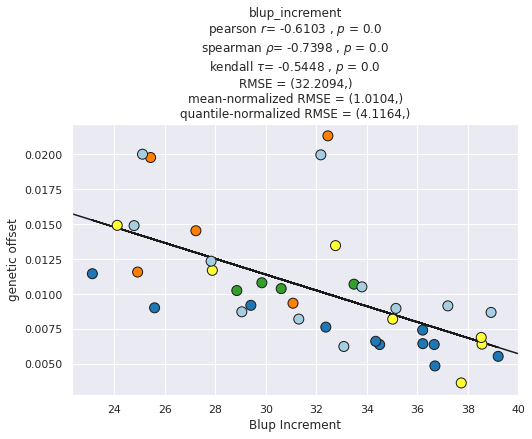

y = -0.00051x + 0.01691


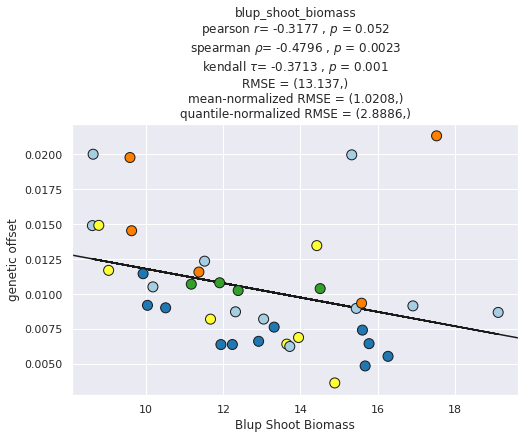

fdc vancouver baypass-random k1
fdc vancouver baypass-random k2
fdc vancouver baypass-random k3
fdc vancouver baypass-random k4
fdc vancouver baypass-real full
y = -0.0011x + 0.06113


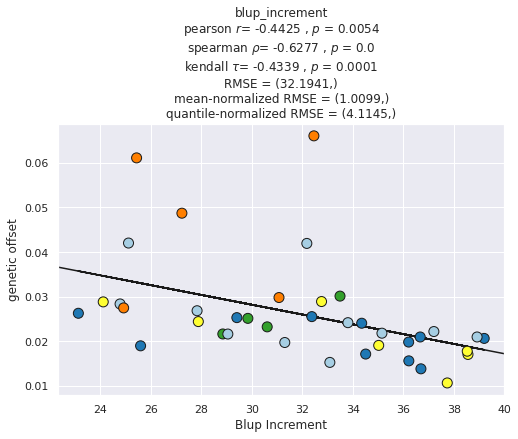

y = -0.00078x + 0.03616


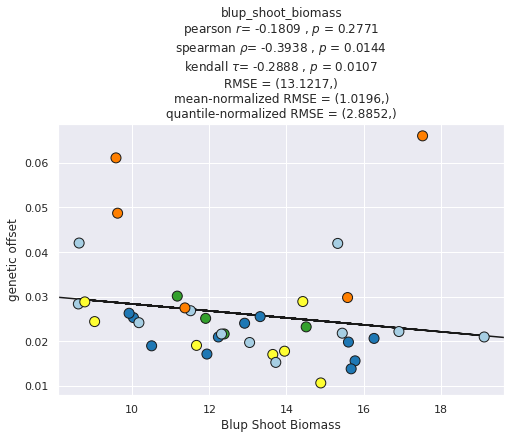

fdc vancouver baypass-real k1
fdc vancouver baypass-real k2
fdc vancouver baypass-real k3
fdc vancouver baypass-real k4
fdc vancouver wza-random full
y = -0.00056x + 0.02794


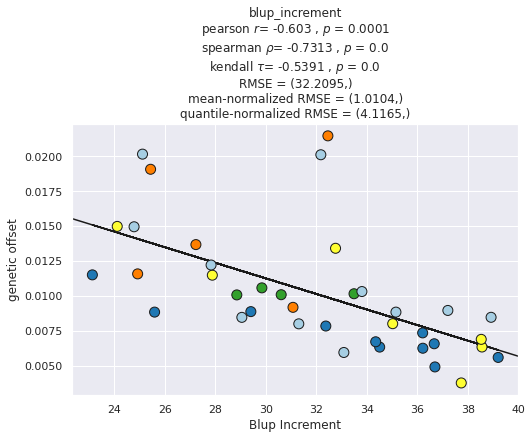

y = -0.00049x + 0.01654


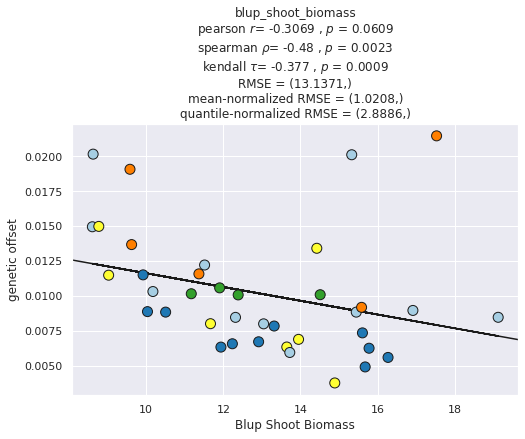

fdc vancouver wza-random k1
fdc vancouver wza-random k2
fdc vancouver wza-random k3
fdc vancouver wza-random k4
fdc vancouver wza-real full
y = -0.00105x + 0.06763


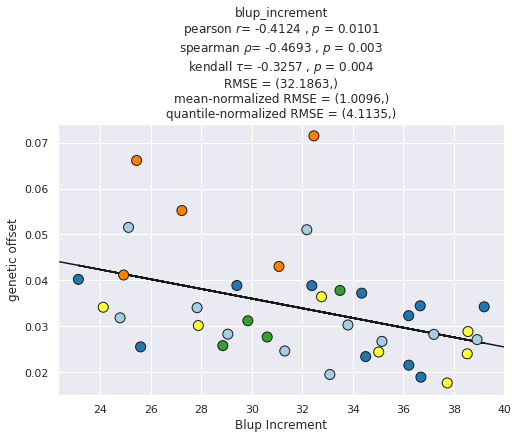

y = -0.00075x + 0.04374


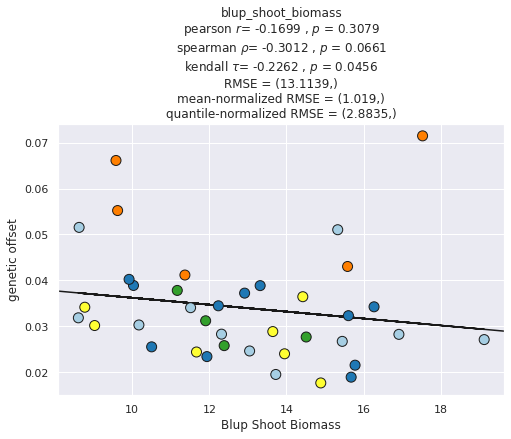

fdc vancouver wza-real k1
fdc vancouver wza-real k2
fdc vancouver wza-real k3
fdc vancouver wza-real k4
fdi vancouver baypass-random full
y = -0.00052x + 0.05475


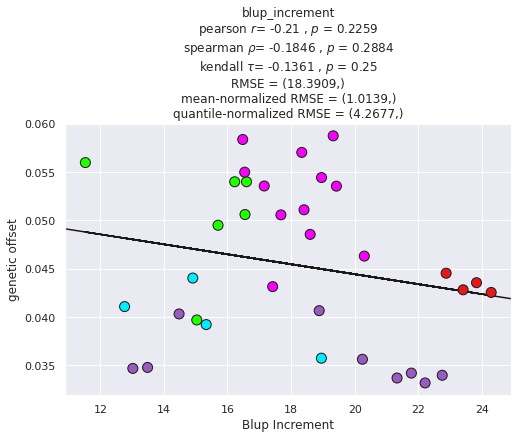

y = -0.00095x + 0.04976


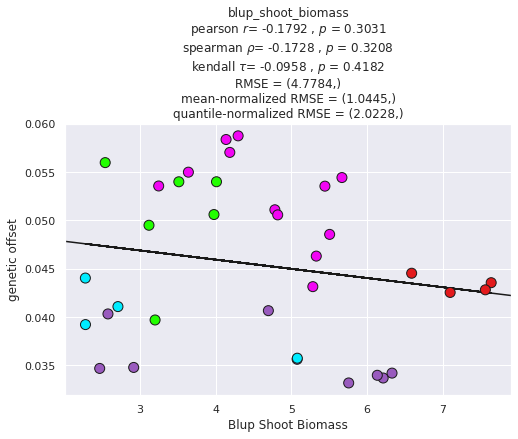

fdi vancouver baypass-random k1
fdi vancouver baypass-random k2
fdi vancouver baypass-random k3
fdi vancouver baypass-random k4
fdi vancouver baypass-real full
y = -0.00138x + 0.15268


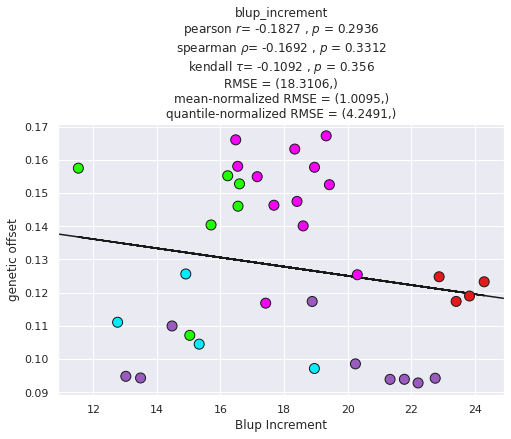

y = -0.0026x + 0.13952


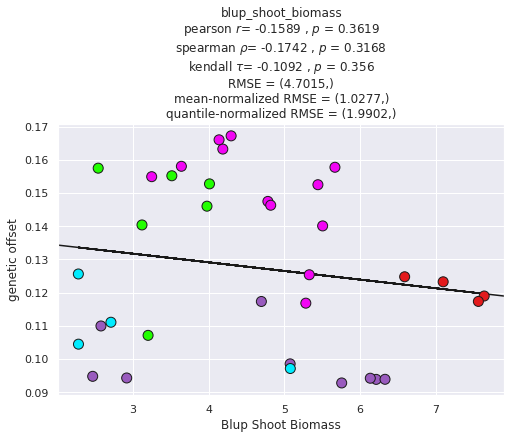

fdi vancouver baypass-real k1
fdi vancouver baypass-real k2
fdi vancouver baypass-real k3
fdi vancouver baypass-real k4
fdi vancouver wza-random full
y = -0.00049x + 0.05206


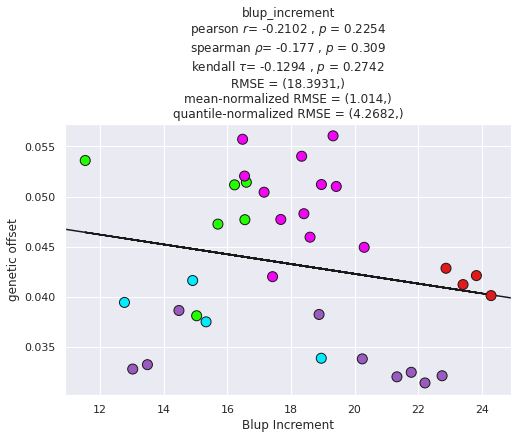

y = -0.00088x + 0.04722


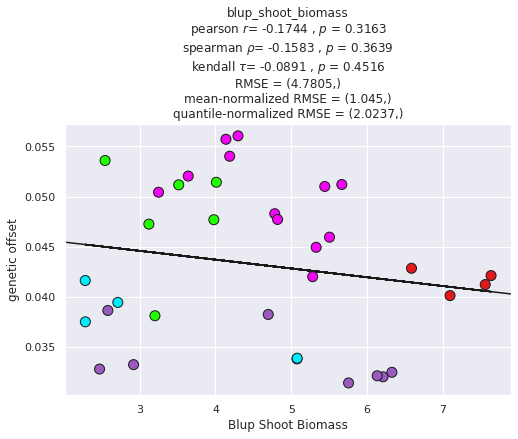

fdi vancouver wza-random k1
fdi vancouver wza-random k2
fdi vancouver wza-random k3
fdi vancouver wza-random k4
fdi vancouver wza-real full
y = -0.00172x + 0.17749


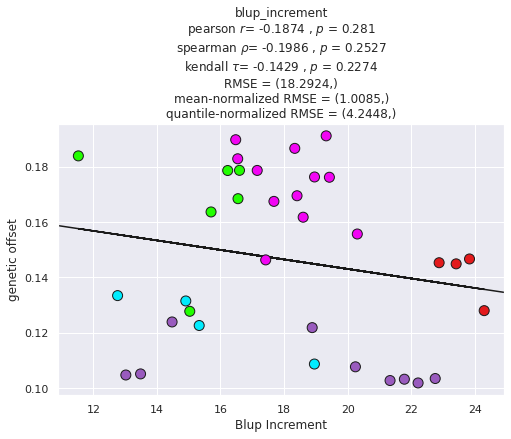

y = -0.00274x + 0.15884


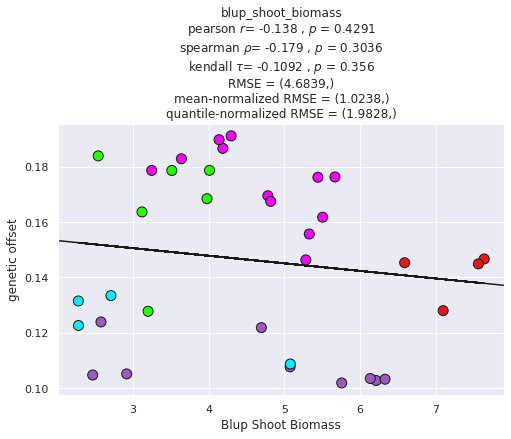

fdi vancouver wza-real k1
fdi vancouver wza-real k2
fdi vancouver wza-real k3
fdi vancouver wza-real k4
jp christine baypass-random full
y = 0.0002x + -0.00193


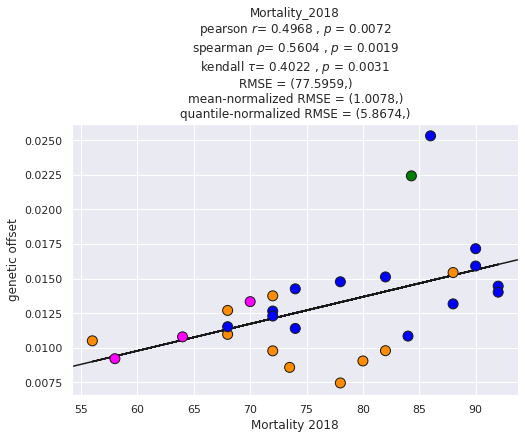

y = -1e-05x + 0.03235


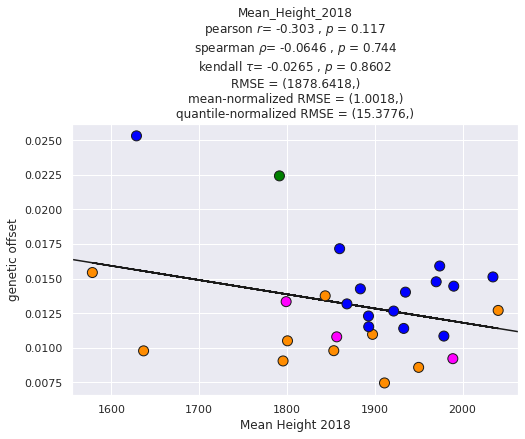

y = -0.0x + 0.01379


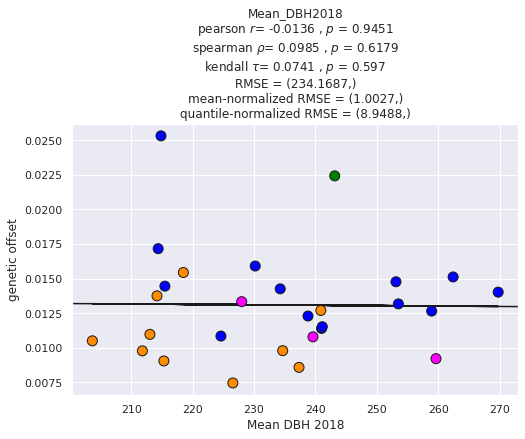

jp christine baypass-random k1
jp christine baypass-random k2
jp christine baypass-random k3
jp christine baypass-real full
y = 0.00054x + -0.01206


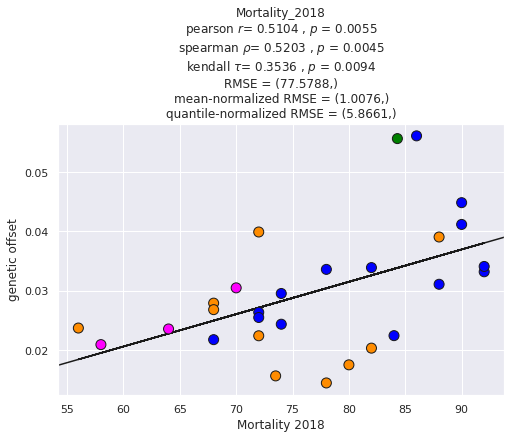

y = -3e-05x + 0.08085


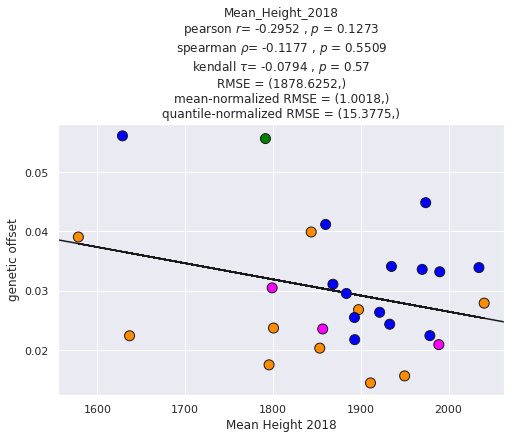

y = -3e-05x + 0.03799


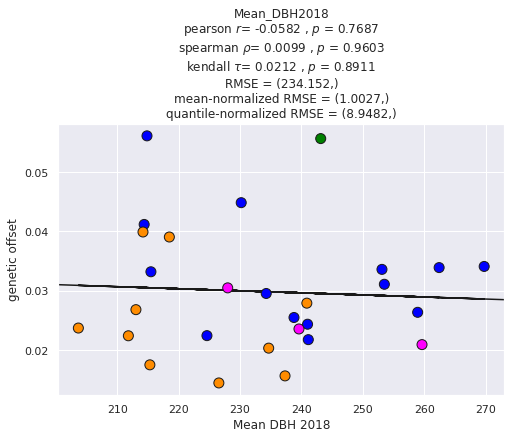

jp christine baypass-real k1
jp christine baypass-real k2
jp christine baypass-real k3
jp christine wza-random full
y = 0.00019x + -0.00131


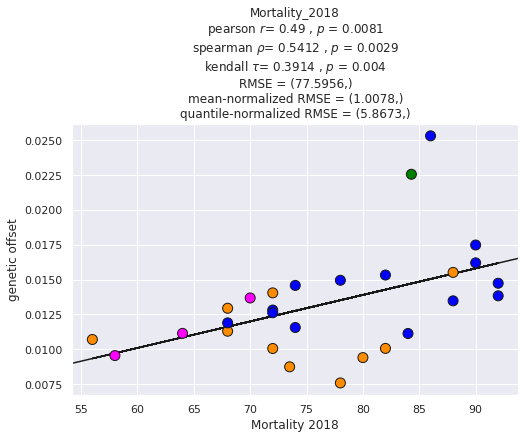

y = -1e-05x + 0.03223


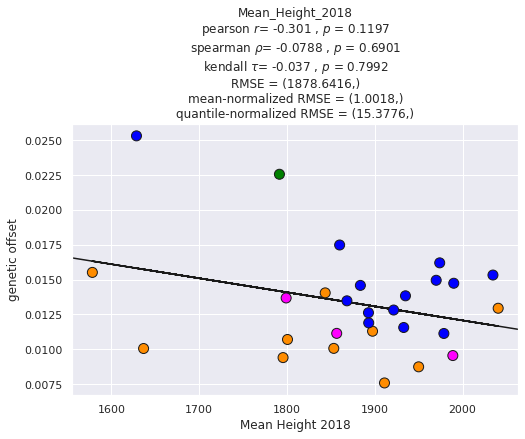

y = -0.0x + 0.01446


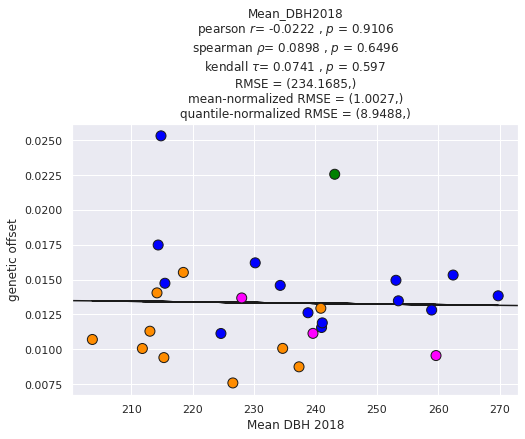

jp christine wza-random k1
jp christine wza-random k2
jp christine wza-random k3
jp christine wza-real full
y = 0.00065x + -0.01597


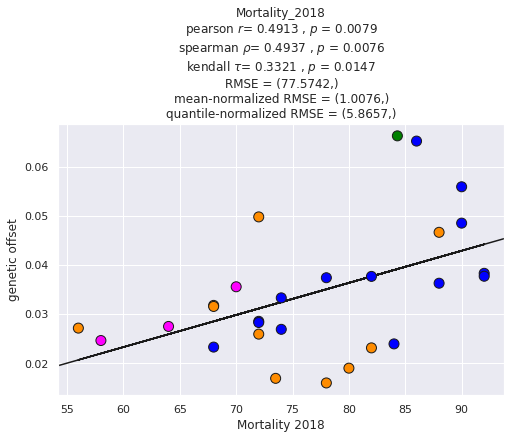

y = -4e-05x + 0.10062


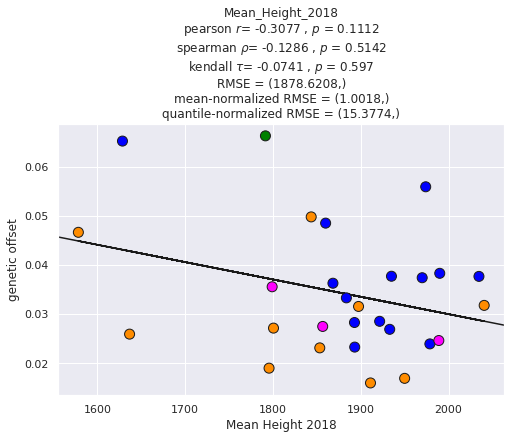

y = -7e-05x + 0.05126


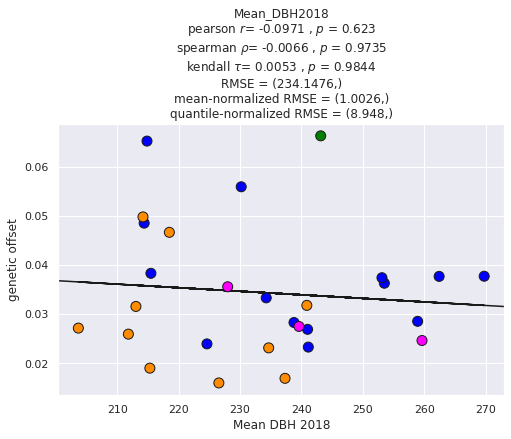

jp christine wza-real k1
jp christine wza-real k2
jp christine wza-real k3
jp fontbrune baypass-random full
y = 0.00013x + 0.00173


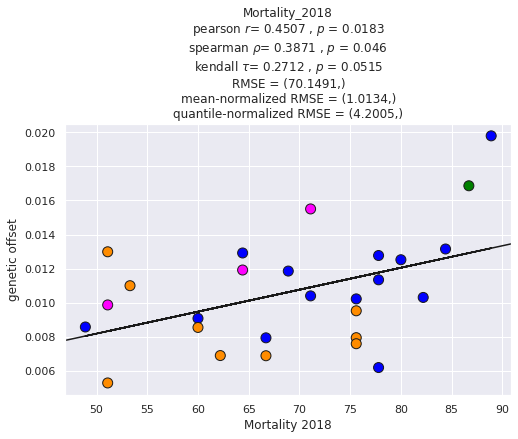

y = -2e-05x + 0.04028


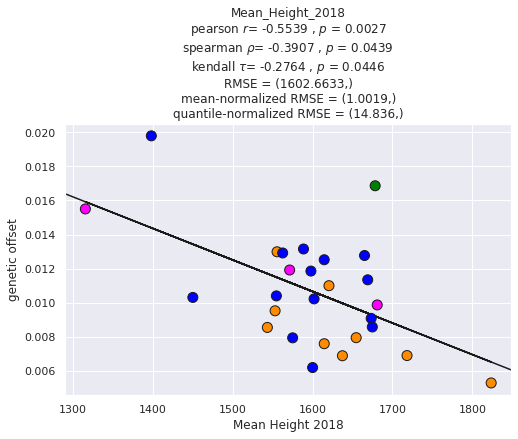

y = -9e-05x + 0.02647


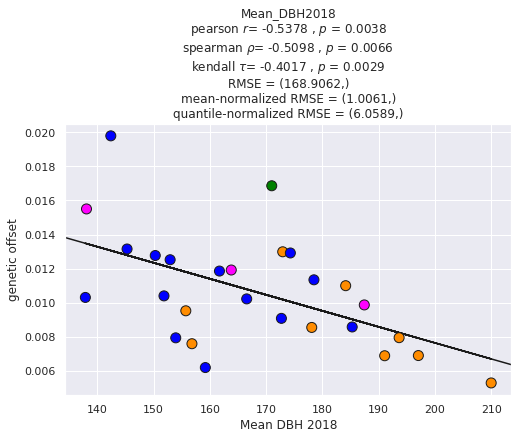

jp fontbrune baypass-random k1
jp fontbrune baypass-random k2
jp fontbrune baypass-random k3
jp fontbrune baypass-real full
y = 0.0004x + -0.0005


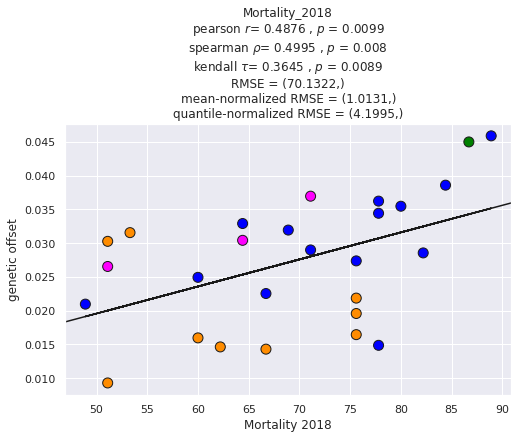

y = -4e-05x + 0.09503


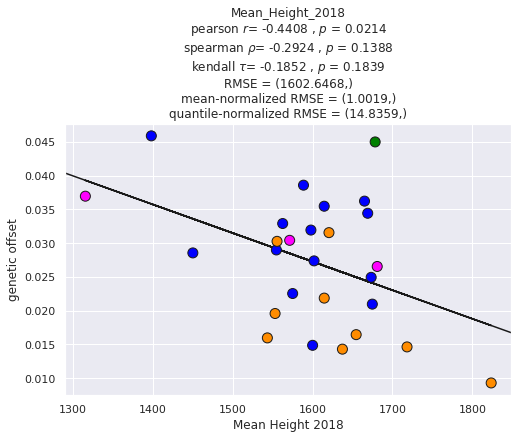

y = -0.0003x + 0.07689


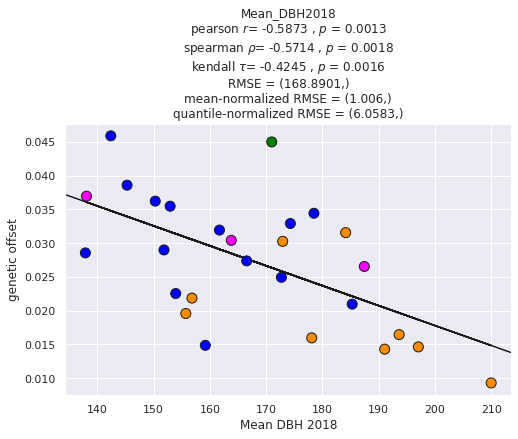

jp fontbrune baypass-real k1
jp fontbrune baypass-real k2
jp fontbrune baypass-real k3
jp fontbrune wza-random full
y = 0.00012x + 0.00254


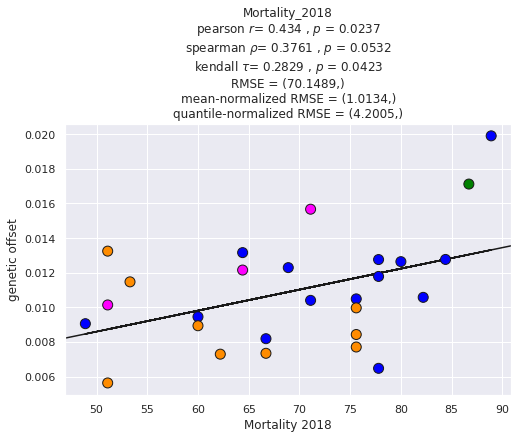

y = -2e-05x + 0.03967


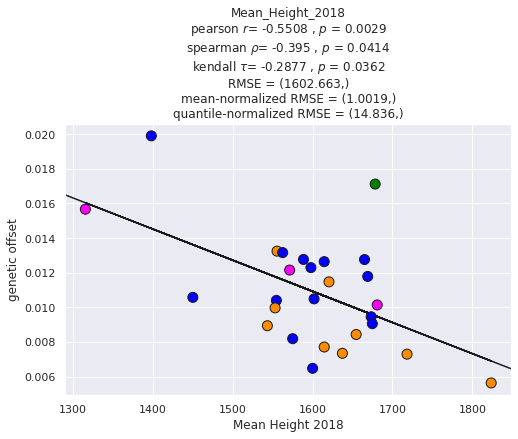

y = -9e-05x + 0.02566


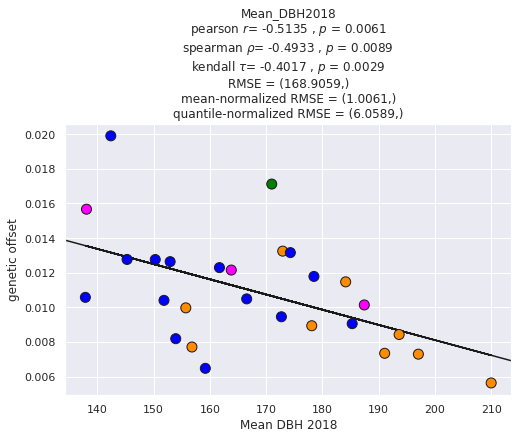

jp fontbrune wza-random k1
jp fontbrune wza-random k2
jp fontbrune wza-random k3
jp fontbrune wza-real full
y = 0.00047x + -0.00054


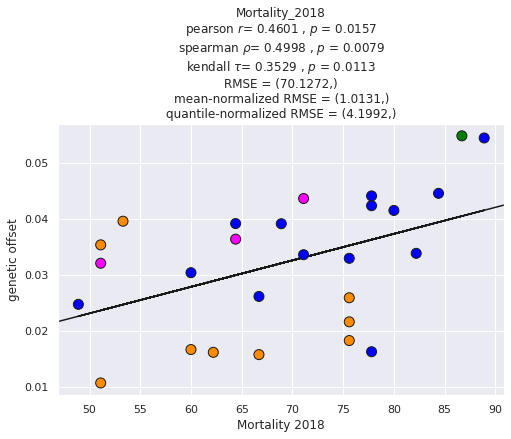

y = -5e-05x + 0.10983


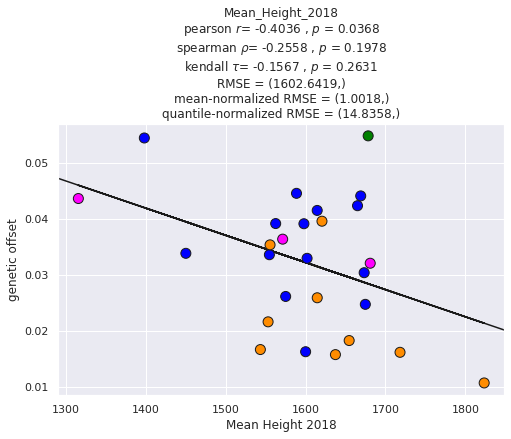

y = -0.00035x + 0.09017


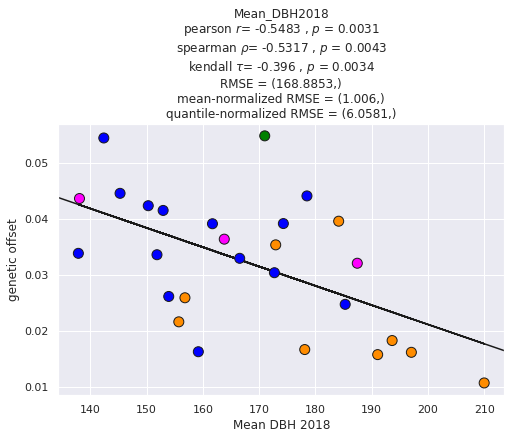

jp fontbrune wza-real k1
jp fontbrune wza-real k2
jp fontbrune wza-real k3
Function `get_statistics` completed after : 0-00:00:13


In [25]:
validation_scores = get_statistics()

combined vancouver baypass-random full
y = -155.57719x + 35.40641


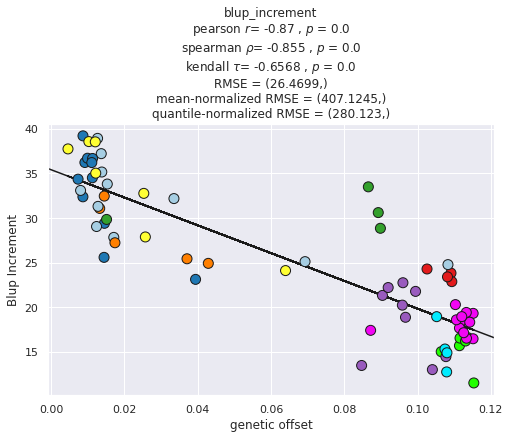

y = -91.29531x + 14.82815


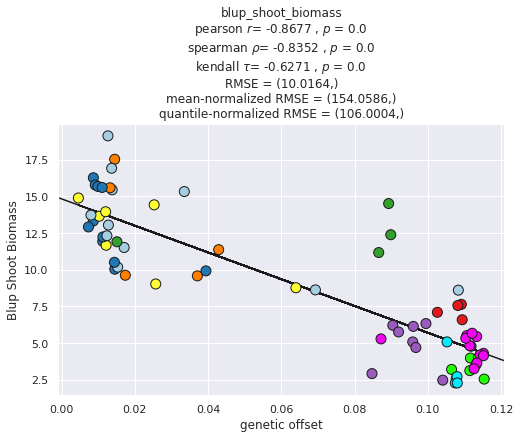

combined vancouver baypass-random k1
combined vancouver baypass-random k2
combined vancouver baypass-random k3
combined vancouver baypass-random k4
combined vancouver baypass-real full
y = -151.05033x + 36.39155


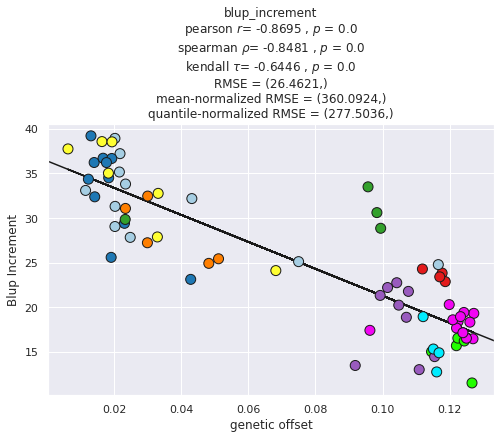

y = -88.37526x + 15.38687


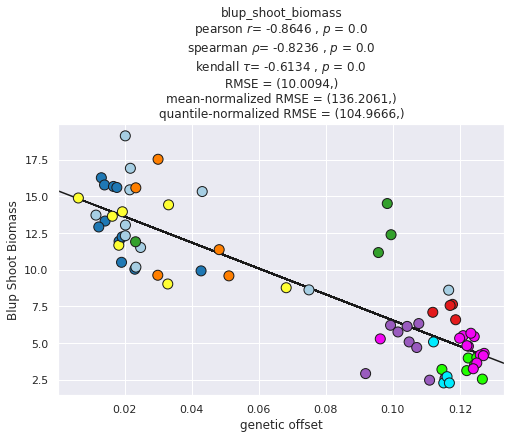

combined vancouver baypass-real k1
combined vancouver baypass-real k2
combined vancouver baypass-real k3
combined vancouver baypass-real k4
combined vancouver wza-random full
y = -152.20542x + 35.35486


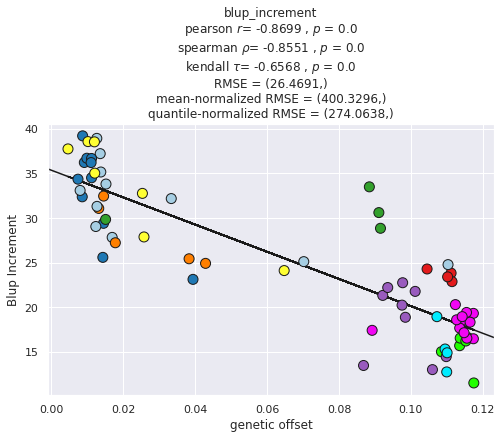

y = -89.33851x + 14.79934


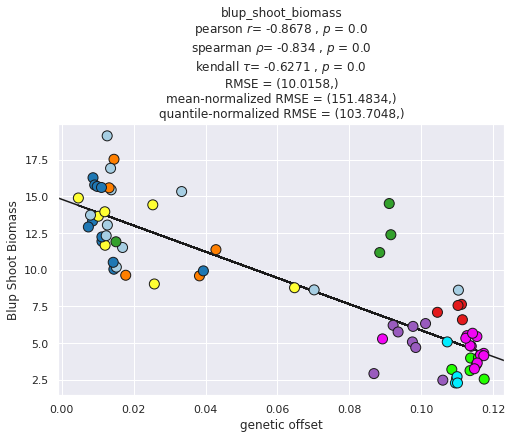

combined vancouver wza-random k1
combined vancouver wza-random k2
combined vancouver wza-random k3
combined vancouver wza-random k4
combined vancouver wza-real full
y = -176.80466x + 37.56595


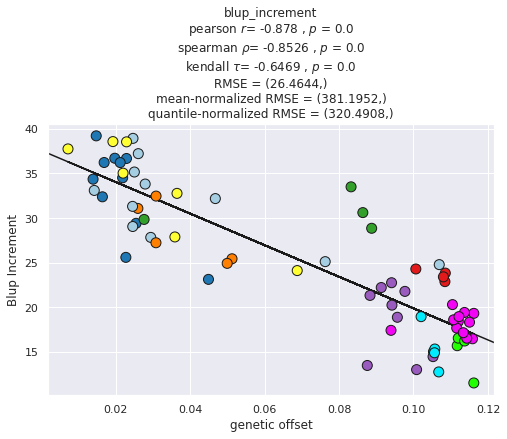

y = -103.02539x + 16.04496


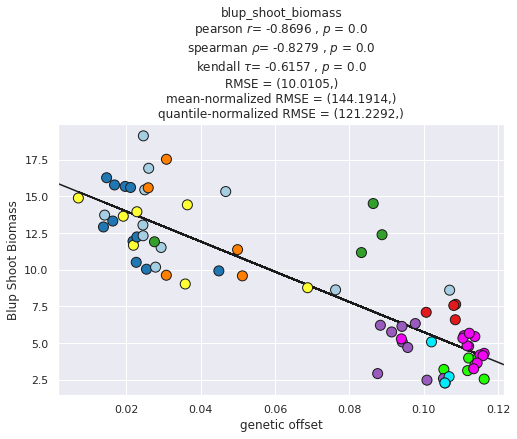

combined vancouver wza-real k1
combined vancouver wza-real k2
combined vancouver wza-real k3
combined vancouver wza-real k4
fdc vancouver baypass-random full
y = -658.18774x + 38.67691


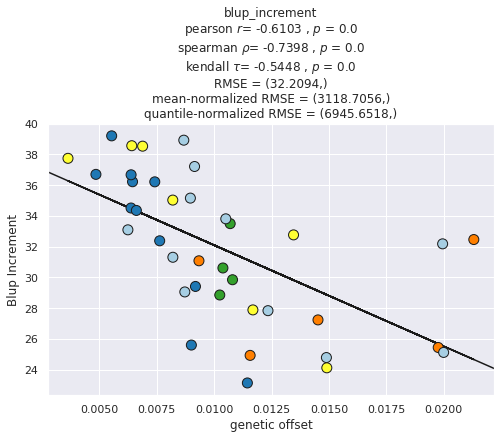

y = -197.23669x + 14.90622


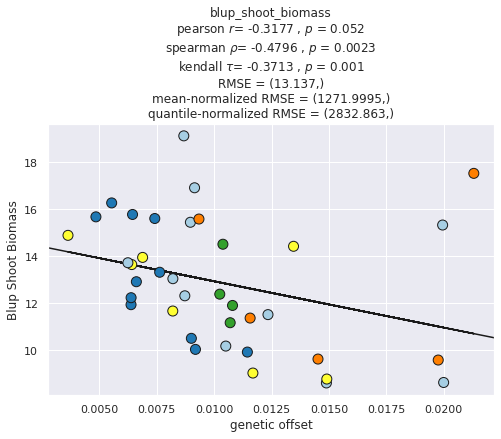

fdc vancouver baypass-random k1
fdc vancouver baypass-random k2
fdc vancouver baypass-random k3
fdc vancouver baypass-random k4
fdc vancouver baypass-real full
y = -178.3321x + 36.53828


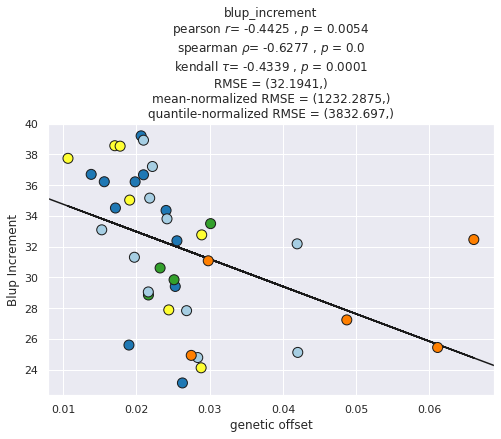

y = -41.97272x + 13.96575


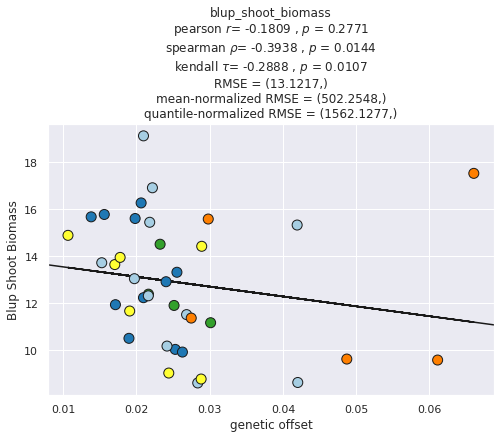

fdc vancouver baypass-real k1
fdc vancouver baypass-real k2
fdc vancouver baypass-real k3
fdc vancouver baypass-real k4
fdc vancouver wza-random full
y = -653.66546x + 38.55467


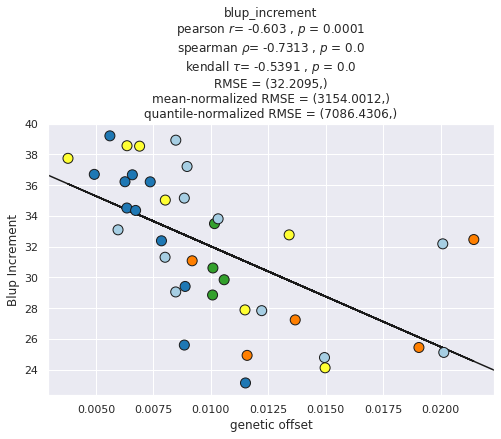

y = -191.53293x + 14.82518


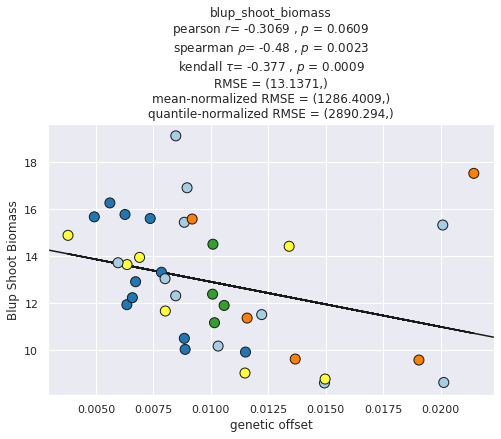

fdc vancouver wza-random k1
fdc vancouver wza-random k2
fdc vancouver wza-random k3
fdc vancouver wza-random k4
fdc vancouver wza-real full
y = -161.4026x + 37.37225


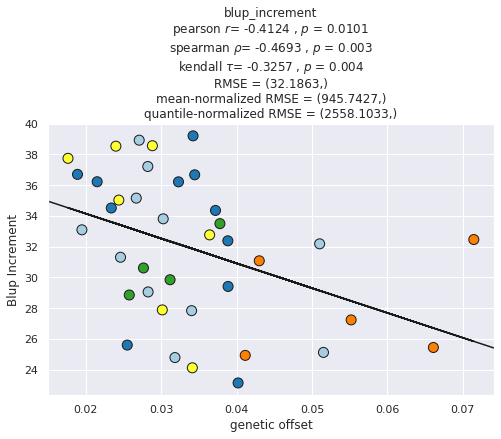

y = -38.27045x + 14.17164


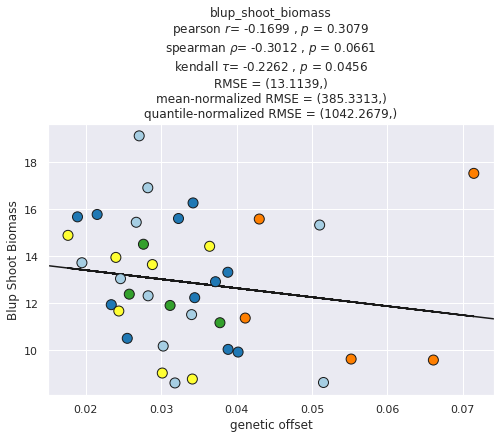

fdc vancouver wza-real k1
fdc vancouver wza-real k2
fdc vancouver wza-real k3
fdc vancouver wza-real k4
fdi vancouver baypass-random full
y = -85.56585x + 22.02338


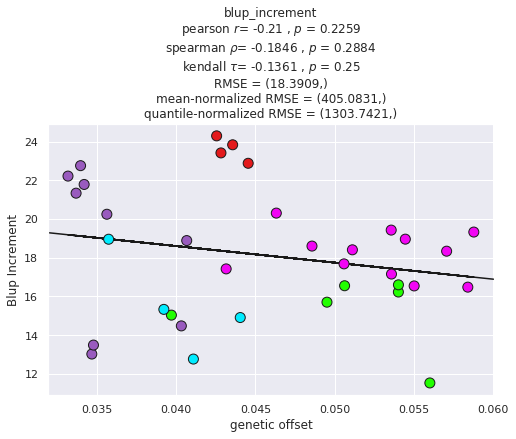

y = -33.70472x + 6.10502


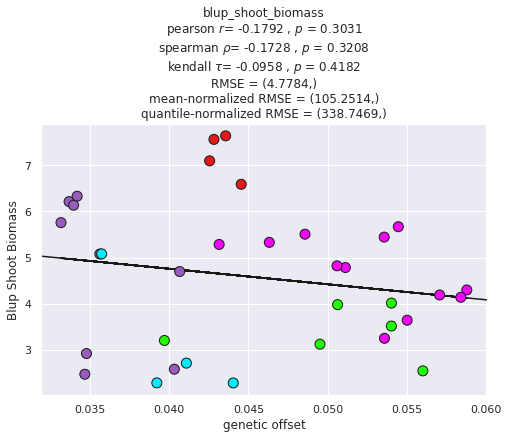

fdi vancouver baypass-random k1
fdi vancouver baypass-random k2
fdi vancouver baypass-random k3
fdi vancouver baypass-random k4
fdi vancouver baypass-real full
y = -24.14238x + 21.21937


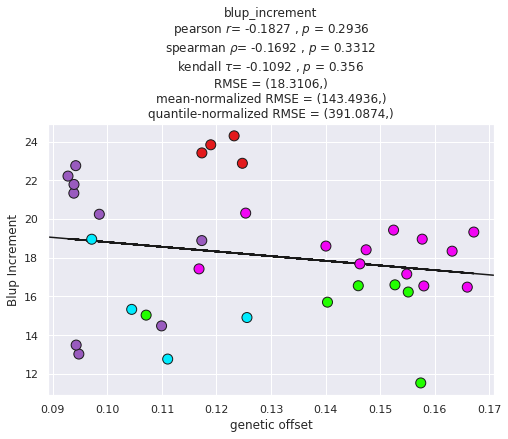

y = -9.69902x + 5.81246


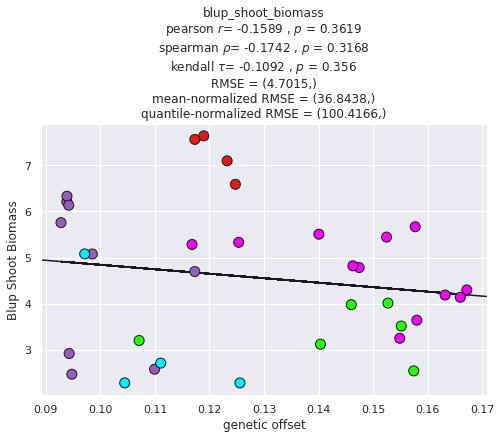

fdi vancouver baypass-real k1
fdi vancouver baypass-real k2
fdi vancouver baypass-real k3
fdi vancouver baypass-real k4
fdi vancouver wza-random full
y = -90.45417x + 22.04624


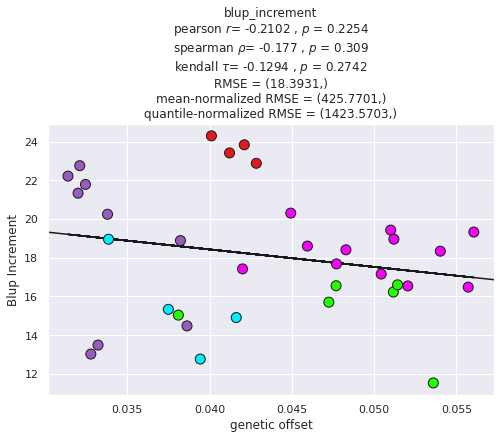

y = -34.65235x + 6.07177


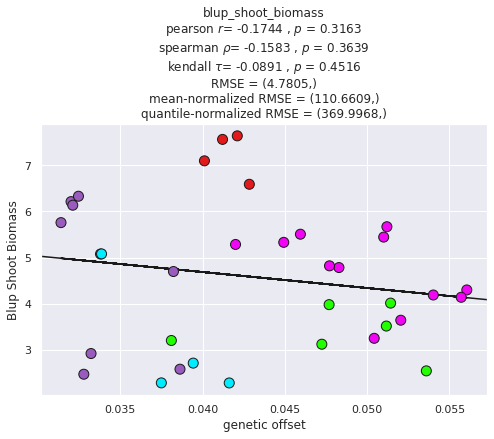

fdi vancouver wza-random k1
fdi vancouver wza-random k2
fdi vancouver wza-random k3
fdi vancouver wza-random k4
fdi vancouver wza-real full
y = -20.42088x + 21.12607


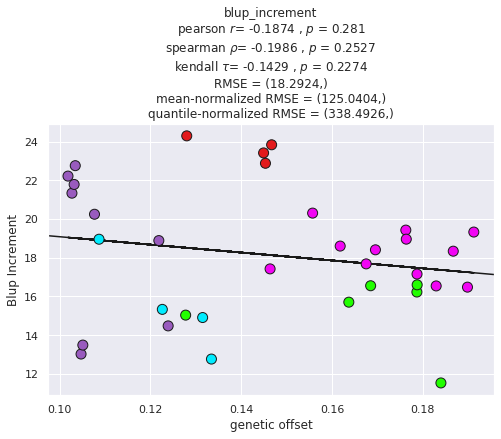

y = -6.9452x + 5.59084


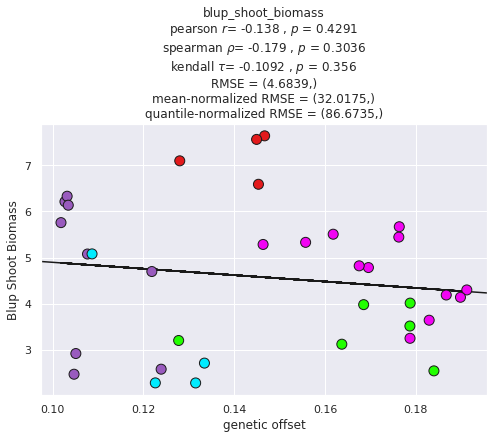

fdi vancouver wza-real k1
fdi vancouver wza-real k2
fdi vancouver wza-real k3
fdi vancouver wza-real k4
jp christine baypass-random full
y = 1264.93363x + 60.43311


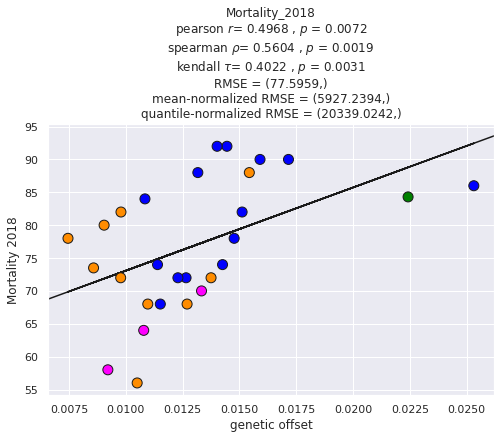

y = -8940.36911x + 1992.28889


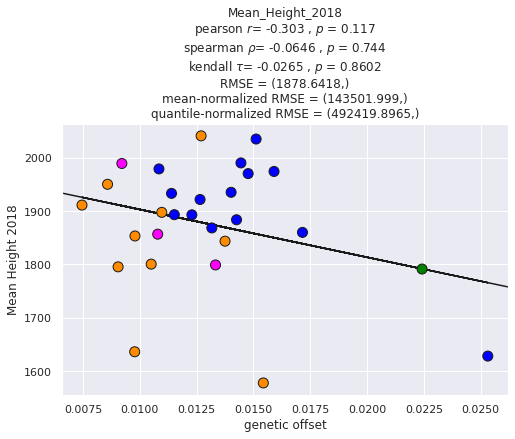

y = -62.02067x + 234.34354


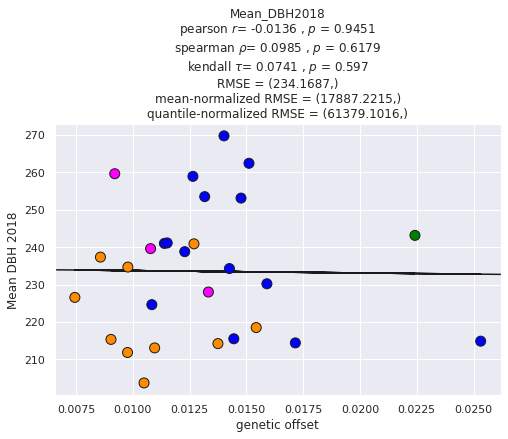

jp christine baypass-random k1
jp christine baypass-random k2
jp christine baypass-random k3
jp christine baypass-real full
y = 478.31541x + 62.70153


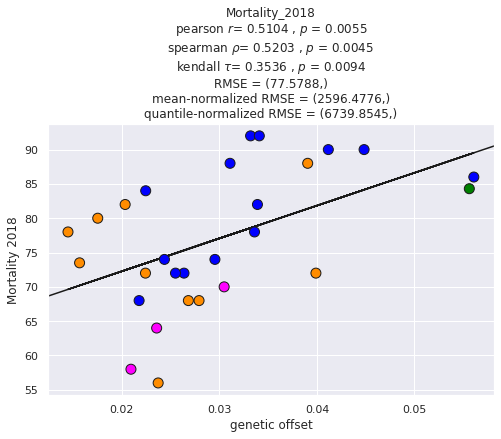

y = -3205.30715x + 1971.01663


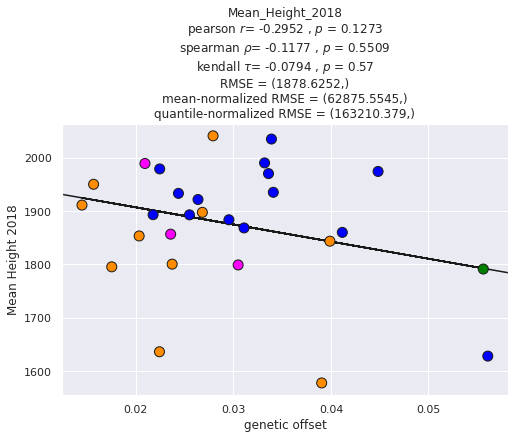

y = -97.4054x + 236.44193


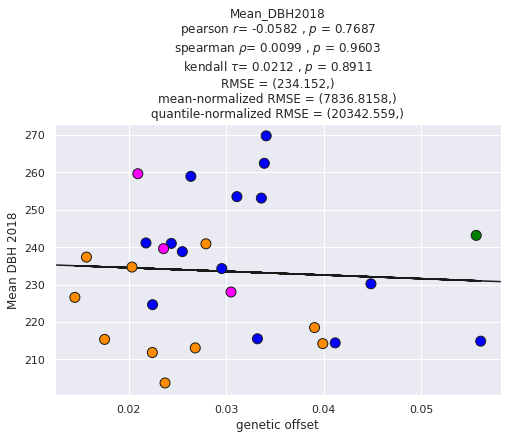

jp christine baypass-real k1
jp christine baypass-real k2
jp christine baypass-real k3
jp christine wza-random full
y = 1262.64438x + 60.16402


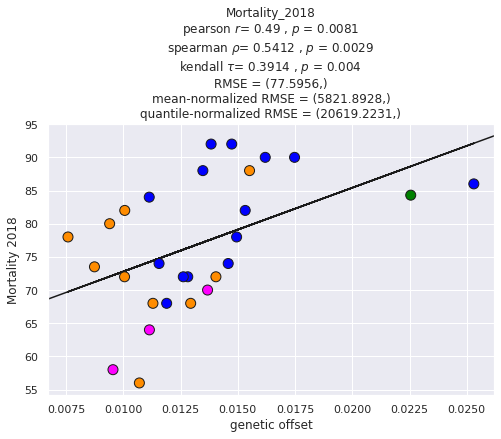

y = -8986.47123x + 1995.02088


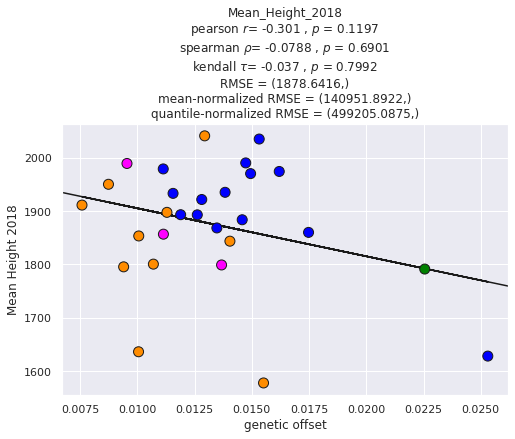

y = -102.33286x + 234.89552


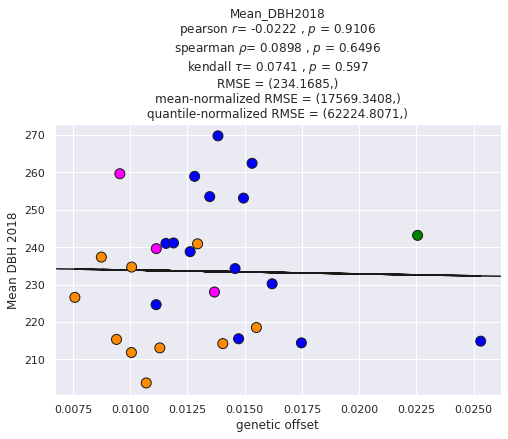

jp christine wza-random k1
jp christine wza-random k2
jp christine wza-random k3
jp christine wza-real full
y = 369.24811x + 64.30266


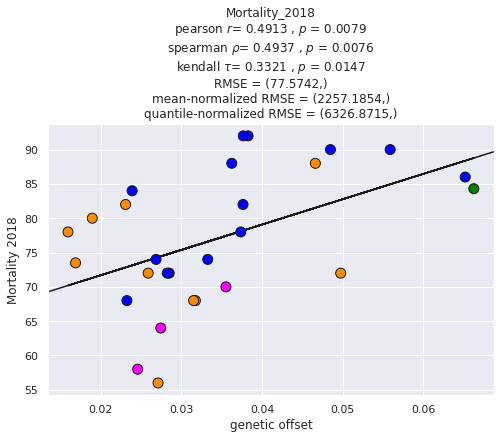

y = -2679.50647x + 1967.33533


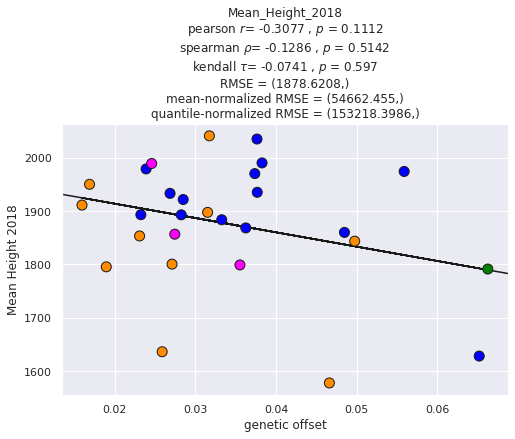

y = -130.37467x + 238.01228


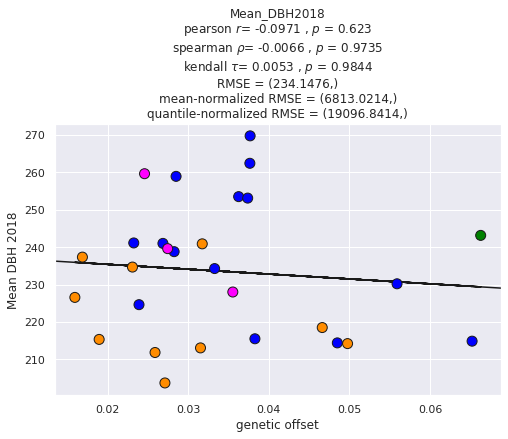

jp christine wza-real k1
jp christine wza-real k2
jp christine wza-real k3
jp fontbrune baypass-random full
y = 1574.45827x + 52.44274


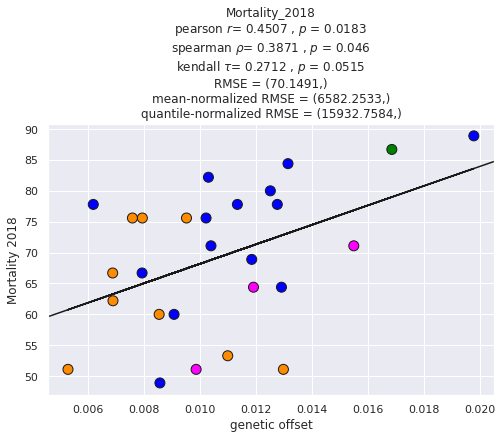

y = -16566.38509x + 1776.23585


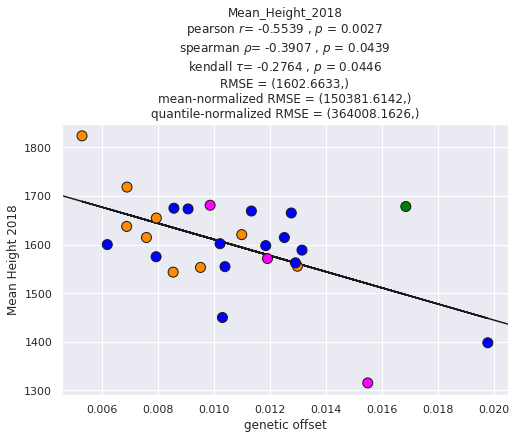

y = -3070.8167x + 200.60645


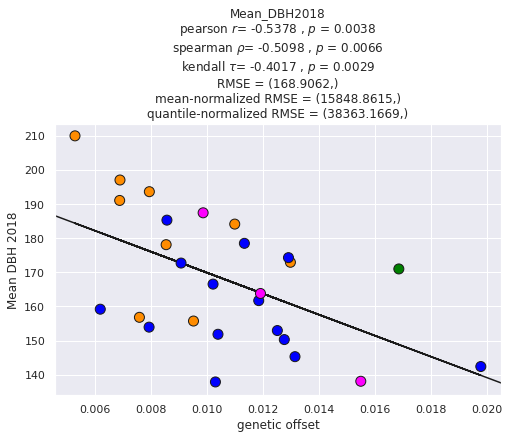

jp fontbrune baypass-random k1
jp fontbrune baypass-random k2
jp fontbrune baypass-random k3
jp fontbrune baypass-real full
y = 592.71499x + 53.05794


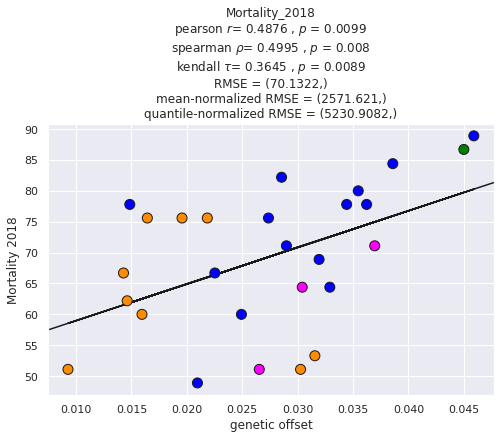

y = -4586.59697x + 1724.7666


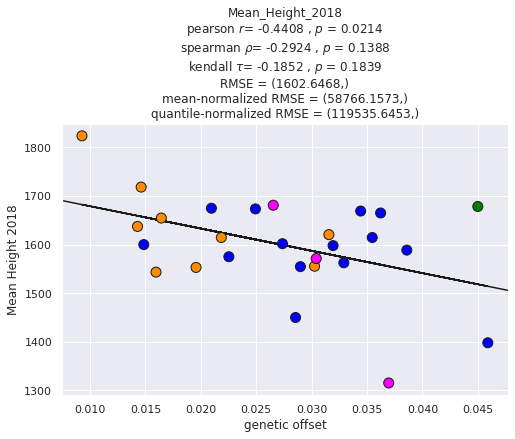

y = -1166.83125x + 199.70117


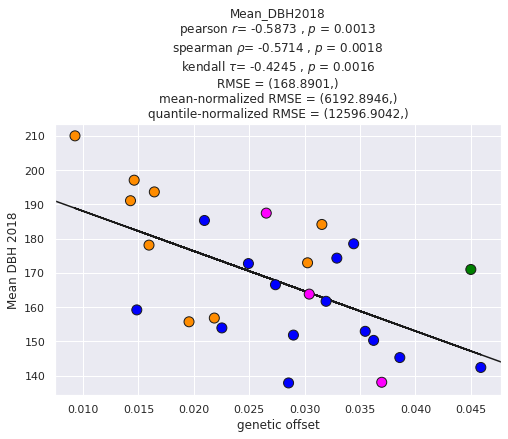

jp fontbrune baypass-real k1
jp fontbrune baypass-real k2
jp fontbrune baypass-real k3
jp fontbrune wza-random full
y = 1554.08315x + 52.24044


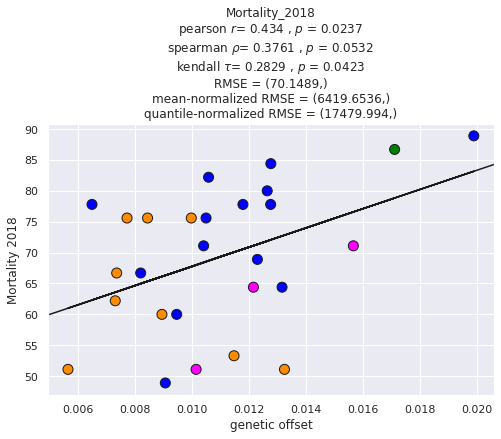

y = -16883.55708x + 1784.17282


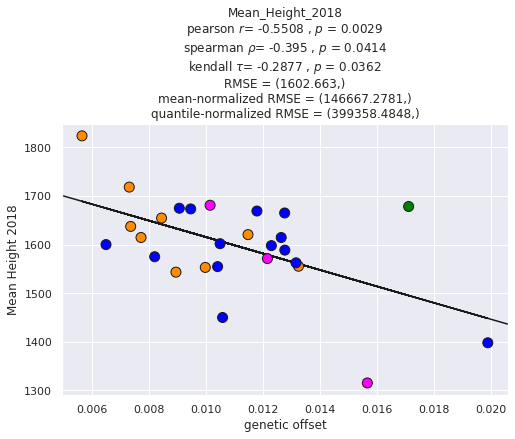

y = -3005.53159x + 200.72187


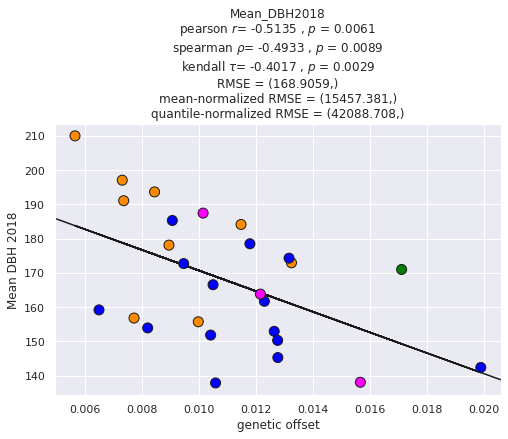

jp fontbrune wza-random k1
jp fontbrune wza-random k2
jp fontbrune wza-random k3
jp fontbrune wza-real full
y = 447.17257x + 54.80824


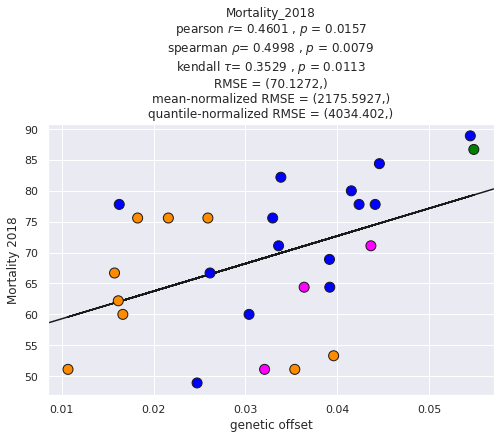

y = -3357.73903x + 1707.91478


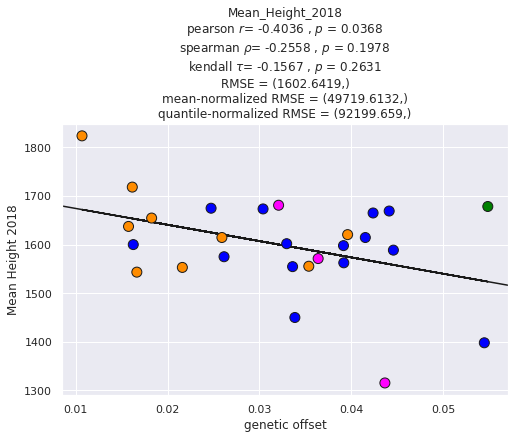

y = -870.95724x + 195.9539


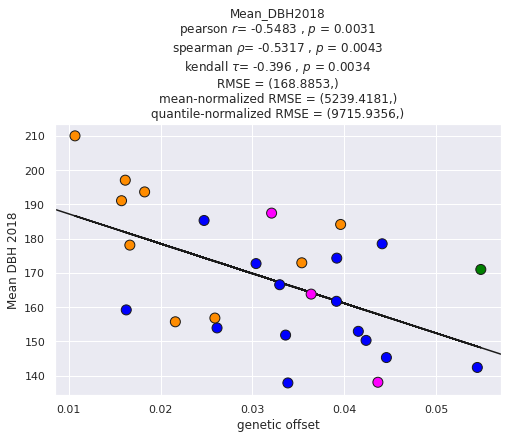

jp fontbrune wza-real k1
jp fontbrune wza-real k2
jp fontbrune wza-real k3
Function `get_statistics` completed after : 0-00:00:13


In [26]:
_ = get_statistics(switch_xy=True)

combined vancouver baypass-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_baypass-random_full_regplot_blup_increment.pdf


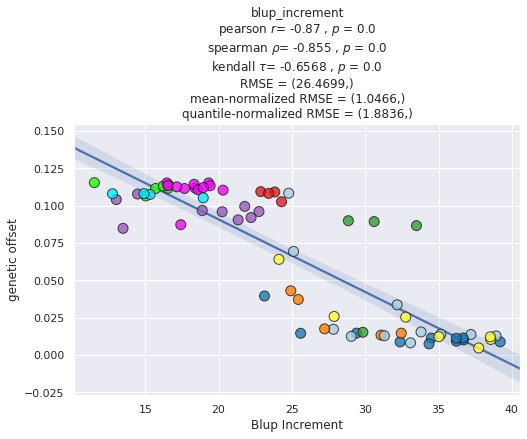

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


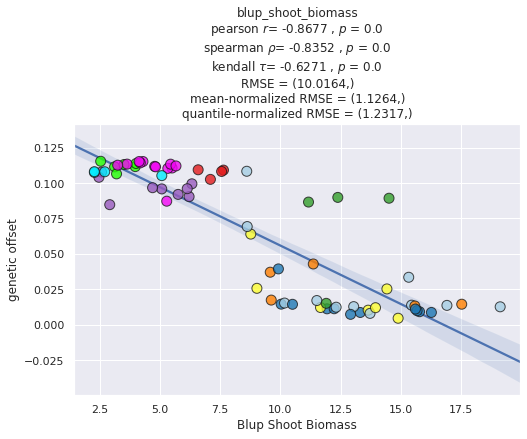

combined vancouver baypass-random k1
combined vancouver baypass-random k2
combined vancouver baypass-random k3
combined vancouver baypass-random k4
combined vancouver baypass-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_baypass-real_full_regplot_blup_increment.pdf


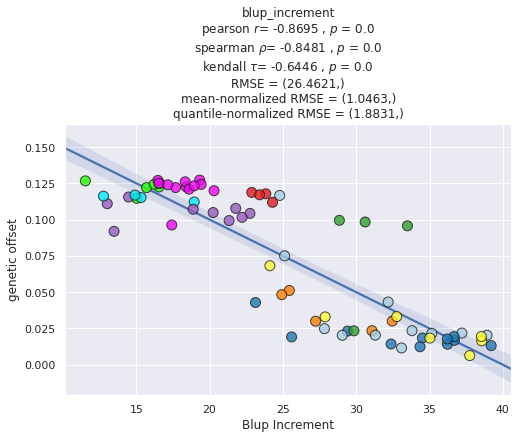

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


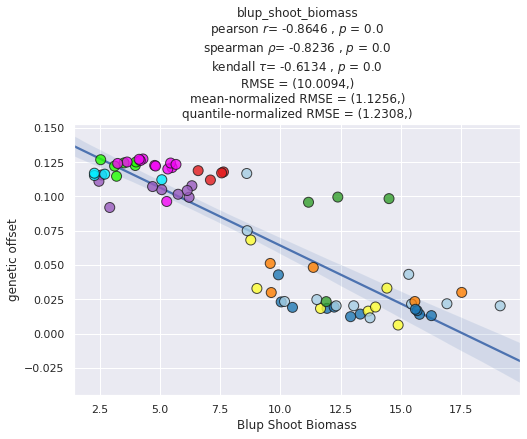

combined vancouver baypass-real k1
combined vancouver baypass-real k2
combined vancouver baypass-real k3
combined vancouver baypass-real k4
combined vancouver wza-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_wza-random_full_regplot_blup_increment.pdf


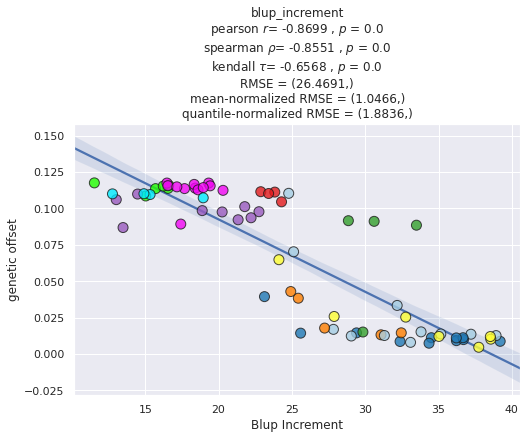

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


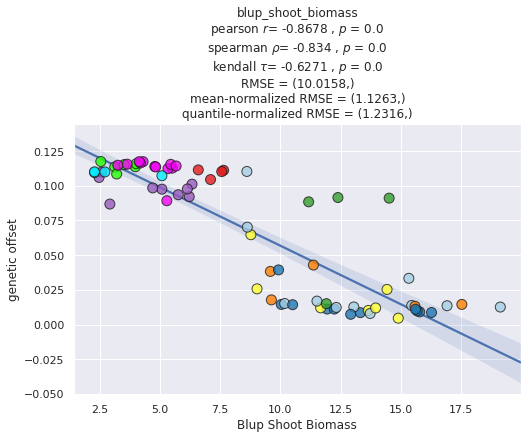

combined vancouver wza-random k1
combined vancouver wza-random k2
combined vancouver wza-random k3
combined vancouver wza-random k4
combined vancouver wza-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_wza-real_full_regplot_blup_increment.pdf


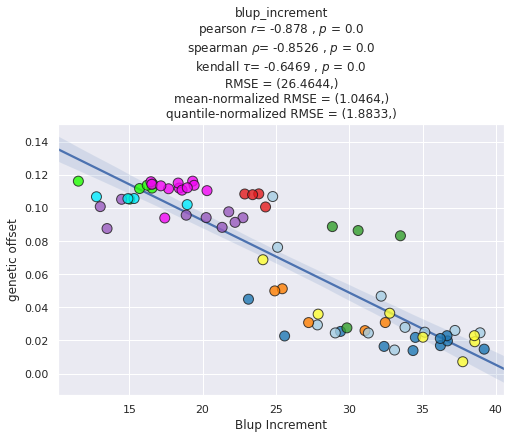

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/combined_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


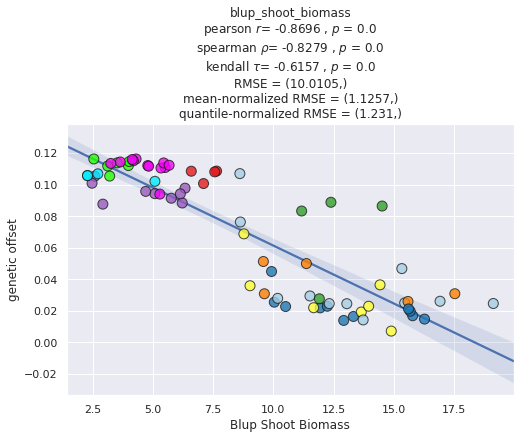

combined vancouver wza-real k1
combined vancouver wza-real k2
combined vancouver wza-real k3
combined vancouver wza-real k4
fdc vancouver baypass-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_baypass-random_full_regplot_blup_increment.pdf


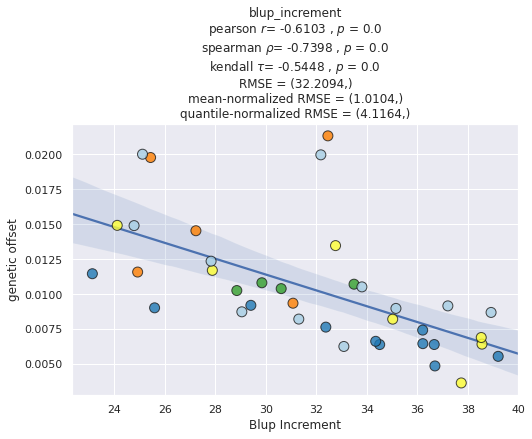

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


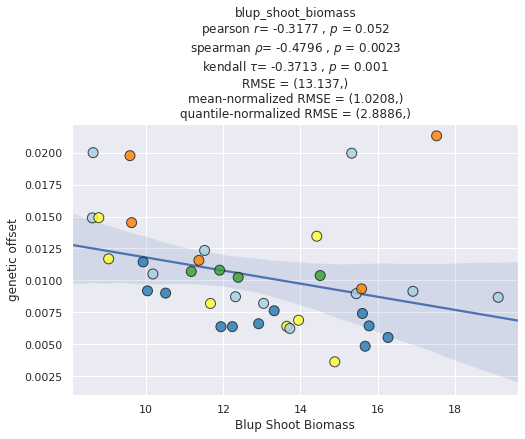

fdc vancouver baypass-random k1
fdc vancouver baypass-random k2
fdc vancouver baypass-random k3
fdc vancouver baypass-random k4
fdc vancouver baypass-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_baypass-real_full_regplot_blup_increment.pdf


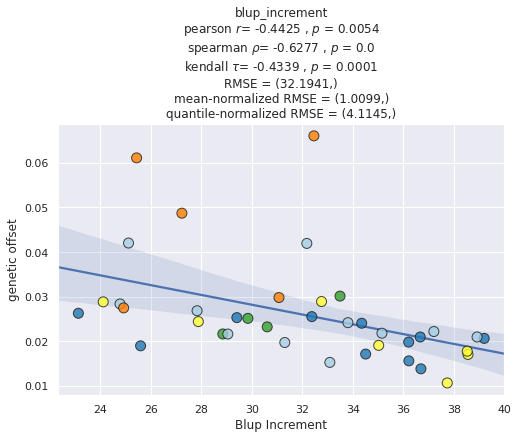

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


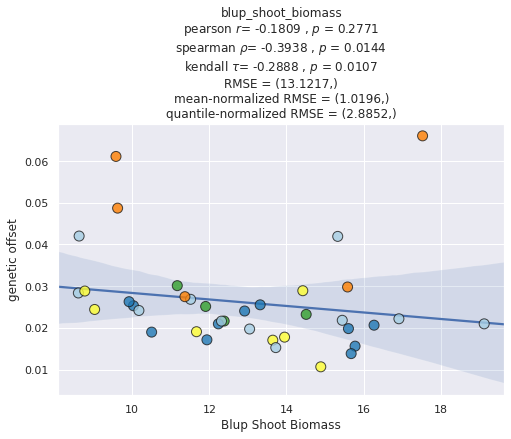

fdc vancouver baypass-real k1
fdc vancouver baypass-real k2
fdc vancouver baypass-real k3
fdc vancouver baypass-real k4
fdc vancouver wza-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_wza-random_full_regplot_blup_increment.pdf


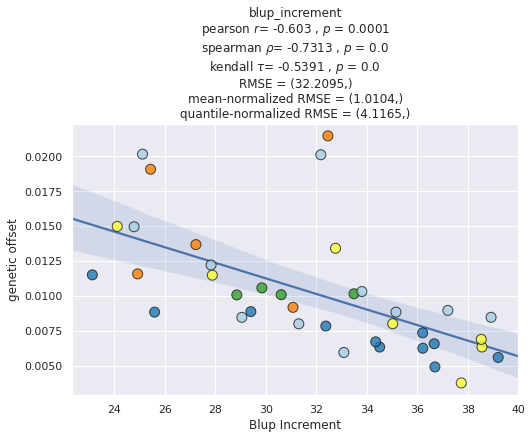

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


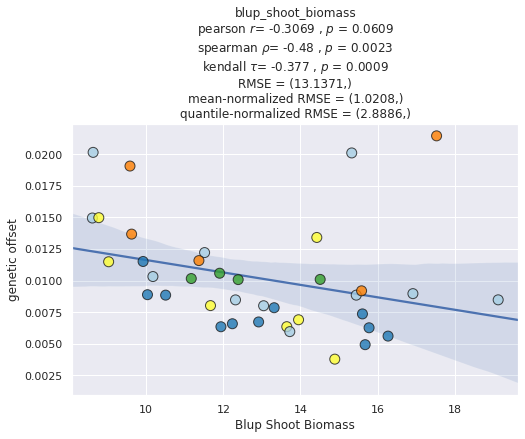

fdc vancouver wza-random k1
fdc vancouver wza-random k2
fdc vancouver wza-random k3
fdc vancouver wza-random k4
fdc vancouver wza-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_wza-real_full_regplot_blup_increment.pdf


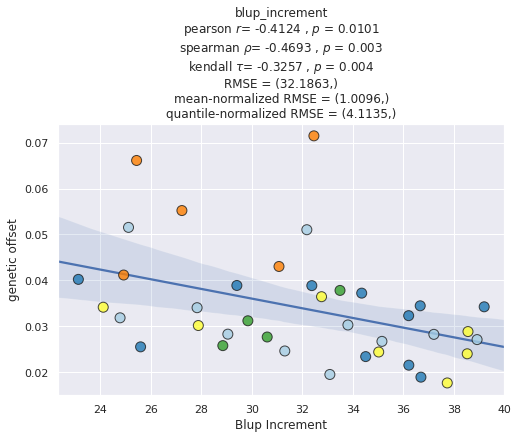

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


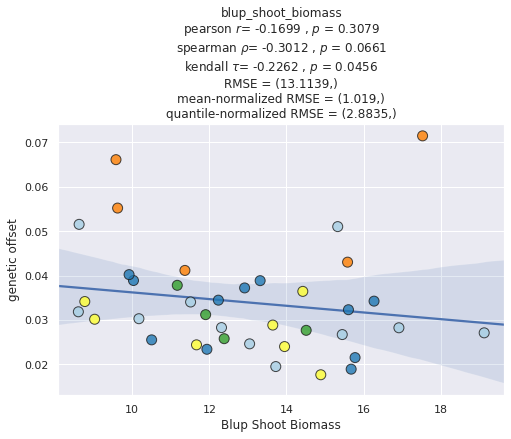

fdc vancouver wza-real k1
fdc vancouver wza-real k2
fdc vancouver wza-real k3
fdc vancouver wza-real k4
fdi vancouver baypass-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_baypass-random_full_regplot_blup_increment.pdf


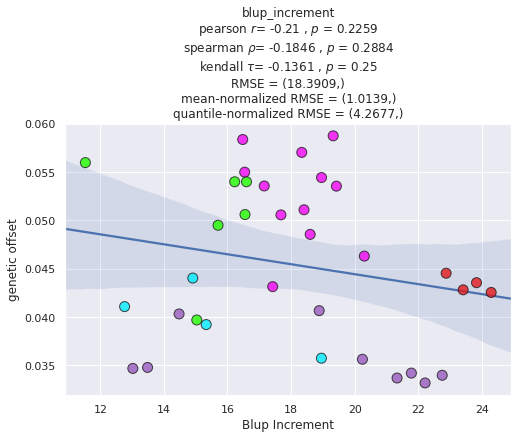

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


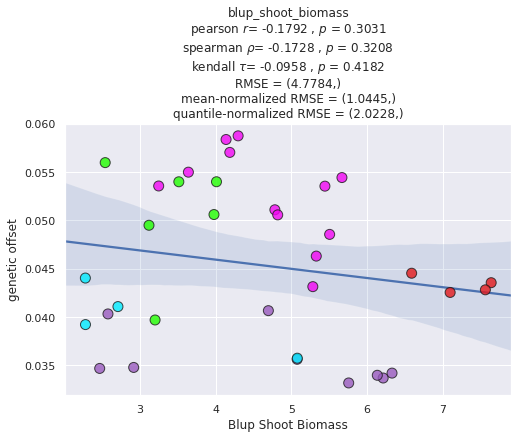

fdi vancouver baypass-random k1
fdi vancouver baypass-random k2
fdi vancouver baypass-random k3
fdi vancouver baypass-random k4
fdi vancouver baypass-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_baypass-real_full_regplot_blup_increment.pdf


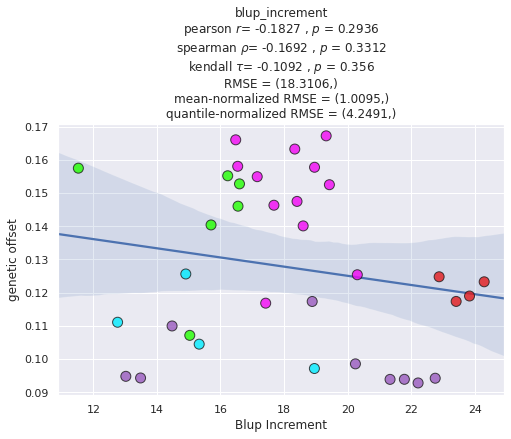

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


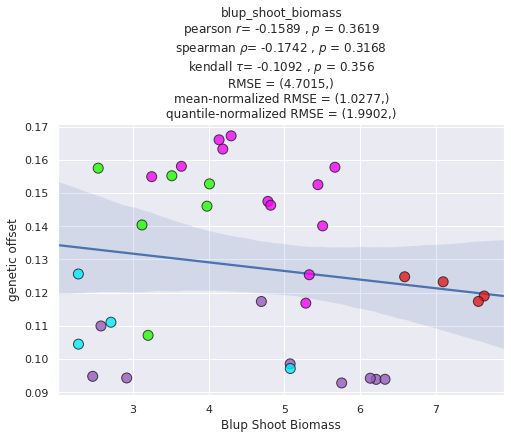

fdi vancouver baypass-real k1
fdi vancouver baypass-real k2
fdi vancouver baypass-real k3
fdi vancouver baypass-real k4
fdi vancouver wza-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_wza-random_full_regplot_blup_increment.pdf


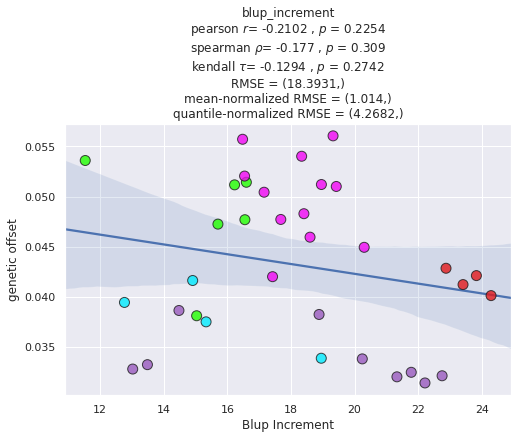

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


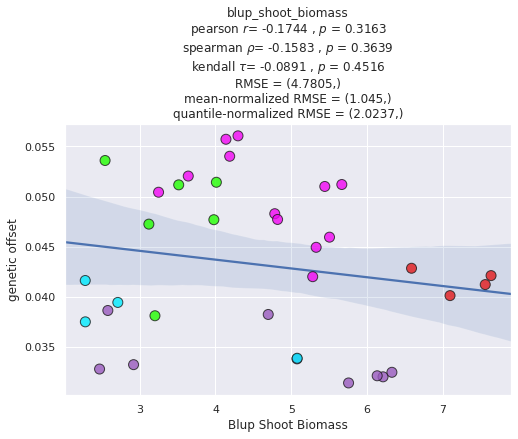

fdi vancouver wza-random k1
fdi vancouver wza-random k2
fdi vancouver wza-random k3
fdi vancouver wza-random k4
fdi vancouver wza-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_wza-real_full_regplot_blup_increment.pdf


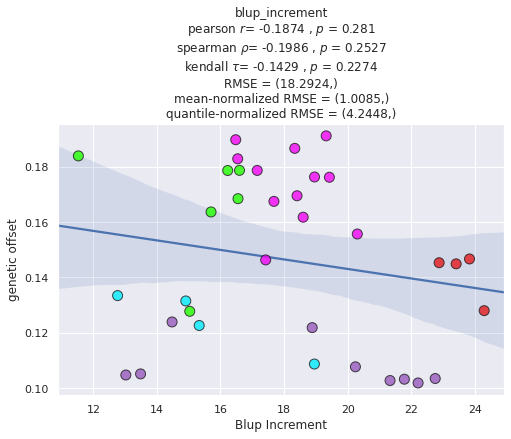

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


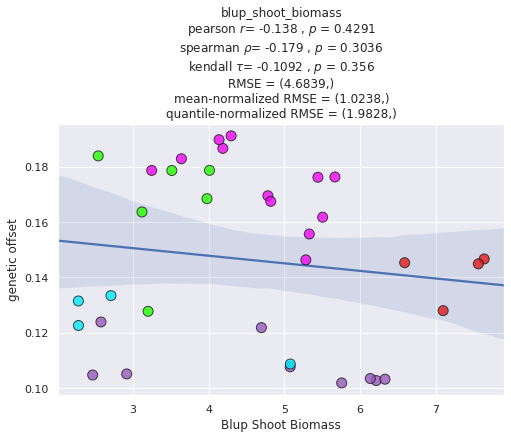

fdi vancouver wza-real k1
fdi vancouver wza-real k2
fdi vancouver wza-real k3
fdi vancouver wza-real k4
jp christine baypass-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-random_full_regplot_Mortality_2018.pdf


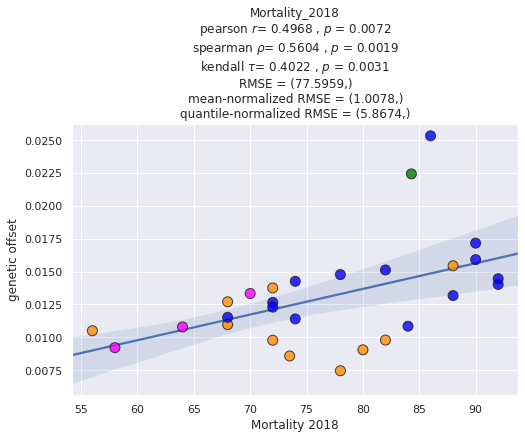

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-random_full_regplot_Mean_Height_2018.pdf


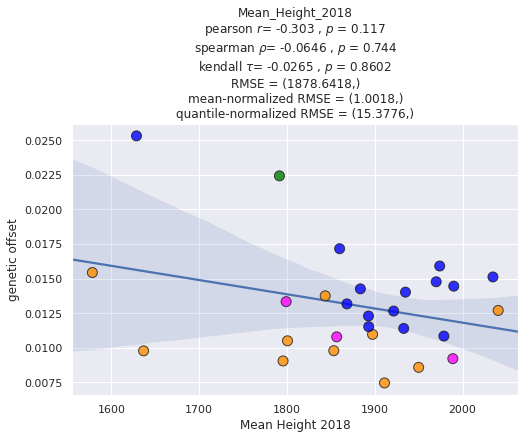

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-random_full_regplot_Mean_DBH2018.pdf


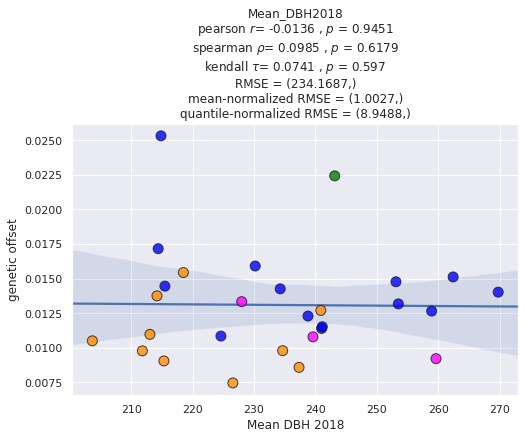

jp christine baypass-random k1
jp christine baypass-random k2
jp christine baypass-random k3
jp christine baypass-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-real_full_regplot_Mortality_2018.pdf


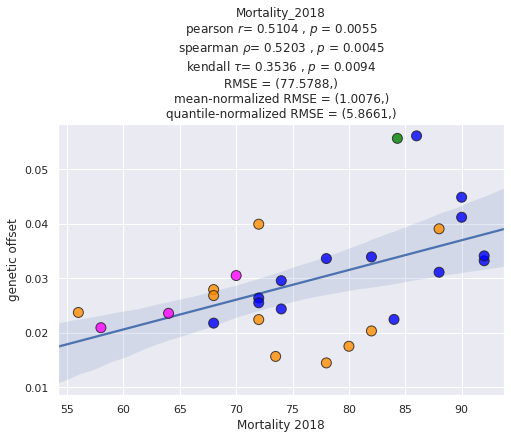

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-real_full_regplot_Mean_Height_2018.pdf


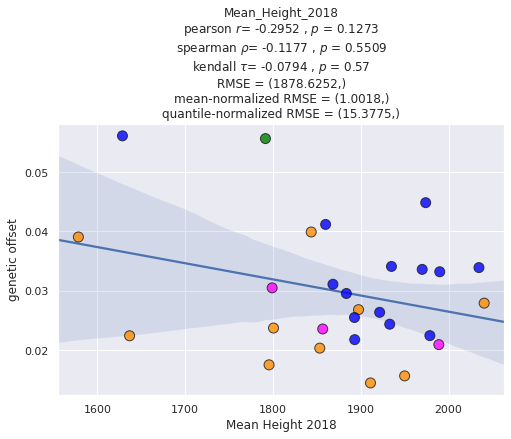

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_baypass-real_full_regplot_Mean_DBH2018.pdf


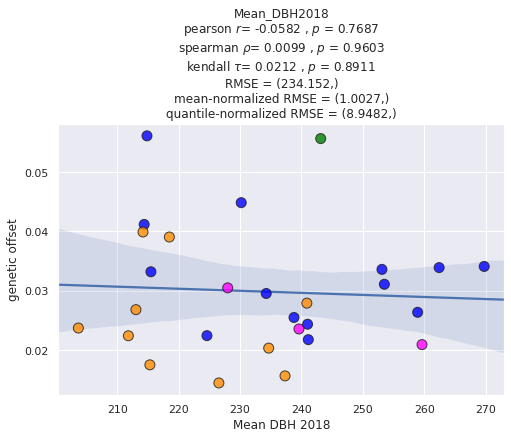

jp christine baypass-real k1
jp christine baypass-real k2
jp christine baypass-real k3
jp christine wza-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-random_full_regplot_Mortality_2018.pdf


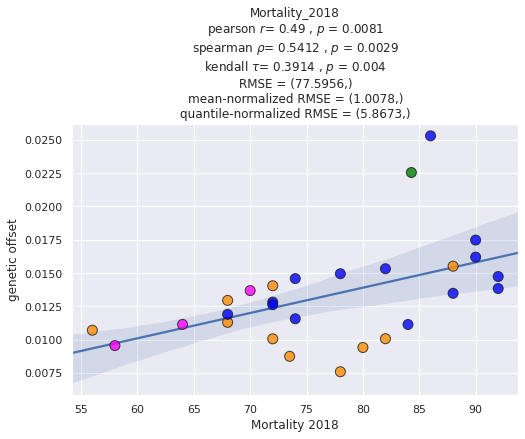

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-random_full_regplot_Mean_Height_2018.pdf


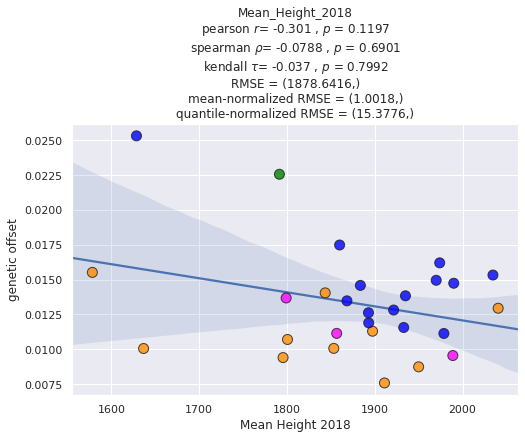

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-random_full_regplot_Mean_DBH2018.pdf


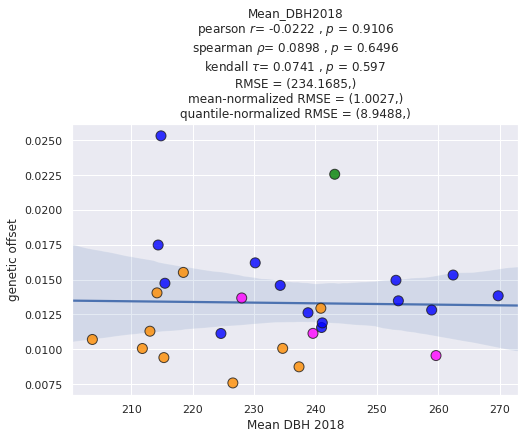

jp christine wza-random k1
jp christine wza-random k2
jp christine wza-random k3
jp christine wza-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-real_full_regplot_Mortality_2018.pdf


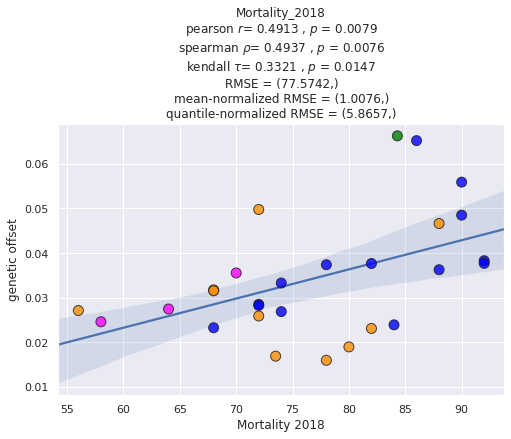

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-real_full_regplot_Mean_Height_2018.pdf


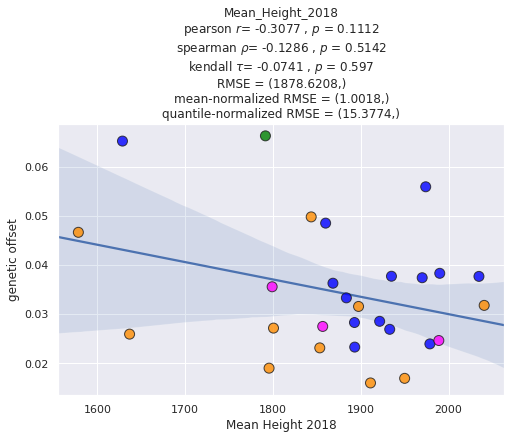

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_christine_wza-real_full_regplot_Mean_DBH2018.pdf


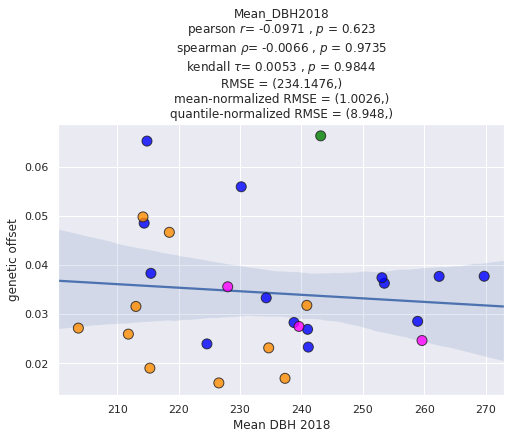

jp christine wza-real k1
jp christine wza-real k2
jp christine wza-real k3
jp fontbrune baypass-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-random_full_regplot_Mortality_2018.pdf


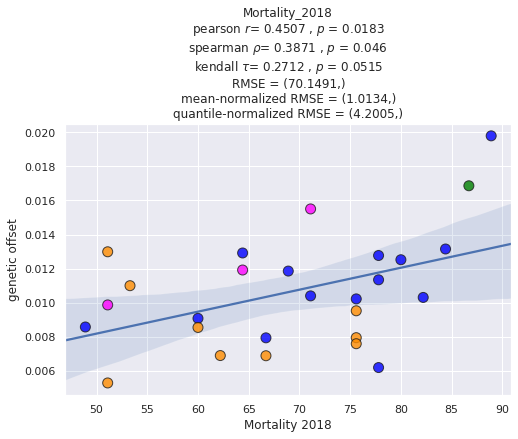

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-random_full_regplot_Mean_Height_2018.pdf


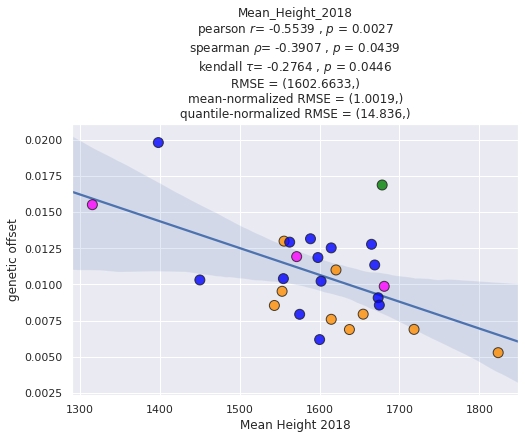

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-random_full_regplot_Mean_DBH2018.pdf


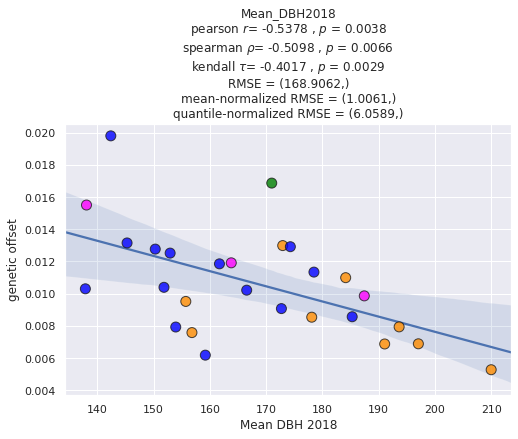

jp fontbrune baypass-random k1
jp fontbrune baypass-random k2
jp fontbrune baypass-random k3
jp fontbrune baypass-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-real_full_regplot_Mortality_2018.pdf


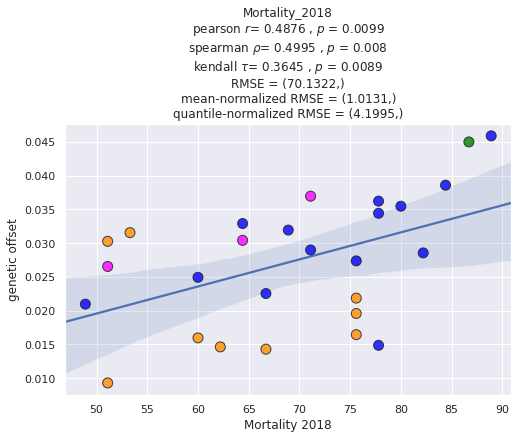

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-real_full_regplot_Mean_Height_2018.pdf


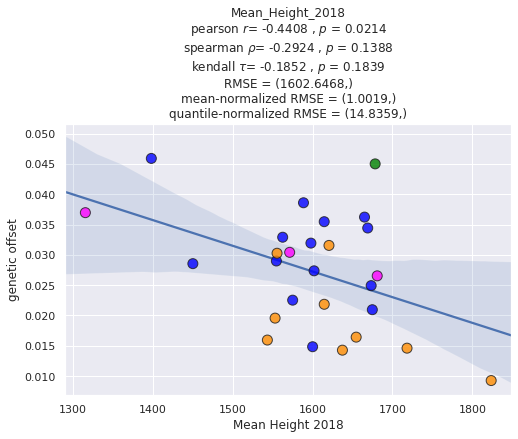

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_baypass-real_full_regplot_Mean_DBH2018.pdf


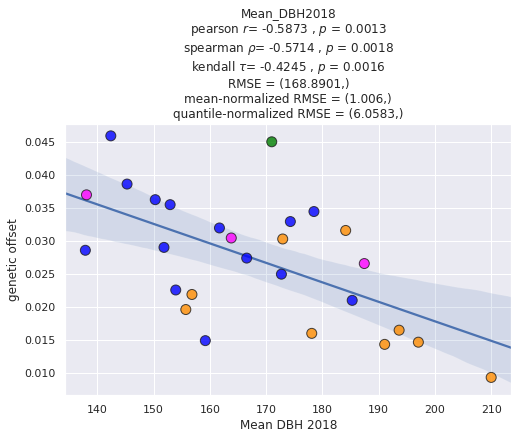

jp fontbrune baypass-real k1
jp fontbrune baypass-real k2
jp fontbrune baypass-real k3
jp fontbrune wza-random full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-random_full_regplot_Mortality_2018.pdf


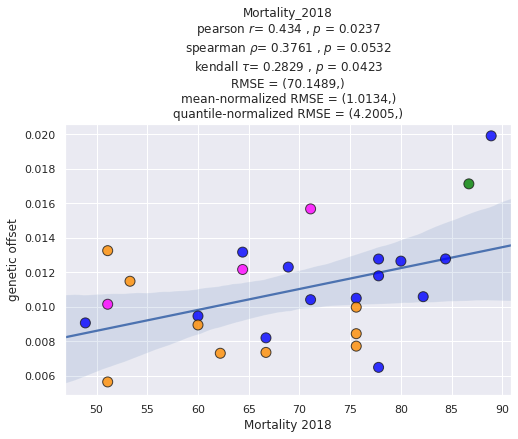

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-random_full_regplot_Mean_Height_2018.pdf


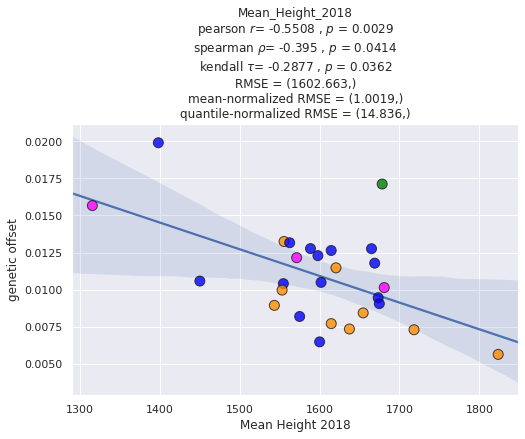

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-random_full_regplot_Mean_DBH2018.pdf


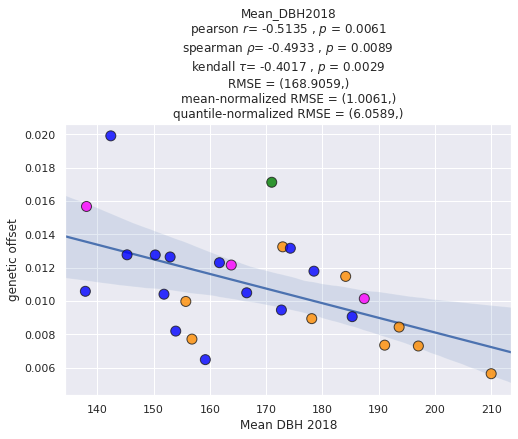

jp fontbrune wza-random k1
jp fontbrune wza-random k2
jp fontbrune wza-random k3
jp fontbrune wza-real full
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-real_full_regplot_Mortality_2018.pdf


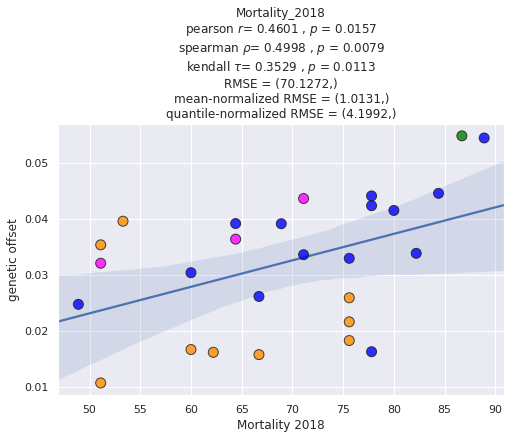

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-real_full_regplot_Mean_Height_2018.pdf


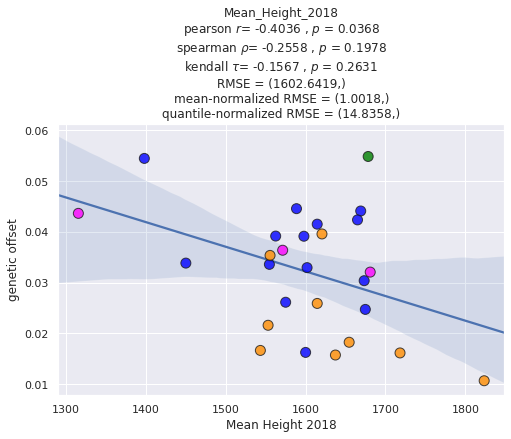

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/jp_fontbrune_wza-real_full_regplot_Mean_DBH2018.pdf


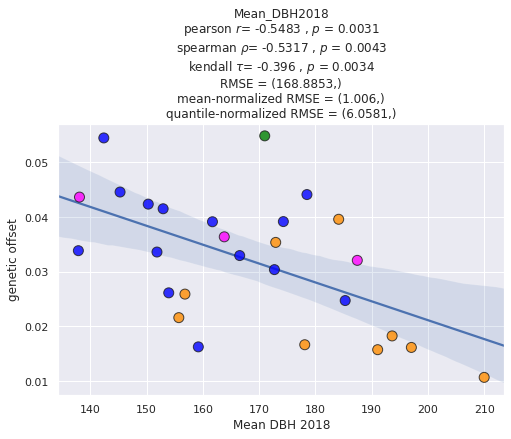

jp fontbrune wza-real k1
jp fontbrune wza-real k2
jp fontbrune wza-real k3
Function `get_statistics` completed after : 0-00:00:26


In [27]:
_ = get_statistics(plot_using='regplot', save=True)

### orthogonal distance regression

combined vancouver baypass-random full
Beta: [-0.00486492  0.18805681]
Beta Std Error: [0.00032723 0.00867828]
Beta Covariance: [[ 0.00021517 -0.00544185]
 [-0.00544185  0.15133044]]
Residual Variance: 0.0004976690431988434
Inverse Condition #: 0.13819494694998555
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00486x + 0.18806


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


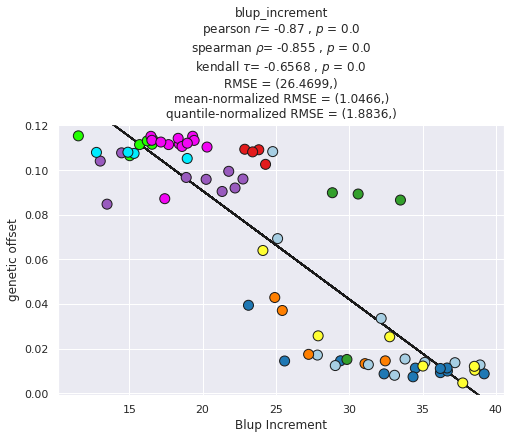

Beta: [-0.00824718  0.13835415]
Beta Std Error: [0.00056069 0.00563802]
Beta Covariance: [[ 0.00062161 -0.00552759]
 [-0.00552759  0.06285332]]
Residual Variance: 0.0005057371659188063
Inverse Condition #: 0.20933903947925703
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00825x + 0.13835


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


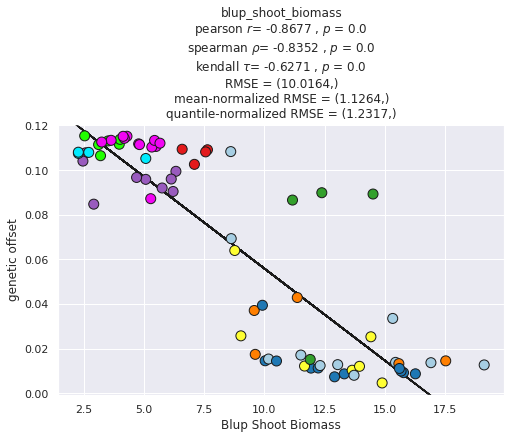

combined vancouver baypass-random k1
combined vancouver baypass-random k2
combined vancouver baypass-random k3
combined vancouver baypass-random k4
combined vancouver baypass-real full
Beta: [-0.00500496  0.20006895]
Beta Std Error: [0.00033745 0.00894919]
Beta Covariance: [[ 0.00021517 -0.00544186]
 [-0.00544186  0.15133066]]
Residual Variance: 0.0005292256827226884
Inverse Condition #: 0.13518257335815287
Reason(s) for Halting:
  Sum of squares convergence
y = -0.005x + 0.20007


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


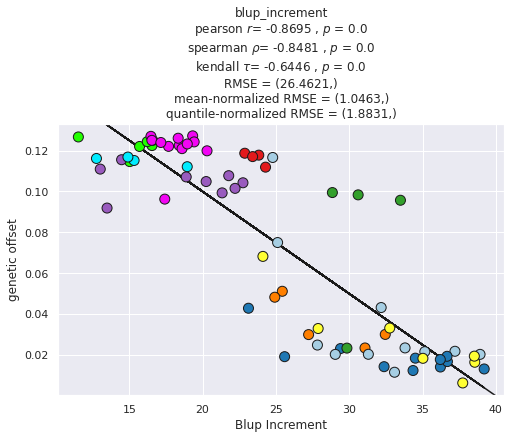

Beta: [-0.00845936  0.14871132]
Beta Std Error: [0.00058335 0.00586594]
Beta Covariance: [[ 0.00062161 -0.00552761]
 [-0.00552761  0.06285354]]
Residual Variance: 0.000547450671521298
Inverse Condition #: 0.20242318151934618
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00846x + 0.14871


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


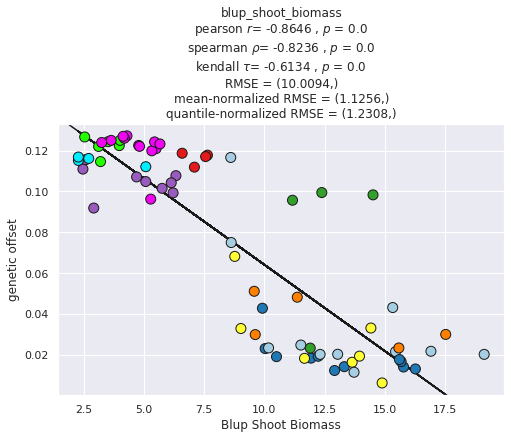

combined vancouver baypass-real k1
combined vancouver baypass-real k2
combined vancouver baypass-real k3
combined vancouver baypass-real k4
combined vancouver wza-random full
Beta: [-0.00497182  0.19186191]
Beta Std Error: [0.00033455 0.00887218]
Beta Covariance: [[ 0.00021517 -0.00544186]
 [-0.00544186  0.1513306 ]]
Residual Variance: 0.0005201560492873764
Inverse Condition #: 0.138348661647084
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00497x + 0.19186


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


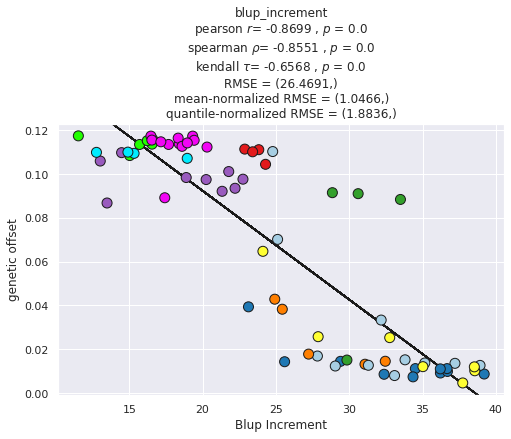

Beta: [-0.00843046  0.14108549]
Beta Std Error: [0.00057278 0.00575967]
Beta Covariance: [[ 0.00062161 -0.00552761]
 [-0.00552761  0.06285351]]
Residual Variance: 0.000527795613653364
Inverse Condition #: 0.20970152696136915
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00843x + 0.14109


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


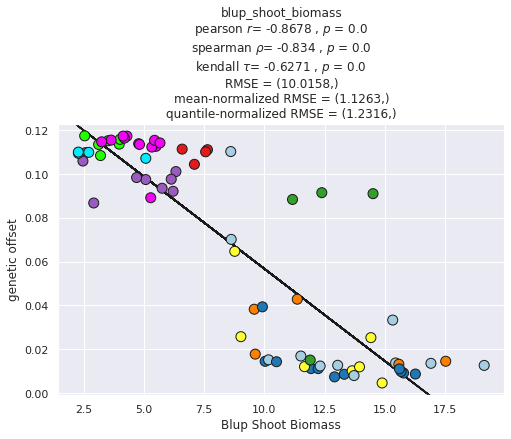

combined vancouver wza-random k1
combined vancouver wza-random k2
combined vancouver wza-random k3
combined vancouver wza-random k4
combined vancouver wza-real full
Beta: [-0.00436056  0.17970926]
Beta Std Error: [0.00028206 0.00748035]
Beta Covariance: [[ 0.00021517 -0.00544182]
 [-0.00544182  0.15132974]]
Residual Variance: 0.00036975945381590006
Inverse Condition #: 0.13246856335784302
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00436x + 0.17971


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


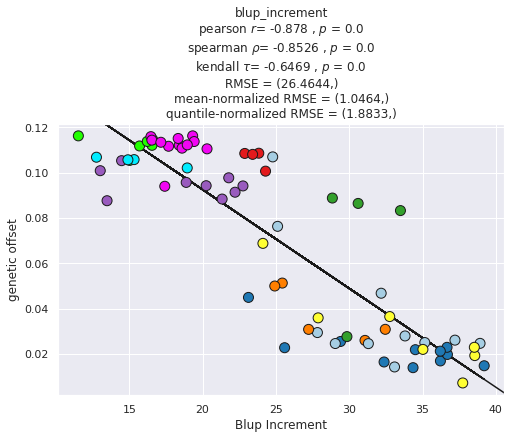

Beta: [-0.00734039  0.13469884]
Beta Std Error: [0.00049459 0.00497334]
Beta Covariance: [[ 0.0006216  -0.00552752]
 [-0.00552752  0.06285244]]
Residual Variance: 0.0003935262514136864
Inverse Condition #: 0.19619126894471398
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00734x + 0.1347


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


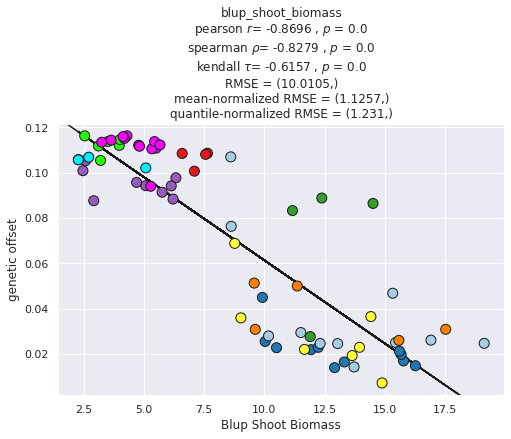

combined vancouver wza-real k1
combined vancouver wza-real k2
combined vancouver wza-real k3
combined vancouver wza-real k4
fdc vancouver baypass-random full
Beta: [-0.00056582  0.02836588]
Beta Std Error: [0.00012242 0.00394426]
Beta Covariance: [[ 1.20754797e-03 -3.84957403e-02]
 [-3.84957403e-02  1.25353166e+00]]
Residual Variance: 1.2410663557578694e-05
Inverse Condition #: 0.05996818918975734
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00057x + 0.02837


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


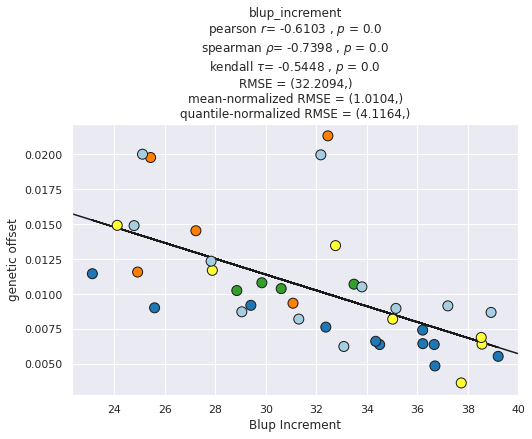

Beta: [-0.00051163  0.01691205]
Beta Std Error: [0.00025453 0.00334621]
Beta Covariance: [[ 0.00364366 -0.04689093]
 [-0.04689093  0.62976422]]
Residual Variance: 1.7779818377985462e-05
Inverse Condition #: 0.06173159812118438
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00051x + 0.01691


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


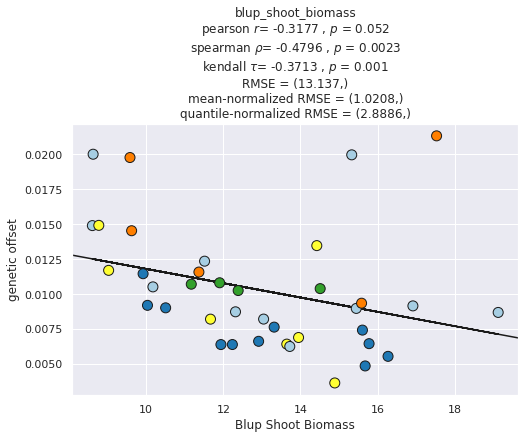

fdc vancouver baypass-random k1
fdc vancouver baypass-random k2
fdc vancouver baypass-random k3
fdc vancouver baypass-random k4
fdc vancouver baypass-real full
Beta: [-0.00109801  0.06112913]
Beta Std Error: [0.00037086 0.01194897]
Beta Covariance: [[ 1.20754897e-03 -3.84957734e-02]
 [-3.84957734e-02  1.25353278e+00]]
Residual Variance: 0.00011390039459895509
Inverse Condition #: 0.05600362050419035
Reason(s) for Halting:
  Sum of squares convergence
y = -0.0011x + 0.06113


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


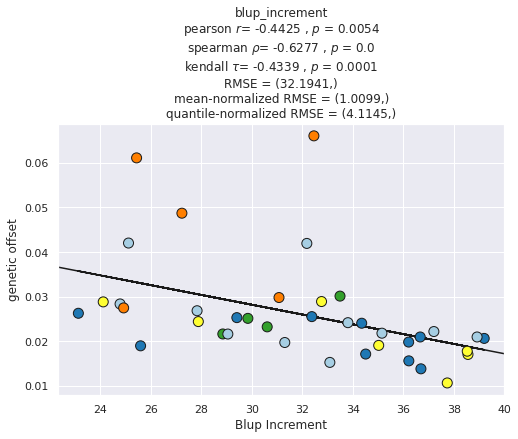

Beta: [-0.0007798   0.03616087]
Beta Std Error: [0.00070652 0.00928851]
Beta Covariance: [[ 0.00364366 -0.04689097]
 [-0.04689097  0.6297647 ]]
Residual Variance: 0.00013699794304889248
Inverse Condition #: 0.04732433932465958
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00078x + 0.03616


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


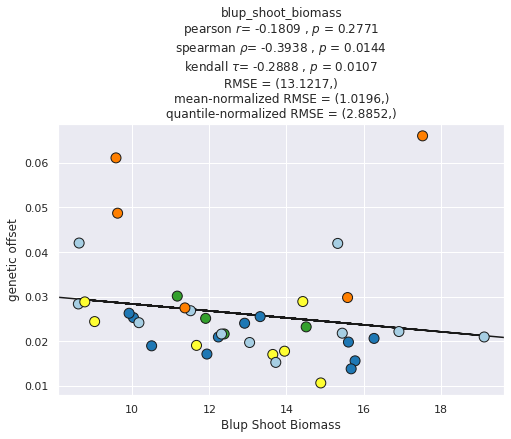

fdc vancouver baypass-real k1
fdc vancouver baypass-real k2
fdc vancouver baypass-real k3
fdc vancouver baypass-real k4
fdc vancouver wza-random full
Beta: [-0.00055617  0.02794268]
Beta Std Error: [0.00012265 0.0039516 ]
Beta Covariance: [[ 1.20754767e-03 -3.84957312e-02]
 [-3.84957312e-02  1.25353138e+00]]
Residual Variance: 1.24569385511911e-05
Inverse Condition #: 0.059884853980457585
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00056x + 0.02794


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


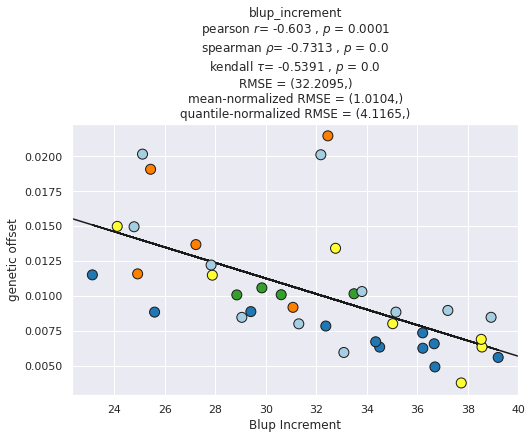

Beta: [-0.00049174  0.01654052]
Beta Std Error: [0.00025416 0.00334144]
Beta Covariance: [[ 0.00364366 -0.04689095]
 [-0.04689095  0.62976442]]
Residual Variance: 1.772916260285593e-05
Inverse Condition #: 0.060922659376424375
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00049x + 0.01654


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


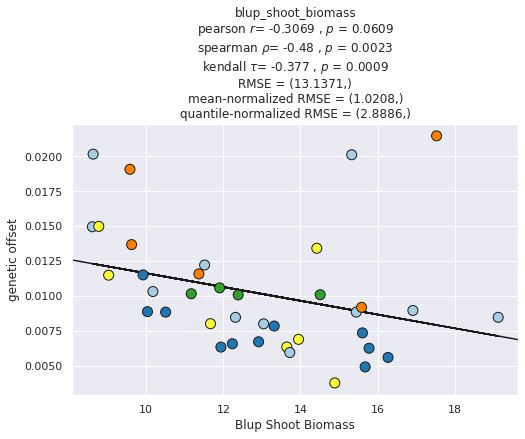

fdc vancouver wza-random k1
fdc vancouver wza-random k2
fdc vancouver wza-random k3
fdc vancouver wza-random k4
fdc vancouver wza-real full
Beta: [-0.00105385  0.06762871]
Beta Std Error: [0.00038797 0.01250004]
Beta Covariance: [[ 1.20754875e-03 -3.84957654e-02]
 [-3.84957654e-02  1.25353249e+00]]
Residual Variance: 0.00012464857431049845
Inverse Condition #: 0.050843189272894995
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00105x + 0.06763


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


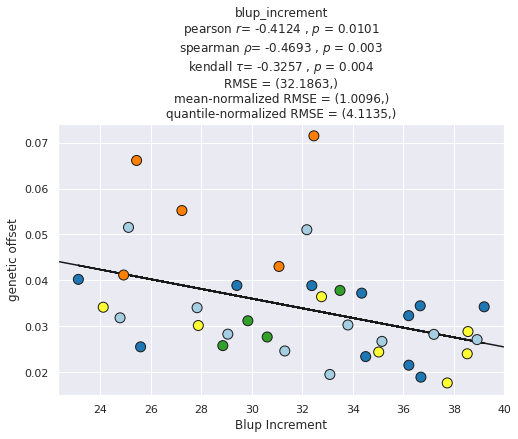

Beta: [-0.000754    0.04373615]
Beta Std Error: [0.00072902 0.00958429]
Beta Covariance: [[ 0.00364366 -0.04689092]
 [-0.04689092  0.62976408]]
Residual Variance: 0.00014586193582119555
Inverse Condition #: 0.03929895077314444
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00075x + 0.04374


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


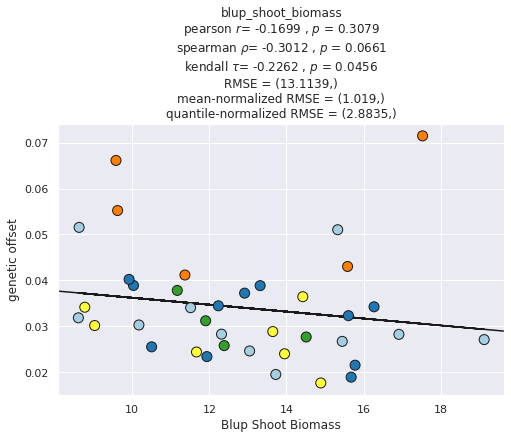

fdc vancouver wza-real k1
fdc vancouver wza-real k2
fdc vancouver wza-real k3
fdc vancouver wza-real k4
fdi vancouver baypass-random full
Beta: [-0.00051563  0.05475316]
Beta Std Error: [0.00041779 0.00770214]
Beta Covariance: [[ 0.00263376 -0.0477728 ]
 [-0.0477728   0.89510628]]
Residual Variance: 6.627470076282079e-05
Inverse Condition #: 0.027174761846474188
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00052x + 0.05475


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


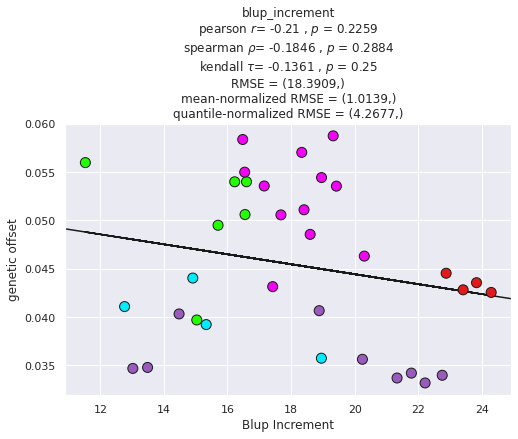

Beta: [-0.00095239  0.04975735]
Beta Std Error: [0.00091036 0.0043889 ]
Beta Covariance: [[ 0.01234965 -0.05649729]
 [-0.05649729  0.28703581]]
Residual Variance: 6.710810092350319e-05
Inverse Condition #: 0.027465850944509488
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00095x + 0.04976


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


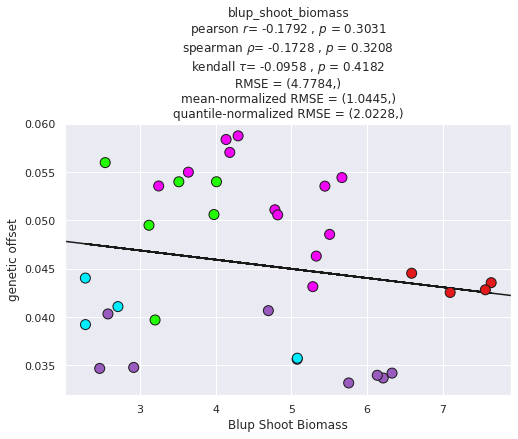

fdi vancouver baypass-random k1
fdi vancouver baypass-random k2
fdi vancouver baypass-random k3
fdi vancouver baypass-random k4
fdi vancouver baypass-real full
Beta: [-0.0013822   0.15267684]
Beta Std Error: [0.00129496 0.02387303]
Beta Covariance: [[ 0.00263376 -0.04777286]
 [-0.04777286  0.89510733]]
Residual Variance: 0.0006367075551817402
Inverse Condition #: 0.02624984350029593
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00138x + 0.15268


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


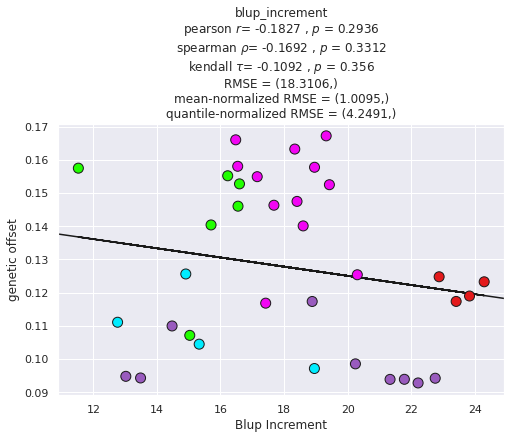

Beta: [-0.0026043  0.1395197]
Beta Std Error: [0.00281587 0.01357542]
Beta Covariance: [[ 0.0123497  -0.05649751]
 [-0.05649751  0.28703701]]
Residual Variance: 0.0006420500017030157
Inverse Condition #: 0.02681788995037123
Reason(s) for Halting:
  Sum of squares convergence
y = -0.0026x + 0.13952


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


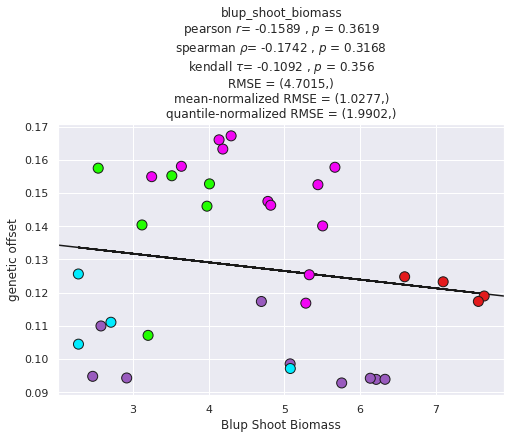

fdi vancouver baypass-real k1
fdi vancouver baypass-real k2
fdi vancouver baypass-real k3
fdi vancouver baypass-real k4
fdi vancouver wza-random full
Beta: [-0.00048864  0.05206278]
Beta Std Error: [0.00039555 0.00729214]
Beta Covariance: [[ 0.00263375 -0.04777276]
 [-0.04777276  0.89510551]]
Residual Variance: 5.940672967001764e-05
Inverse Condition #: 0.027094595049072714
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00049x + 0.05206


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


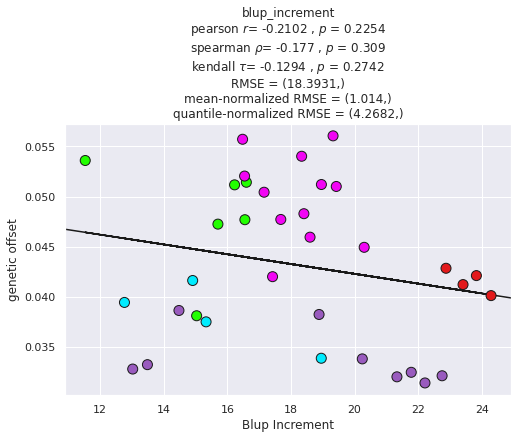

Beta: [-0.00087777  0.04721514]
Beta Std Error: [0.00086269 0.00415906]
Beta Covariance: [[ 0.01234964 -0.05649727]
 [-0.05649727  0.28703569]]
Residual Variance: 6.026338069896704e-05
Inverse Condition #: 0.026721255383122675
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00088x + 0.04722


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


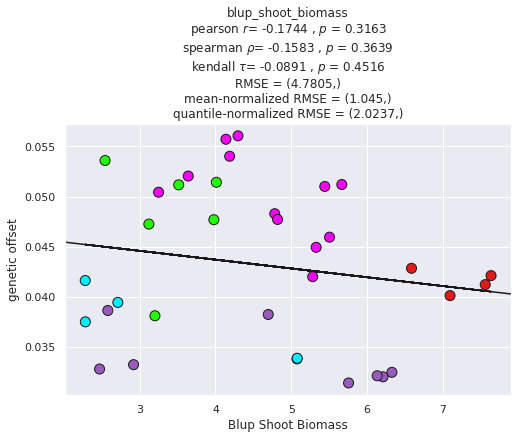

fdi vancouver wza-random k1
fdi vancouver wza-random k2
fdi vancouver wza-random k3
fdi vancouver wza-random k4
fdi vancouver wza-real full
Beta: [-0.00171996  0.17748971]
Beta Std Error: [0.00156922 0.02892904]
Beta Covariance: [[ 0.00263376 -0.04777291]
 [-0.04777291  0.89510824]]
Residual Variance: 0.0009349590818824844
Inverse Condition #: 0.027860462494023696
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00172x + 0.17749


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


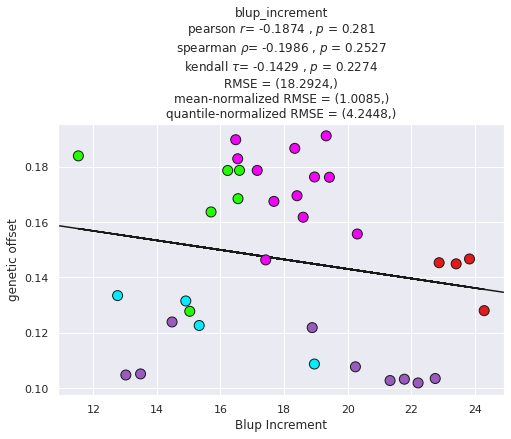

Beta: [-0.00274372  0.15884387]
Beta Std Error: [0.00342619 0.01651778]
Beta Covariance: [[ 0.01234972 -0.0564976 ]
 [-0.0564976   0.28703734]]
Residual Variance: 0.0009505283309474726
Inverse Condition #: 0.024918610823465755
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00274x + 0.15884


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


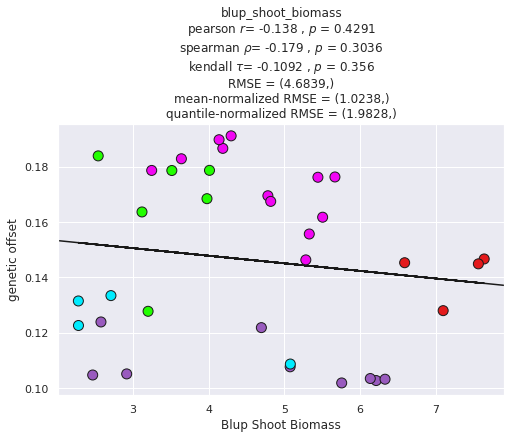

fdi vancouver wza-real k1
fdi vancouver wza-real k2
fdi vancouver wza-real k3
fdi vancouver wza-real k4
jp christine baypass-random full
Beta: [ 0.00019514 -0.00193295]
Beta Std Error: [6.68491700e-05 5.18810254e-03]
Beta Covariance: [[ 3.74877366e-04 -2.88628792e-02]
 [-2.88628792e-02  2.25794980e+00]]
Residual Variance: 1.1920729109046703e-05
Inverse Condition #: 0.0016026114391471946
Reason(s) for Halting:
  Sum of squares convergence
y = 0.0002x + -0.00193


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


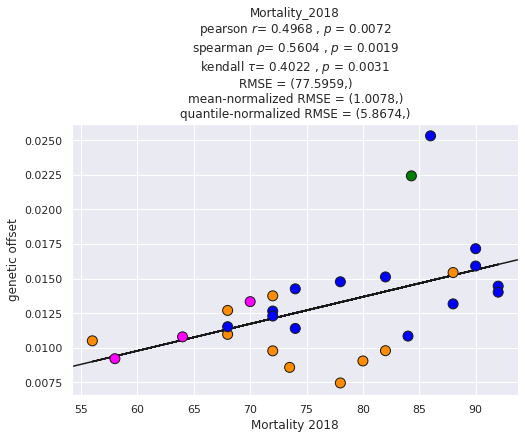

Beta: [-1.02711551e-05  3.23523502e-02]
Beta Std Error: [6.33474718e-06 1.19008032e-02]
Beta Covariance: [[ 2.79174473e-06 -5.23521071e-03]
 [-5.23521071e-03  9.85302707e+00]]
Residual Variance: 1.4374173051551845e-05
Inverse Condition #: 0.023003161735825853
Reason(s) for Halting:
  Sum of squares convergence
y = -1e-05x + 0.03235


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


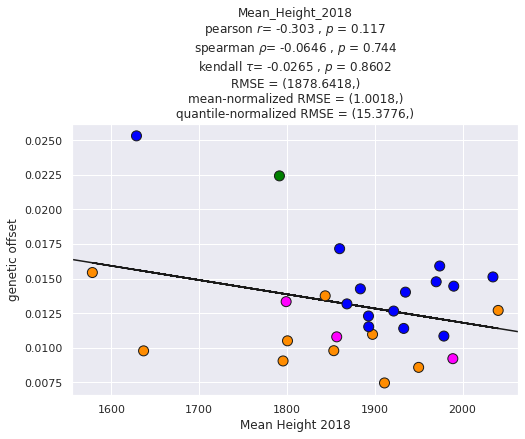

Beta: [-2.99751257e-06  1.37914117e-02]
Beta Std Error: [4.31099186e-05 1.00955584e-02]
Beta Covariance: [[ 1.17441193e-04 -2.74262309e-02]
 [-2.74262309e-02  6.44060617e+00]]
Residual Variance: 1.5824644091128512e-05
Inverse Condition #: 0.003619986722329264
Reason(s) for Halting:
  Sum of squares convergence
y = -0.0x + 0.01379


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


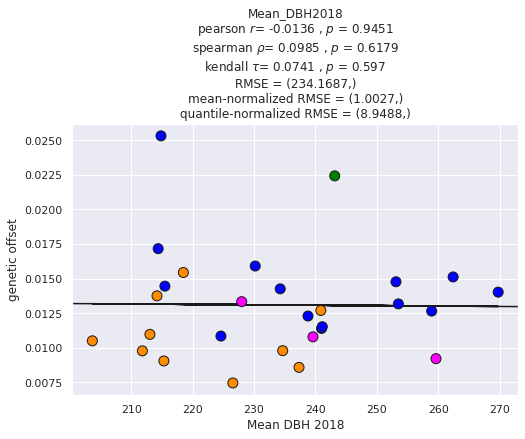

jp christine baypass-random k1
jp christine baypass-random k2
jp christine baypass-random k3
jp christine baypass-real full
Beta: [ 0.00054465 -0.01205551]
Beta Std Error: [0.00017996 0.01396663]
Beta Covariance: [[ 3.74877266e-04 -2.88628797e-02]
 [-2.88628797e-02  2.25795050e+00]]
Residual Variance: 8.639105774391437e-05
Inverse Condition #: 0.028717782840378746
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00054x + -0.01206


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


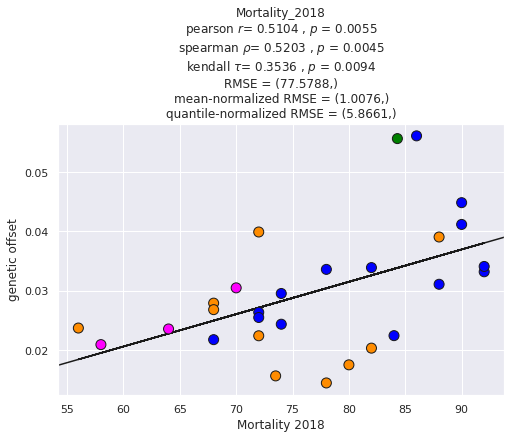

Beta: [-2.71804304e-05  8.08484875e-02]
Beta Std Error: [1.72549435e-05 3.24160831e-02]
Beta Covariance: [[ 2.79174449e-06 -5.23521039e-03]
 [-5.23521039e-03  9.85302671e+00]]
Residual Variance: 0.0001066476802581169
Inverse Condition #: 0.023852800081264558
Reason(s) for Halting:
  Sum of squares convergence
y = -3e-05x + 0.08085


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


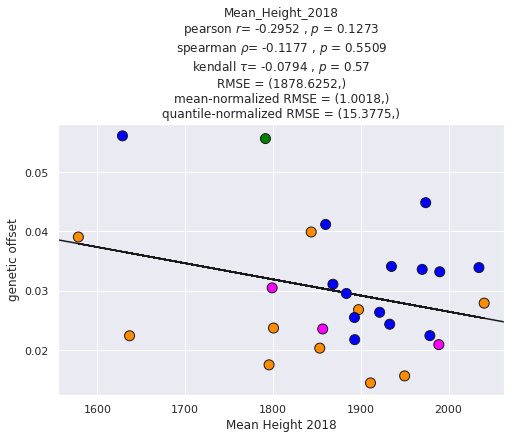

Beta: [-3.47472946e-05  3.79930595e-02]
Beta Std Error: [0.00011694 0.02738408]
Beta Covariance: [[ 1.17442111e-04 -2.74264454e-02]
 [-2.74264454e-02  6.44065628e+00]]
Residual Variance: 0.00011643034446485426
Inverse Condition #: 0.013312225651605907
Reason(s) for Halting:
  Sum of squares convergence
y = -3e-05x + 0.03799


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


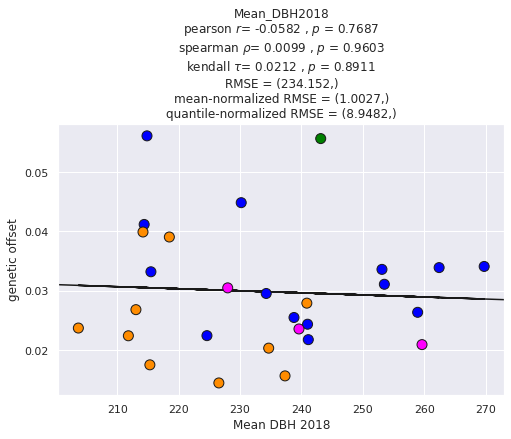

jp christine baypass-real k1
jp christine baypass-real k2
jp christine baypass-real k3
jp christine wza-random full
Beta: [ 0.00019016 -0.00131291]
Beta Std Error: [6.63456089e-05 5.14902058e-03]
Beta Covariance: [[ 3.74879008e-04 -2.88630007e-02]
 [-2.88630007e-02  2.25795877e+00]]
Residual Variance: 1.1741761282621748e-05
Inverse Condition #: 0.0016026082679789378
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00019x + -0.00131


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


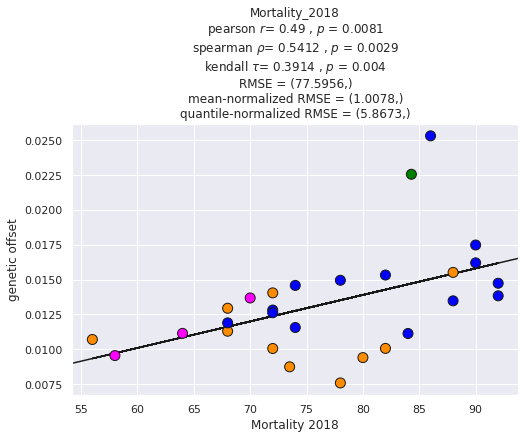

Beta: [-1.00790466e-05  3.22289492e-02]
Beta Std Error: [6.26342463e-06 1.17668130e-02]
Beta Covariance: [[ 2.79174451e-06 -5.23521041e-03]
 [-5.23521041e-03  9.85302670e+00]]
Residual Variance: 1.4052320306344694e-05
Inverse Condition #: 0.022781934778794692
Reason(s) for Halting:
  Sum of squares convergence
y = -1e-05x + 0.03223


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


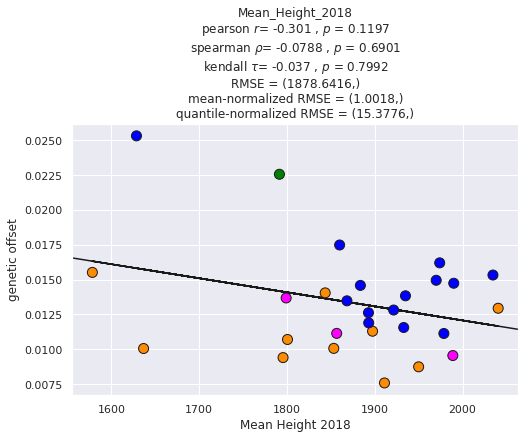

Beta: [-4.82822091e-06  1.44557899e-02]
Beta Std Error: [4.25889228e-05 9.97354939e-03]
Beta Covariance: [[ 1.17442906e-04 -2.74266284e-02]
 [-2.74266284e-02  6.44069838e+00]]
Residual Variance: 1.5444239370934796e-05
Inverse Condition #: 0.00543209181222065
Reason(s) for Halting:
  Sum of squares convergence
y = -0.0x + 0.01446


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


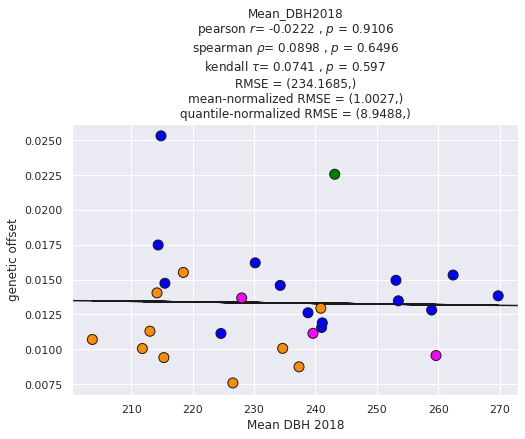

jp christine wza-random k1
jp christine wza-random k2
jp christine wza-random k3
jp christine wza-real full
Beta: [ 0.00065376 -0.01596698]
Beta Std Error: [0.00022728 0.01763932]
Beta Covariance: [[ 3.74877821e-04 -2.88629138e-02]
 [-2.88629138e-02  2.25795243e+00]]
Residual Variance: 0.00013779986466699886
Inverse Condition #: 0.031043274884858876
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00065x + -0.01597


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


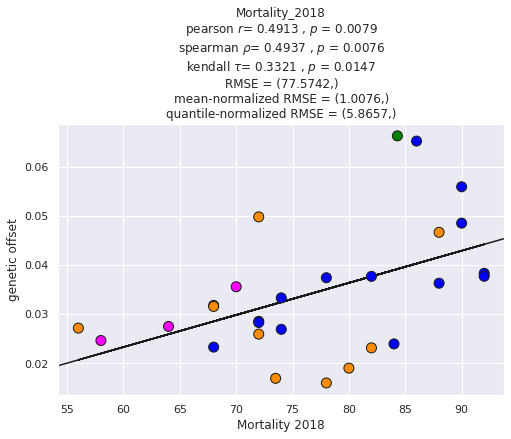

Beta: [-3.53296215e-05  1.00619426e-01]
Beta Std Error: [2.14269223e-05 4.02537912e-02]
Beta Covariance: [[ 2.79174337e-06 -5.23520826e-03]
 [-5.23520826e-03  9.85302267e+00]]
Residual Variance: 0.00016445386998155056
Inverse Condition #: 0.02450581277688266
Reason(s) for Halting:
  Sum of squares convergence
y = -4e-05x + 0.10062


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


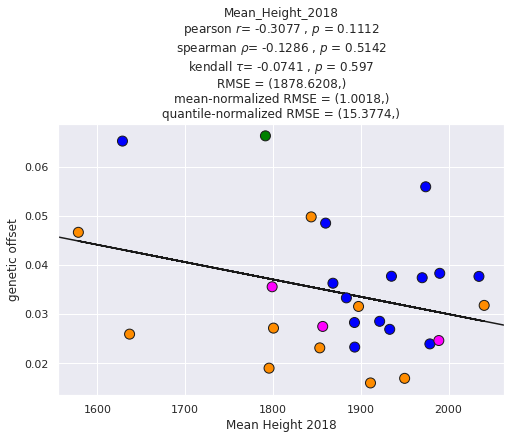

Beta: [-7.23139587e-05  5.12552553e-02]
Beta Std Error: [0.00014537 0.03404281]
Beta Covariance: [[ 1.17441953e-04 -2.74264091e-02]
 [-2.74264091e-02  6.44064795e+00]]
Residual Variance: 0.0001799373384259881
Inverse Condition #: 0.01884202999000583
Reason(s) for Halting:
  Sum of squares convergence
y = -7e-05x + 0.05126


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


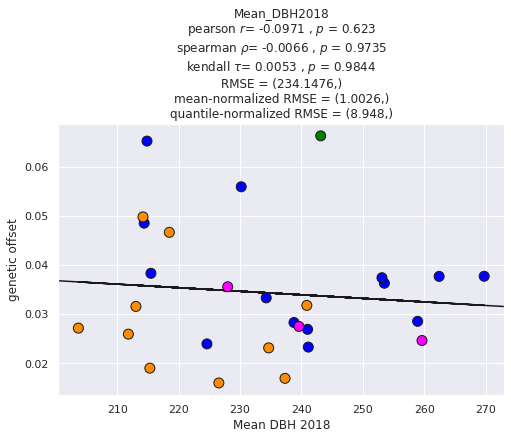

jp christine wza-real k1
jp christine wza-real k2
jp christine wza-real k3
jp fontbrune baypass-random full
Beta: [0.00012901 0.00172728]
Beta Std Error: [5.11054279e-05 3.58554835e-03]
Beta Covariance: [[ 2.83397233e-04 -1.96173799e-02]
 [-1.96173799e-02  1.39499520e+00]]
Residual Variance: 9.21591484485116e-06
Inverse Condition #: 0.026834753278780748
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00013x + 0.00173


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


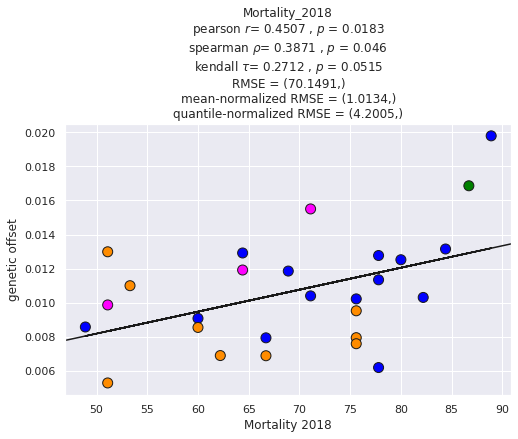

Beta: [-1.85206669e-05  4.02845001e-02]
Beta Std Error: [5.56758930e-06 8.92302961e-03]
Beta Covariance: [[ 3.86675550e-06 -6.18558226e-03]
 [-6.18558226e-03  9.93200657e+00]]
Residual Variance: 8.01655304638136e-06
Inverse Condition #: 0.02658129630348952
Reason(s) for Halting:
  Sum of squares convergence
y = -2e-05x + 0.04028


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


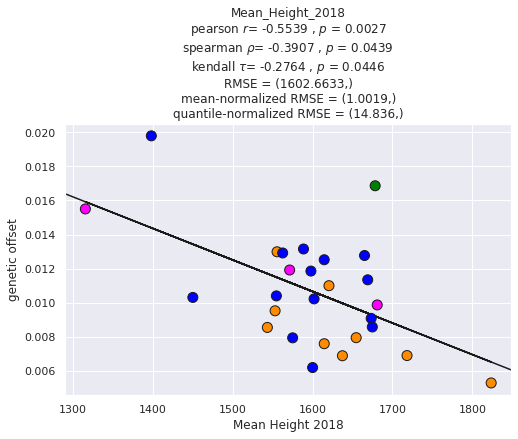

Beta: [-9.41701972e-05  2.64665834e-02]
Beta Std Error: [2.95283911e-05 4.98783559e-03]
Beta Covariance: [[ 1.06066352e-04 -1.78063995e-02]
 [-1.78063995e-02  3.02637208e+00]]
Residual Variance: 8.22057012602812e-06
Inverse Condition #: 0.04328224264515616
Reason(s) for Halting:
  Sum of squares convergence
y = -9e-05x + 0.02647


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


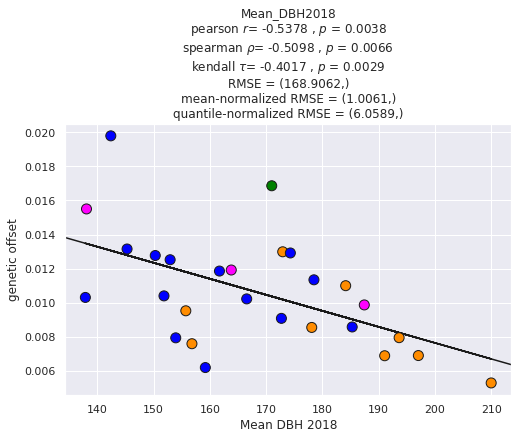

jp fontbrune baypass-random k1
jp fontbrune baypass-random k2
jp fontbrune baypass-random k3
jp fontbrune baypass-real full
Beta: [ 0.00040115 -0.00049679]
Beta Std Error: [0.00014365 0.01007849]
Beta Covariance: [[ 2.83402354e-04 -1.96176866e-02]
 [-1.96176866e-02  1.39501293e+00]]
Residual Variance: 7.281360255639762e-05
Inverse Condition #: 0.0022954440765158676
Reason(s) for Halting:
  Sum of squares convergence
y = 0.0004x + -0.0005


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


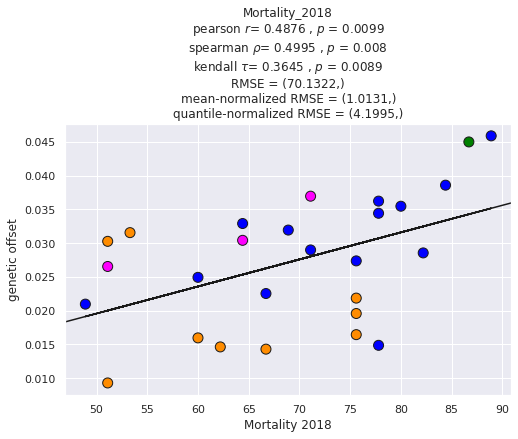

Beta: [-4.23547234e-05  9.50257179e-02]
Beta Std Error: [1.72517062e-05 2.76488580e-02]
Beta Covariance: [[ 3.86675661e-06 -6.18558408e-03]
 [-6.18558408e-03  9.93200955e+00]]
Residual Variance: 7.696925232292766e-05
Inverse Condition #: 0.026096683723638582
Reason(s) for Halting:
  Sum of squares convergence
y = -4e-05x + 0.09503


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


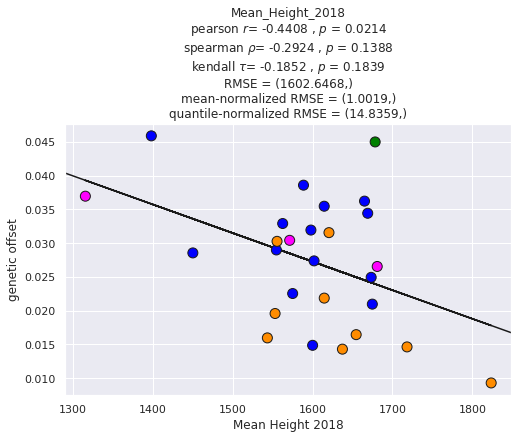

Beta: [-0.00029556  0.07689068]
Beta Std Error: [8.14730873e-05 1.37621574e-02]
Beta Covariance: [[ 1.06066403e-04 -1.78064082e-02]
 [-1.78064082e-02  3.02637356e+00]]
Residual Variance: 6.258215409347107e-05
Inverse Condition #: 0.04547642617501953
Reason(s) for Halting:
  Sum of squares convergence
y = -0.0003x + 0.07689


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


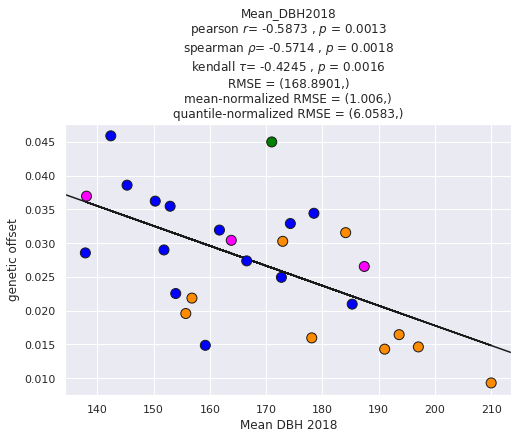

jp fontbrune baypass-real k1
jp fontbrune baypass-real k2
jp fontbrune baypass-real k3
jp fontbrune wza-random full
Beta: [0.00012122 0.00253586]
Beta Std Error: [5.03221274e-05 3.53059345e-03]
Beta Covariance: [[ 2.83396189e-04 -1.96173141e-02]
 [-1.96173141e-02  1.39499112e+00]]
Residual Variance: 8.93560537406373e-06
Inverse Condition #: 0.03889409936739419
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00012x + 0.00254


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


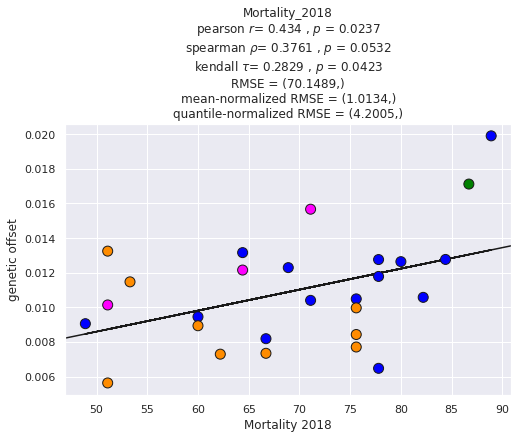

Beta: [-1.79691645e-05  3.96721652e-02]
Beta Std Error: [5.44576380e-06 8.72778289e-03]
Beta Covariance: [[ 3.86675560e-06 -6.18558228e-03]
 [-6.18558228e-03  9.93200637e+00]]
Residual Variance: 7.669567581425126e-06
Inverse Condition #: 0.026347728356765538
Reason(s) for Halting:
  Sum of squares convergence
y = -2e-05x + 0.03967


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


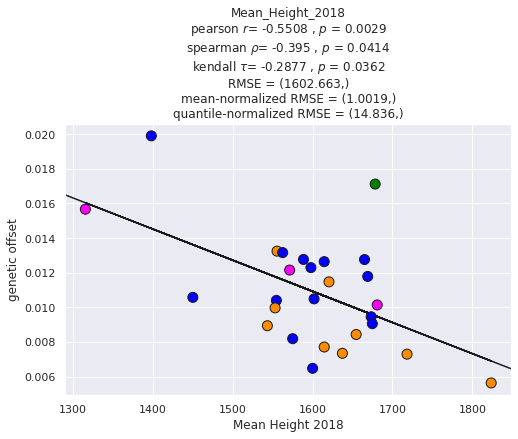

Beta: [-8.77437268e-05  2.56576028e-02]
Beta Std Error: [2.93224225e-05 4.95304404e-03]
Beta Covariance: [[ 1.06066332e-04 -1.78063961e-02]
 [-1.78063961e-02  3.02637149e+00]]
Residual Variance: 8.106290120451493e-06
Inverse Condition #: 0.042175512379318686
Reason(s) for Halting:
  Sum of squares convergence
y = -9e-05x + 0.02566


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


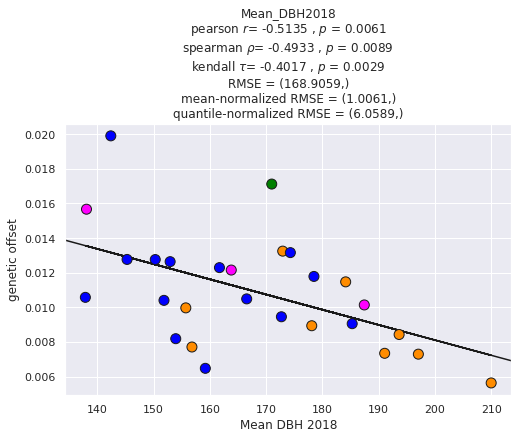

jp fontbrune wza-random k1
jp fontbrune wza-random k2
jp fontbrune wza-random k3
jp fontbrune wza-real full
Beta: [ 0.00047345 -0.00053979]
Beta Std Error: [0.00018271 0.01281915]
Beta Covariance: [[ 2.83396415e-04 -1.96172629e-02]
 [-1.96172629e-02  1.39498271e+00]]
Residual Variance: 0.0001178010959556675
Inverse Condition #: 0.0022954690268539553
Reason(s) for Halting:
  Sum of squares convergence
y = 0.00047x + -0.00054


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


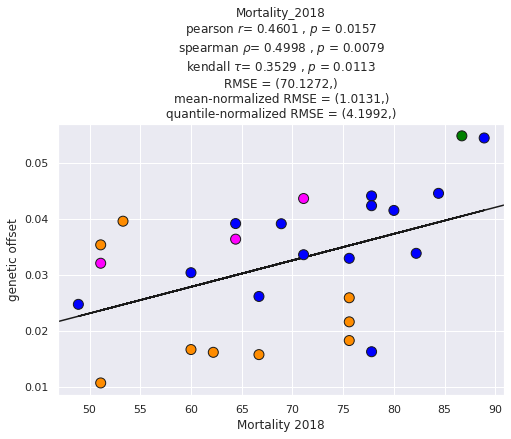

Beta: [-4.85064524e-05  1.09828531e-01]
Beta Std Error: [2.19938975e-05 3.52490429e-02]
Beta Covariance: [[ 3.86675543e-06 -6.18558199e-03]
 [-6.18558199e-03  9.93200591e+00]]
Residual Variance: 0.0001251001091946574
Inverse Condition #: 0.02595404738658314
Reason(s) for Halting:
  Sum of squares convergence
y = -5e-05x + 0.10983


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


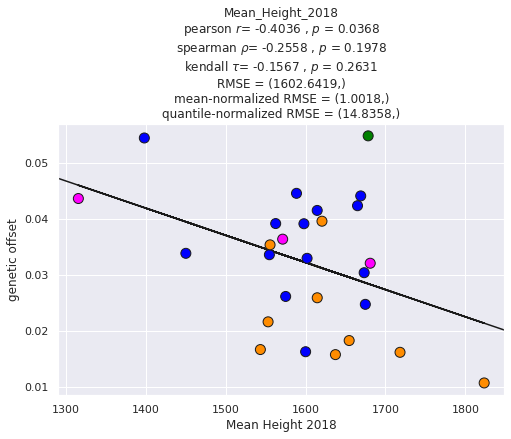

Beta: [-0.00034513  0.09017365]
Beta Std Error: [0.00010529 0.01778523]
Beta Covariance: [[ 1.06066362e-04 -1.78064012e-02]
 [-1.78064012e-02  3.02637239e+00]]
Residual Variance: 0.0001045193071092543
Inverse Condition #: 0.045352581802109104
Reason(s) for Halting:
  Sum of squares convergence
y = -0.00035x + 0.09017


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


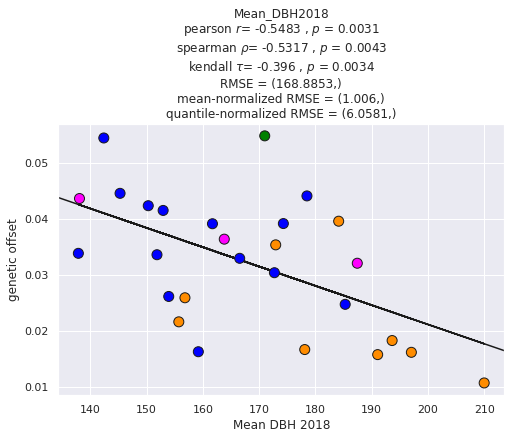

jp fontbrune wza-real k1
jp fontbrune wza-real k2
jp fontbrune wza-real k3
Function `get_statistics` completed after : 0-00:00:13


In [28]:
_ = get_statistics(plot_using='odr')

combined vancouver baypass-random full
Beta: [-205.55319491   38.65568196]
Beta Std Error: [13.82632009  1.0469722 ]
Beta Covariance: [[384125.01227799 -24974.52213178]
 [-24974.52213178   2202.56978348]]
Residual Variance: 0.0004976690431989211
Inverse Condition #: 0.03772648330794193
Reason(s) for Halting:
  Sum of squares convergence
y = -205.55319x + 38.65568


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


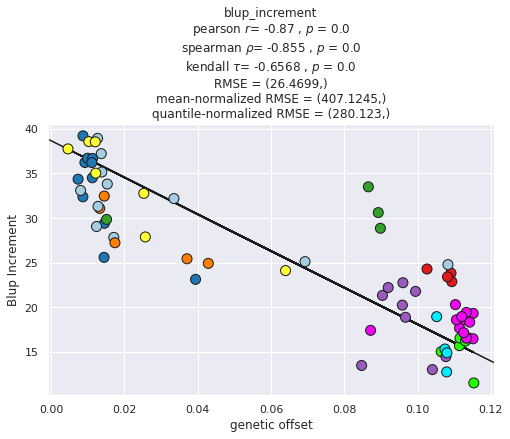

Beta: [-121.25355267   16.77593202]
Beta Std Error: [8.24345105 0.62379372]
Beta Covariance: [[134367.19662064  -8736.10280857]
 [ -8736.10280857    769.40875007]]
Residual Variance: 0.000505737165918802
Inverse Condition #: 0.03762522221383568
Reason(s) for Halting:
  Sum of squares convergence
y = -121.25355x + 16.77593


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


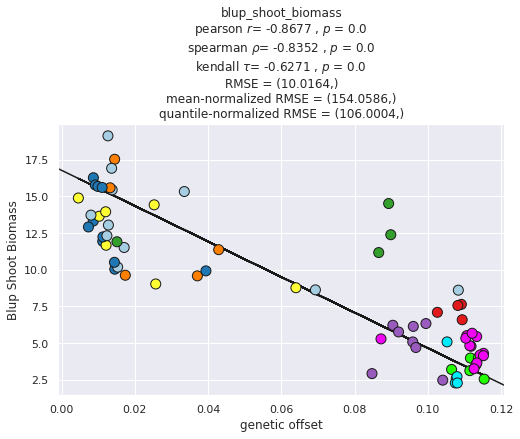

combined vancouver baypass-random k1
combined vancouver baypass-random k2
combined vancouver baypass-random k3
combined vancouver baypass-random k4
combined vancouver baypass-real full
Beta: [-199.80193465   39.97416265]
Beta Std Error: [13.47124853  1.12669681]
Beta Covariance: [[342905.76386998 -25199.13861829]
 [-25199.13861829   2398.68497453]]
Residual Variance: 0.0005292256827226907
Inverse Condition #: 0.03853203870499368
Reason(s) for Halting:
  Sum of squares convergence
y = -199.80193x + 39.97416


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


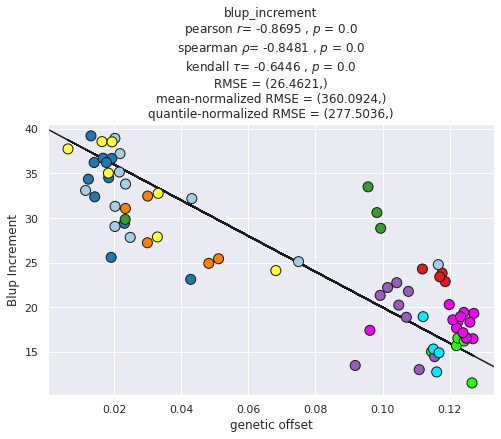

Beta: [-118.21232316   17.57950982]
Beta Std Error: [8.15183723 0.68093278]
Beta Covariance: [[121385.2747226   -8920.23499199]
 [ -8920.23499199    846.96115655]]
Residual Variance: 0.0005474506715212765
Inverse Condition #: 0.03831062692963547
Reason(s) for Halting:
  Sum of squares convergence
y = -118.21232x + 17.57951


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


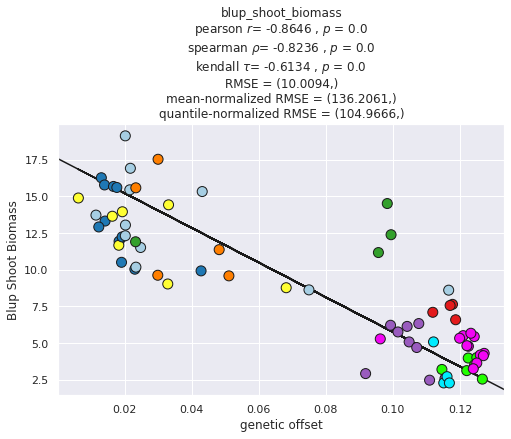

combined vancouver baypass-real k1
combined vancouver baypass-real k2
combined vancouver baypass-real k3
combined vancouver baypass-real k4
combined vancouver wza-random full
Beta: [-201.13380434   38.58991328]
Beta Std Error: [13.53383961  1.04354178]
Beta Covariance: [[352134.35412363 -23282.34629424]
 [-23282.34629424   2093.56296068]]
Residual Variance: 0.0005201560492874066
Inverse Condition #: 0.0385420055885726
Reason(s) for Halting:
  Sum of squares convergence
y = -201.1338x + 38.58991


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


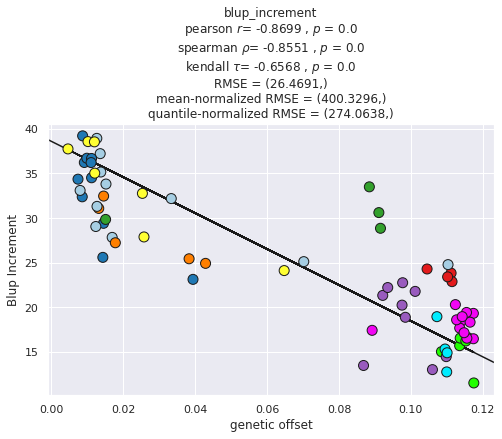

Beta: [-118.61753263   16.7352124 ]
Beta Std Error: [8.05914217 0.62102379]
Beta Covariance: [[123058.56811621  -8136.4086175 ]
 [ -8136.4086175     730.71950148]]
Residual Variance: 0.0005277956136533435
Inverse Condition #: 0.03844798903301506
Reason(s) for Halting:
  Sum of squares convergence
y = -118.61753x + 16.73521


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


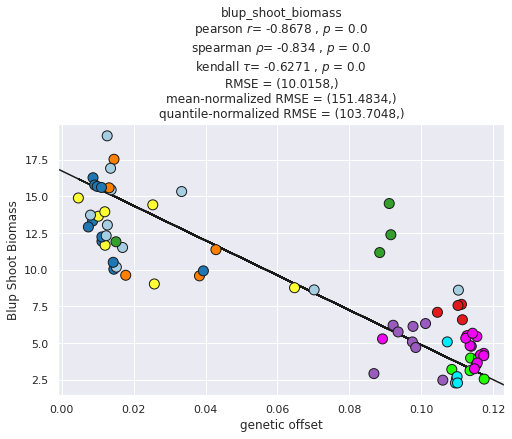

combined vancouver wza-random k1
combined vancouver wza-random k2
combined vancouver wza-random k3
combined vancouver wza-random k4
combined vancouver wza-real full
Beta: [-229.32814869   41.21239041]
Beta Std Error: [14.83409856  1.15195246]
Beta Covariance: [[595117.92800084 -41316.01273117]
 [-41316.01273117   3588.80472307]]
Residual Variance: 0.00036975945381589984
Inverse Condition #: 0.0335578036627727
Reason(s) for Halting:
  Sum of squares convergence
y = -229.32815x + 41.21239


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


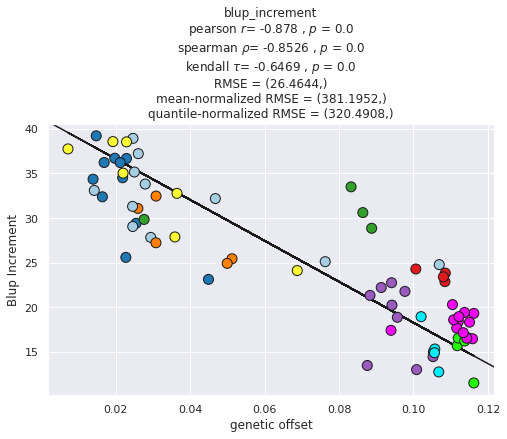

Beta: [-136.23251229   18.35036247]
Beta Std Error: [9.17916217 0.71144762]
Beta Covariance: [[214107.74476672 -14864.40917732]
 [-14864.40917732   1286.21079024]]
Residual Variance: 0.0003935262514136918
Inverse Condition #: 0.033226709483740645
Reason(s) for Halting:
  Sum of squares convergence
y = -136.23251x + 18.35036


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


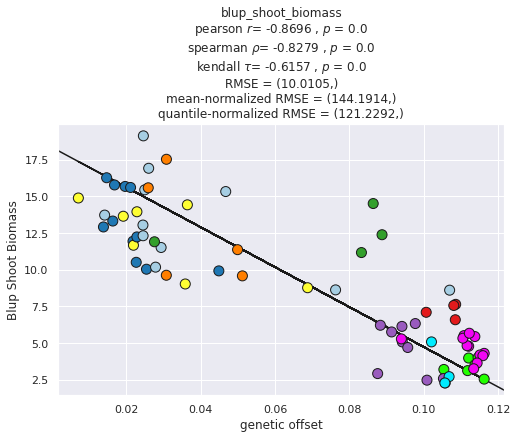

combined vancouver wza-real k1
combined vancouver wza-real k2
combined vancouver wza-real k3
combined vancouver wza-real k4
fdc vancouver baypass-random full
Beta: [-1767.33277624    50.13195268]
Beta Std Error: [382.37222186   4.07618292]
Beta Covariance: [[ 1.17808782e+10 -1.21670746e+08]
 [-1.21670746e+08  1.33878959e+06]]
Residual Variance: 1.2410663557578762e-05
Inverse Condition #: 0.039635009093486294
Reason(s) for Halting:
  Sum of squares convergence
y = -1767.33278x + 50.13195


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


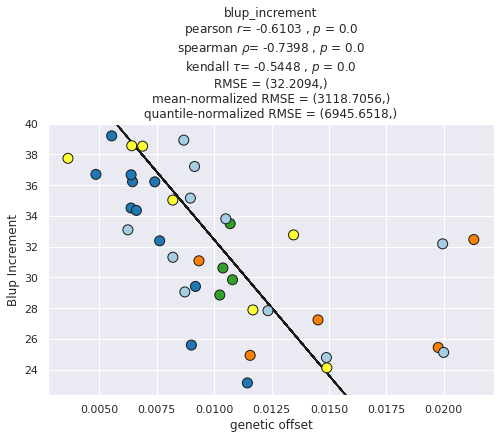

Beta: [-1954.54745564    33.05539965]
Beta Std Error: [972.35518214  10.1309114 ]
Beta Covariance: [[ 5.31768424e+10 -5.49200666e+08]
 [-5.49200666e+08  5.77257672e+06]]
Residual Variance: 1.777981837798539e-05
Inverse Condition #: 0.016258088283846506
Reason(s) for Halting:
  Sum of squares convergence
y = -1954.54746x + 33.0554


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


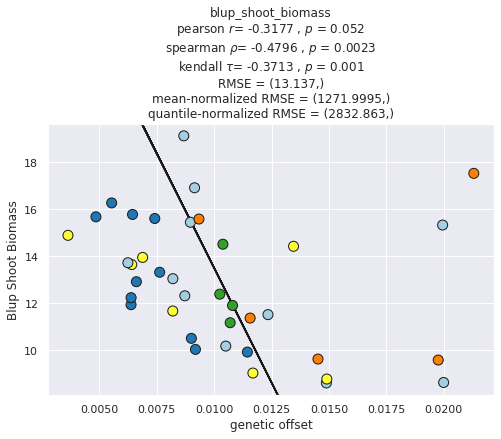

fdc vancouver baypass-random k1
fdc vancouver baypass-random k2
fdc vancouver baypass-random k3
fdc vancouver baypass-random k4
fdc vancouver baypass-real full
Beta: [-910.74174054   55.67286309]
Beta Std Error: [307.61362923   8.18978444]
Beta Covariance: [[ 8.30779781e+08 -2.17045530e+07]
 [-2.17045530e+07  5.88870385e+05]]
Residual Variance: 0.00011390039459895056
Inverse Condition #: 0.005020112723755557
Reason(s) for Halting:
  Sum of squares convergence
y = -910.74174x + 55.67286


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


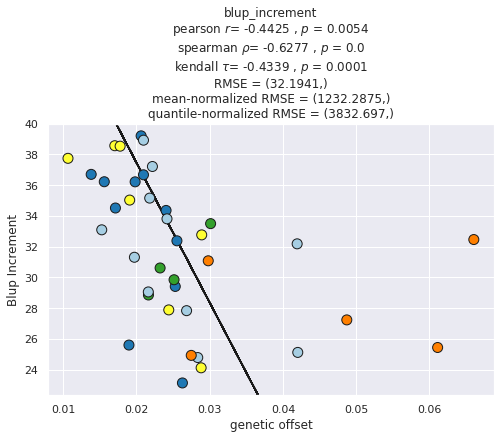

Beta: [-1282.38570694    46.37218139]
Beta Std Error: [1161.88539281   30.45235851]
Beta Covariance: [[ 9.85399953e+09 -2.57440833e+08]
 [-2.57440833e+08  6.76905155e+06]]
Residual Variance: 0.00013699794304889237
Inverse Condition #: 0.002046465818935817
Reason(s) for Halting:
  Sum of squares convergence
y = -1282.38571x + 46.37218


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


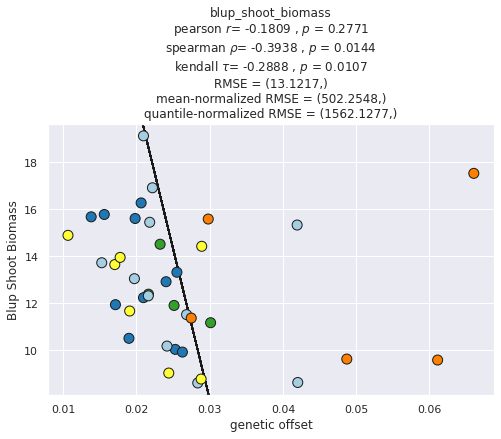

fdc vancouver baypass-real k1
fdc vancouver baypass-real k2
fdc vancouver baypass-real k3
fdc vancouver baypass-real k4
fdc vancouver wza-random full
Beta: [-1797.99913771    50.24092215]
Beta Std Error: [396.49414134   4.17792069]
Beta Covariance: [[ 1.26200835e+10 -1.28879738e+08]
 [-1.28879738e+08  1.40122882e+06]]
Residual Variance: 1.2456938551191108e-05
Inverse Condition #: 0.03887598167669176
Reason(s) for Halting:
  Sum of squares convergence
y = -1797.99914x + 50.24092


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


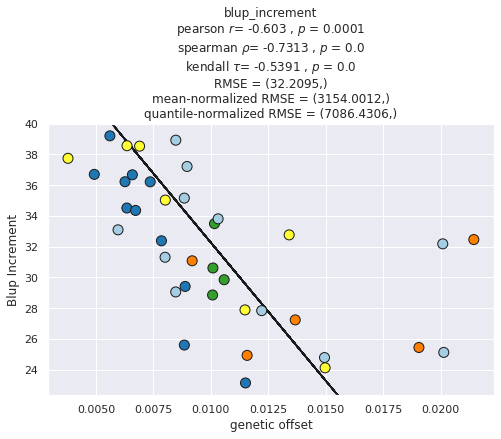

Beta: [-2033.60848058    33.63695693]
Beta Std Error: [1051.10868854   10.82371061]
Beta Covariance: [[ 6.23170705e+10 -6.36398922e+08]
 [-6.36398922e+08  6.60791003e+06]]
Residual Variance: 1.772916260285533e-05
Inverse Condition #: 0.015307217979536087
Reason(s) for Halting:
  Sum of squares convergence
y = -2033.60848x + 33.63696


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


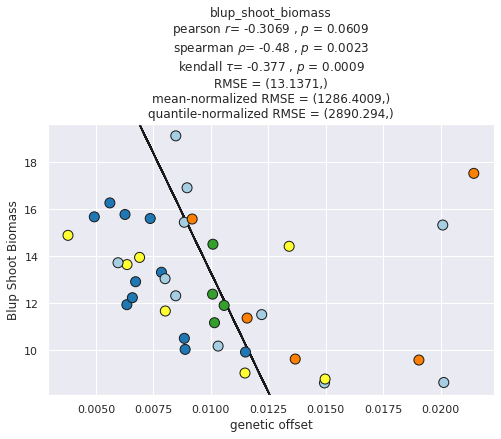

fdc vancouver wza-random k1
fdc vancouver wza-random k2
fdc vancouver wza-random k3
fdc vancouver wza-random k4
fdc vancouver wza-real full
Beta: [-948.90396352   64.17314161]
Beta Std Error: [349.33370131  12.01238548]
Beta Covariance: [[ 9.79024714e+08 -3.33189717e+07]
 [-3.33189717e+07  1.15763382e+06]]
Residual Variance: 0.0001246485743104984
Inverse Condition #: 0.004780255155394667
Reason(s) for Halting:
  Sum of squares convergence
y = -948.90396x + 64.17314


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


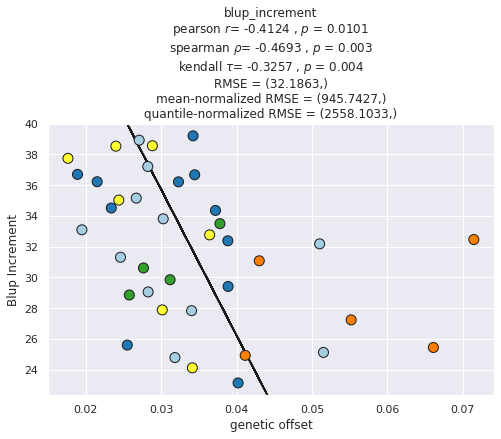

Beta: [-1326.26484184    58.00572442]
Beta Std Error: [1282.33142892   43.71864127]
Beta Covariance: [[ 1.12734956e+10 -3.83668843e+08]
 [-3.83668843e+08  1.31036215e+07]]
Residual Variance: 0.00014586193582119013
Inverse Condition #: 0.0019634665958771797
Reason(s) for Halting:
  Sum of squares convergence
y = -1326.26484x + 58.00572


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


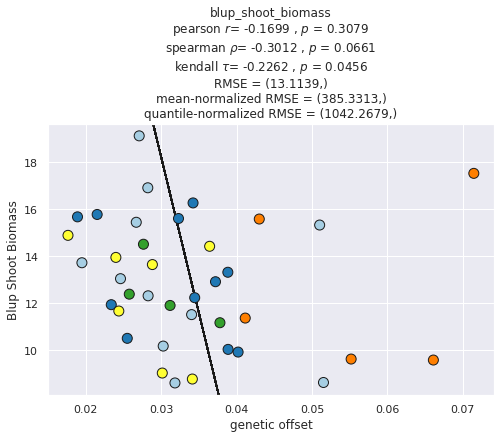

fdc vancouver wza-real k1
fdc vancouver wza-real k2
fdc vancouver wza-real k3
fdc vancouver wza-real k4
fdi vancouver baypass-random full
Beta: [-1939.38178493   106.18726271]
Beta Std Error: [1571.40461043   71.39220492]
Beta Covariance: [[ 3.72587491e+10 -1.69155997e+09]
 [-1.69155997e+09  7.69048651e+07]]
Residual Variance: 6.62747007628161e-05
Inverse Condition #: 0.00162718294136266
Reason(s) for Halting:
  Sum of squares convergence
y = -1939.38178x + 106.18726


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


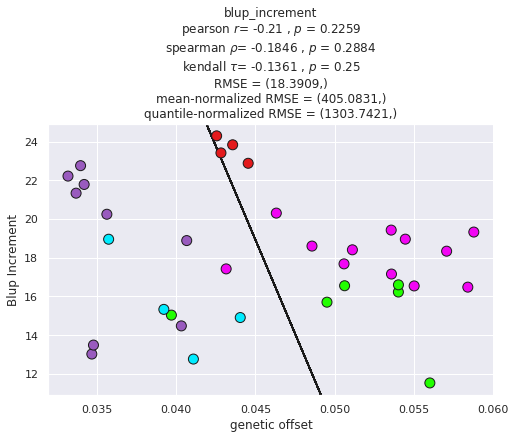

Beta: [-1049.98963003    52.24469907]
Beta Std Error: [1003.65527559   45.58948369]
Beta Covariance: [[ 1.50104667e+10 -6.81480340e+08]
 [-6.81480340e+08  3.09709408e+07]]
Residual Variance: 6.710810092350256e-05
Inverse Condition #: 0.0013876246519141026
Reason(s) for Halting:
  Sum of squares convergence
y = -1049.98963x + 52.2447


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


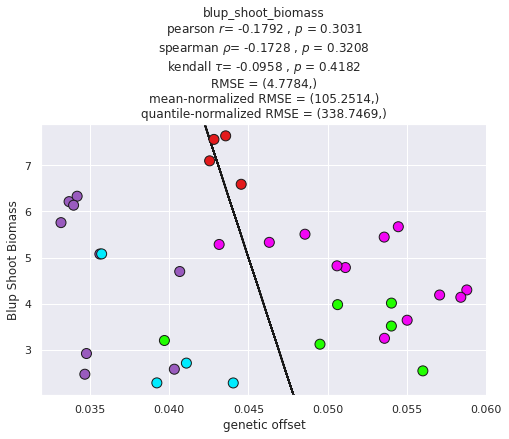

fdi vancouver baypass-random k1
fdi vancouver baypass-random k2
fdi vancouver baypass-random k3
fdi vancouver baypass-random k4
fdi vancouver baypass-real full
Beta: [-723.48084215  110.45881339]
Beta Std Error: [677.81660967  86.54816786]
Beta Covariance: [[ 7.21579872e+08 -9.20775746e+07]
 [-9.20775746e+07  1.17645618e+07]]
Residual Variance: 0.0006367075551816193
Inverse Condition #: 0.0040535618662563356
Reason(s) for Halting:
  Sum of squares convergence
y = -723.48084x + 110.45881


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


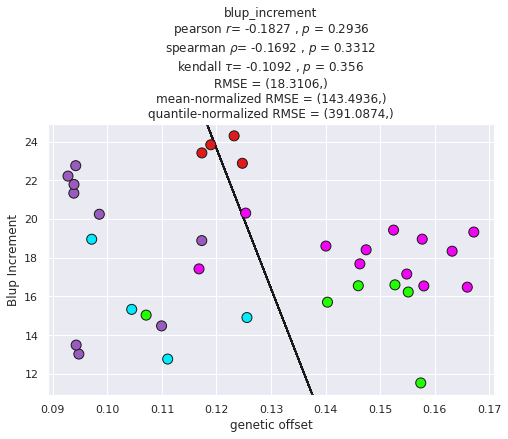

Beta: [-383.98265215   53.57311581]
Beta Std Error: [415.17976943  53.00475117]
Beta Covariance: [[ 2.68474792e+08 -3.42588658e+07]
 [-3.42588658e+07  4.37583310e+06]]
Residual Variance: 0.0006420500017022522
Inverse Condition #: 0.0035252321197544495
Reason(s) for Halting:
  Sum of squares convergence
y = -383.98265x + 53.57312


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


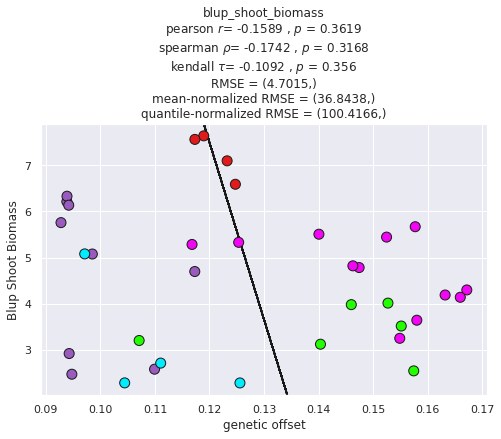

fdi vancouver baypass-real k1
fdi vancouver baypass-real k2
fdi vancouver baypass-real k3
fdi vancouver baypass-real k4
fdi vancouver wza-random full
Beta: [-2046.49667124   106.54633165]
Beta Std Error: [1656.63861464   71.61563568]
Beta Covariance: [[ 4.61976533e+10 -1.99571630e+09]
 [-1.99571630e+09  8.63336410e+07]]
Residual Variance: 5.940672967002107e-05
Inverse Condition #: 0.001545141308805307
Reason(s) for Halting:
  Sum of squares convergence
y = -2046.49667x + 106.54633


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


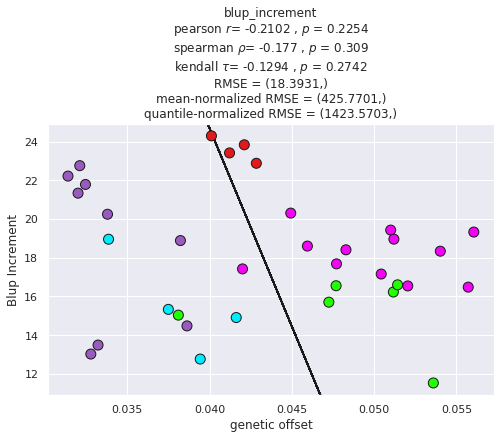

Beta: [-1139.25476699    53.79006523]
Beta Std Error: [1119.68435567   48.39291912]
Beta Covariance: [[ 2.08035633e+10 -8.98703900e+08]
 [-8.98703900e+08  3.88606579e+07]]
Residual Variance: 6.026338069896377e-05
Inverse Condition #: 0.0012814613647368202
Reason(s) for Halting:
  Sum of squares convergence
y = -1139.25477x + 53.79007


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


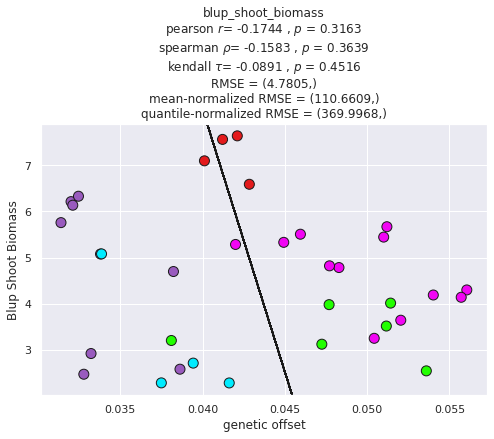

fdi vancouver wza-random k1
fdi vancouver wza-random k2
fdi vancouver wza-random k3
fdi vancouver wza-random k4
fdi vancouver wza-real full
Beta: [-581.40795678  103.19391747]
Beta Std Error: [530.45241958  77.65903176]
Beta Covariance: [[ 3.00954100e+08 -4.40271352e+07]
 [-4.40271352e+07  6.45046968e+06]]
Residual Variance: 0.0009349590818825467
Inverse Condition #: 0.004966296393367286
Reason(s) for Halting:
  Sum of squares convergence
y = -581.40796x + 103.19392


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


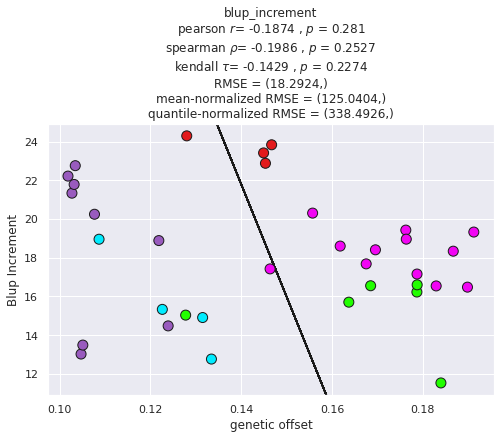

Beta: [-364.46741604   57.89342682]
Beta Std Error: [455.12315501  66.60790022]
Beta Covariance: [[ 2.17917846e+08 -3.18796075e+07]
 [-3.18796075e+07  4.66752250e+06]]
Residual Variance: 0.000950528330946207
Inverse Condition #: 0.003653904784343706
Reason(s) for Halting:
  Sum of squares convergence
y = -364.46742x + 57.89343


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


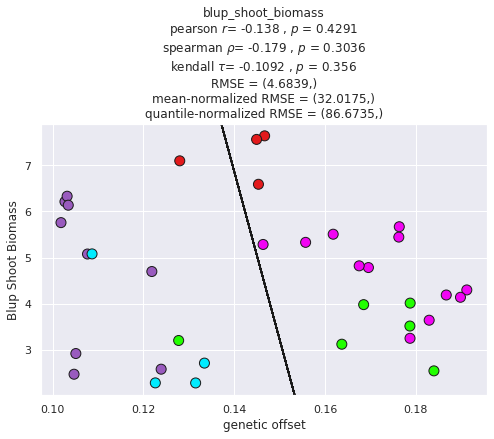

fdi vancouver wza-real k1
fdi vancouver wza-real k2
fdi vancouver wza-real k3
fdi vancouver wza-real k4
jp christine baypass-random full
Beta: [5124.53970277    9.90546897]
Beta Std Error: [1755.52349315   23.22420761]
Beta Covariance: [[ 2.58529718e+11 -3.38451345e+09]
 [-3.38451345e+09  4.52458750e+07]]
Residual Variance: 1.1920729109046703e-05
Inverse Condition #: 0.03223995577152685
Reason(s) for Halting:
  Sum of squares convergence
y = 5124.5397x + 9.90547


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


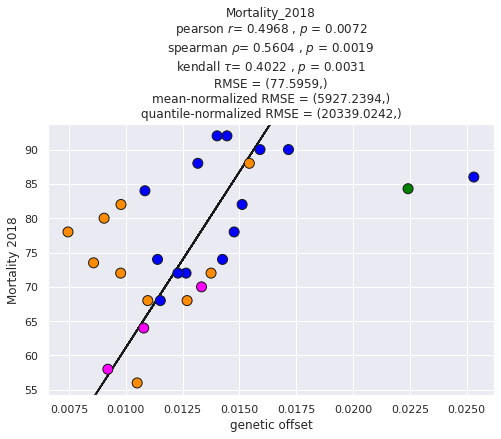

Beta: [-16767.77039797   2094.75678576]
Beta Std Error: [3254.6399272    47.93047975]
Beta Covariance: [[ 2.20687717e+11 -2.88906076e+09]
 [-2.88906076e+09  4.78625483e+07]]
Residual Variance: 4.799850761038618e-05
Inverse Condition #: 0.006702262236594062
Reason(s) for Halting:
  Iteration limit reached
y = -16767.7704x + 2094.75679


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


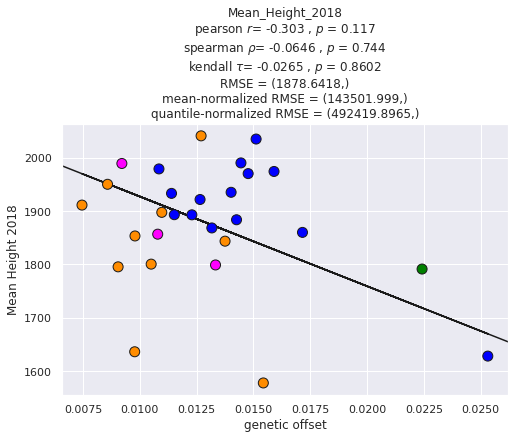

Beta: [-5238.41926208   302.10908811]
Beta Std Error: [1556.55900755   21.02581197]
Beta Covariance: [[ 8.84360940e+10 -1.15773943e+09]
 [-1.15773943e+09  1.61362988e+07]]
Residual Variance: 2.7396912652120656e-05
Inverse Condition #: 0.003296688510975876
Reason(s) for Halting:
  Iteration limit reached
y = -5238.41926x + 302.10909


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


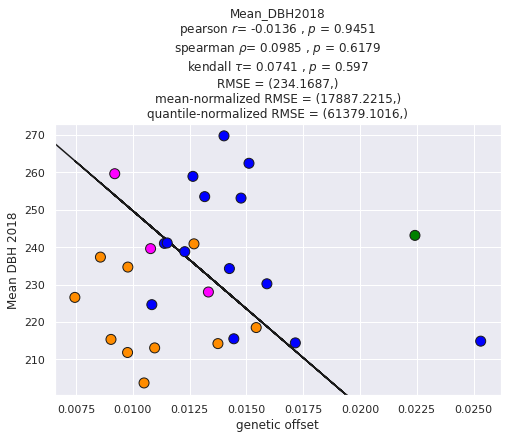

jp christine baypass-random k1
jp christine baypass-random k2
jp christine baypass-random k3
jp christine baypass-real full
Beta: [1836.04862256   22.13453706]
Beta Std Error: [606.66302757  18.4108345 ]
Beta Covariance: [[ 4.26016348e+09 -1.27287155e+08]
 [-1.27287155e+08  3.92354065e+06]]
Residual Variance: 8.639105774390354e-05
Inverse Condition #: 0.00518836531598876
Reason(s) for Halting:
  Sum of squares convergence
y = 1836.04862x + 22.13454


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


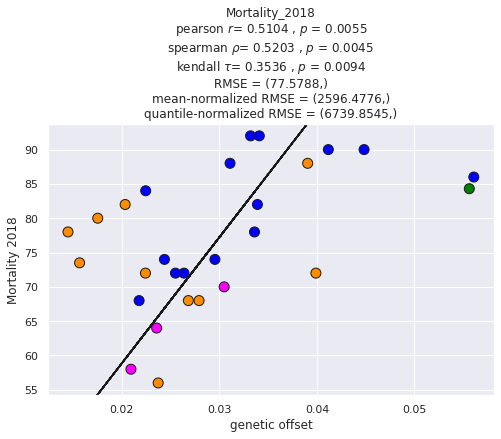

Beta: [-10577.77957719   2191.26736794]
Beta Std Error: [2433.06715149   77.20538122]
Beta Covariance: [[ 3.49507850e+10 -1.04418521e+09]
 [-1.04418521e+09  3.51919950e+07]]
Residual Variance: 0.00016937575972036844
Inverse Condition #: 0.010489170109934727
Reason(s) for Halting:
  Iteration limit reached
y = -10577.77958x + 2191.26737


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


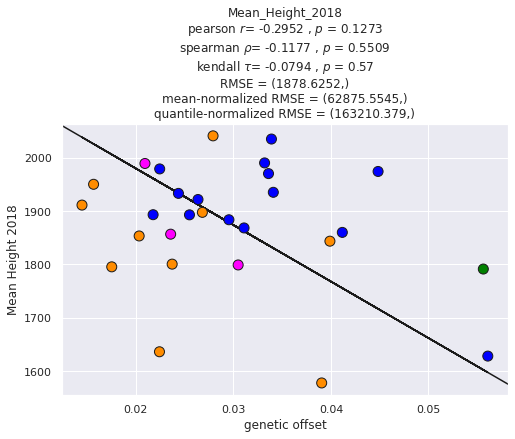

Beta: [-5064.05121976   384.83621775]
Beta Std Error: [3108.68788436   93.49677797]
Beta Covariance: [[ 7.72364641e+10 -2.30768461e+09]
 [-2.30768461e+09  6.98652845e+07]]
Residual Variance: 0.00012512147567476326
Inverse Condition #: 0.0033548019423622257
Reason(s) for Halting:
  Iteration limit reached
y = -5064.05122x + 384.83622


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


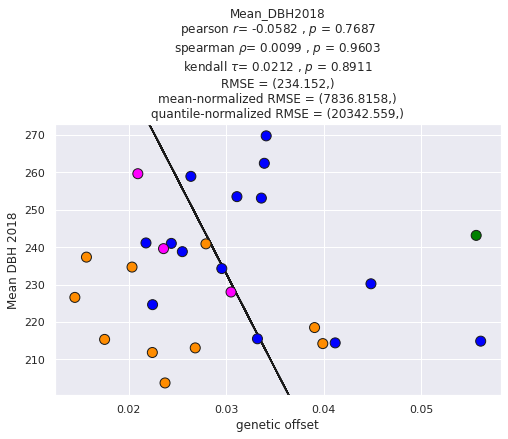

jp christine baypass-real k1
jp christine baypass-real k2
jp christine baypass-real k3
jp christine wza-random full
Beta: [5258.66002248    6.9041339 ]
Beta Std Error: [1834.68476672   24.68912306]
Beta Covariance: [[ 2.86674896e+11 -3.82087597e+09]
 [-3.82087597e+09  5.19132337e+07]]
Residual Variance: 1.174176128262111e-05
Inverse Condition #: 0.03133662136230643
Reason(s) for Halting:
  Sum of squares convergence
y = 5258.66002x + 6.90413


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


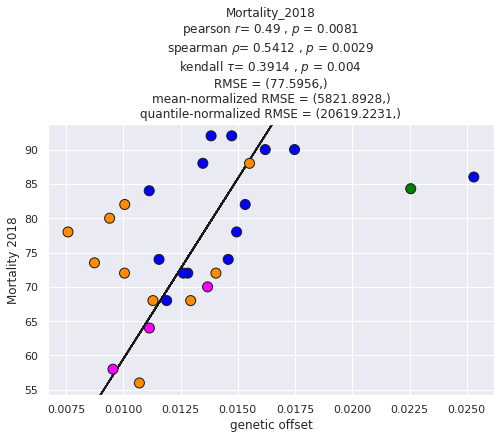

Beta: [-16843.26306644   2099.73432413]
Beta Std Error: [3269.46194701   48.79385582]
Beta Covariance: [[ 2.24689008e+11 -2.99465958e+09]
 [-2.99465958e+09  5.00448659e+07]]
Residual Variance: 4.7574118224689724e-05
Inverse Condition #: 0.0066704586854534325
Reason(s) for Halting:
  Iteration limit reached
y = -16843.26307x + 2099.73432


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


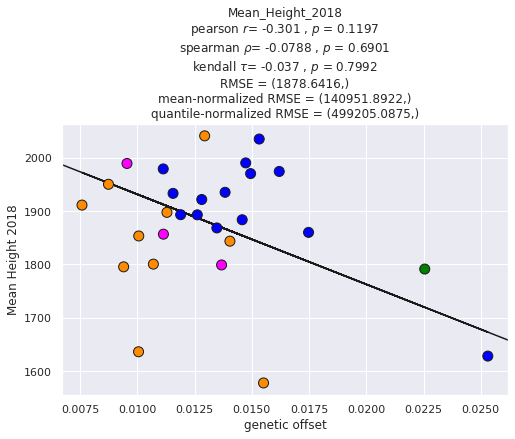

Beta: [-5102.82355282   301.54252585]
Beta Std Error: [1477.44908789   20.32858231]
Beta Covariance: [[ 7.96284757e+10 -1.06129581e+09]
 [-1.06129581e+09  1.50750076e+07]]
Residual Variance: 2.741300504740873e-05
Inverse Condition #: 0.0033837982991766703
Reason(s) for Halting:
  Iteration limit reached
y = -5102.82355x + 301.54253


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


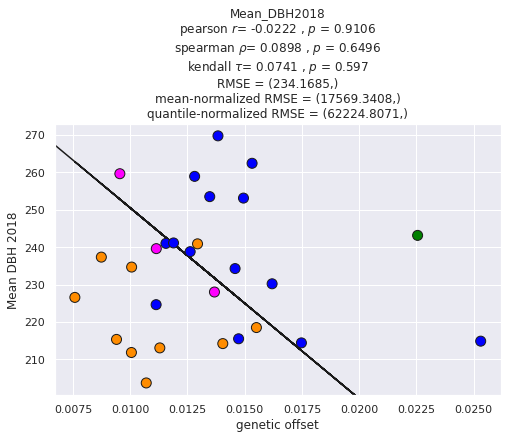

jp christine wza-random k1
jp christine wza-random k2
jp christine wza-random k3
jp christine wza-real full
Beta: [1529.61890036   24.42343474]
Beta Std Error: [531.78453743  18.58854426]
Beta Covariance: [[ 2.05221388e+09 -7.05297910e+07]
 [-7.05297910e+07  2.50750593e+06]]
Residual Variance: 0.0001377998646669916
Inverse Condition #: 0.006206868239789141
Reason(s) for Halting:
  Sum of squares convergence
y = 1529.6189x + 24.42343


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


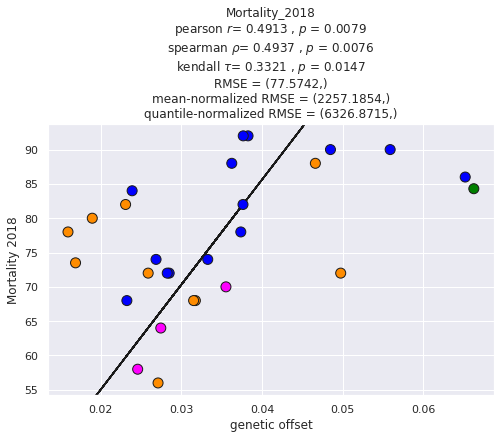

Beta: [-9842.42228655  2213.47729826]
Beta Std Error: [2428.85395598   88.00961206]
Beta Covariance: [[ 2.61991321e+10 -9.00321123e+08]
 [-9.00321123e+08  3.43988809e+07]]
Residual Variance: 0.00022517278531779302
Inverse Condition #: 0.011231832063821856
Reason(s) for Halting:
  Iteration limit reached
y = -9842.42229x + 2213.4773


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


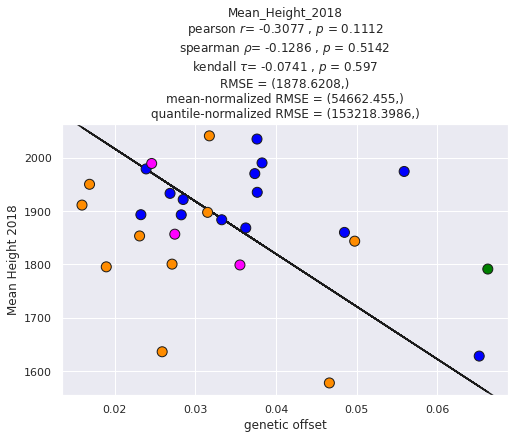

Beta: [-4963.50879782   404.11444049]
Beta Std Error: [3635.57651276  125.59644981]
Beta Covariance: [[ 7.12830344e+10 -2.44981176e+09]
 [-2.44981176e+09  8.50735053e+07]]
Residual Variance: 0.0001854216320560735
Inverse Condition #: 0.0034080777351388225
Reason(s) for Halting:
  Iteration limit reached
y = -4963.5088x + 404.11444


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


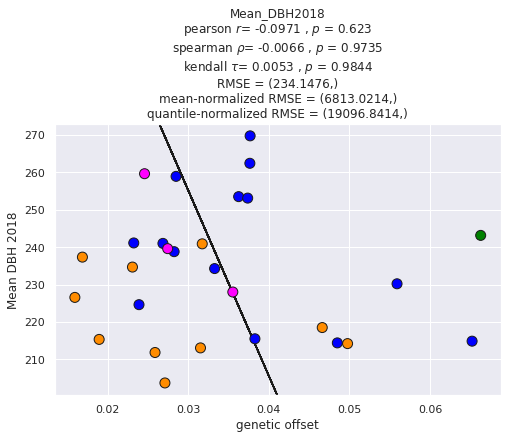

jp christine wza-real k1
jp christine wza-real k2
jp christine wza-real k3
jp fontbrune baypass-random full
Beta: [7302.6673734    -8.59549078]
Beta Std Error: [2726.73595343   29.36815851]
Beta Covariance: [[ 8.05972283e+11 -8.58849741e+09]
 [-8.58849741e+09  9.34947811e+07]]
Residual Variance: 9.224993359250673e-06
Inverse Condition #: 0.03682835872693717
Reason(s) for Halting:
  Iteration limit reached
y = 7302.66737x + -8.59549


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


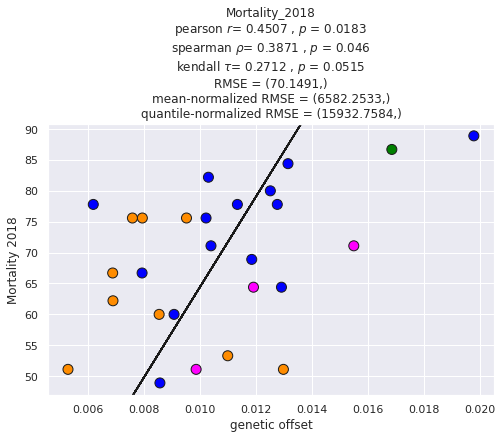

Beta: [-29735.5151677    1916.58187142]
Beta Std Error: [5603.93187244   62.50580333]
Beta Covariance: [[ 3.02308062e+12 -3.22177568e+10]
 [-3.22177568e+10  3.76101199e+08]]
Residual Variance: 1.0388096227288068e-05
Inverse Condition #: 0.0032671739723383933
Reason(s) for Halting:
  Iteration limit reached
y = -29735.51517x + 1916.58187


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


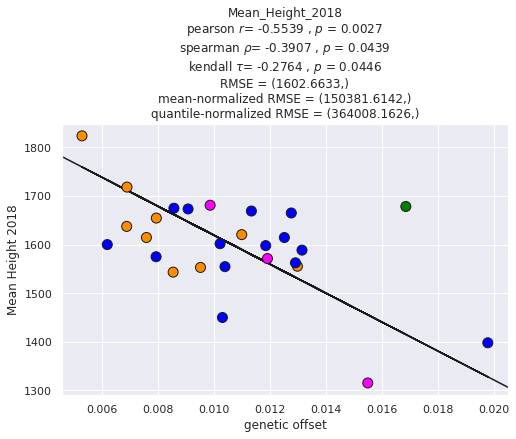

Beta: [-9315.89973315   267.15097135]
Beta Std Error: [2572.98073075   27.89946363]
Beta Covariance: [[ 7.98873539e+11 -8.51287582e+09]
 [-8.51287582e+09  9.39283464e+07]]
Residual Variance: 8.286955967230953e-06
Inverse Condition #: 0.027077093317262085
Reason(s) for Halting:
  Iteration limit reached
y = -9315.89973x + 267.15097


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


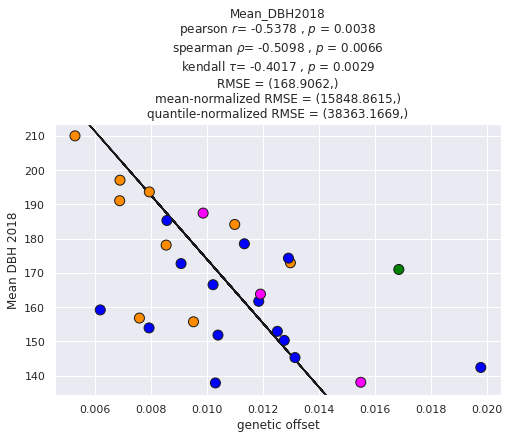

jp fontbrune baypass-random k1
jp fontbrune baypass-random k2
jp fontbrune baypass-random k3
jp fontbrune baypass-real full
Beta: [2.49284220e+03 1.23843718e+00]
Beta Std Error: [892.6627986   24.68616424]
Beta Covariance: [[ 1.09436540e+10 -2.98451208e+08]
 [-2.98451208e+08  8.36940741e+06]]
Residual Variance: 7.281360255640528e-05
Inverse Condition #: 0.04074654673090806
Reason(s) for Halting:
  Sum of squares convergence
y = 2492.8422x + 1.23844


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


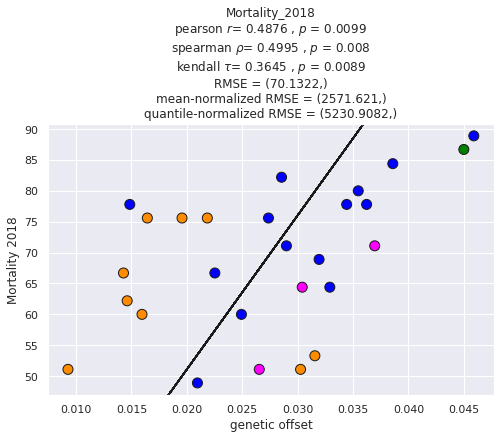

Beta: [-12819.38342232   1949.27800953]
Beta Std Error: [3068.8066943   86.906461 ]
Beta Covariance: [[ 1.04428265e+11 -2.84784589e+09]
 [-2.84784589e+09  8.37496744e+07]]
Residual Variance: 9.018223671386822e-05
Inverse Condition #: 0.007486571186817539
Reason(s) for Halting:
  Iteration limit reached
y = -12819.38342x + 1949.27801


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


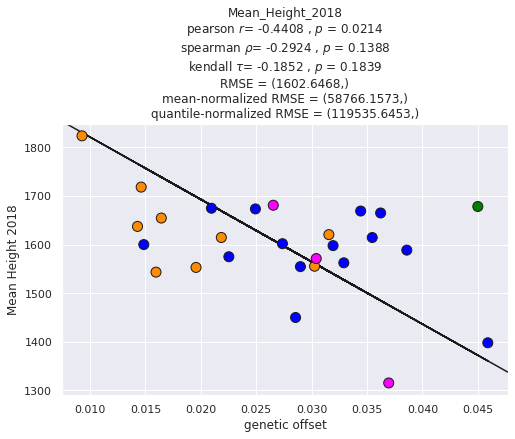

Beta: [-3383.37178264   260.14976339]
Beta Std Error: [932.63884711  25.95090227]
Beta Covariance: [[ 1.38987740e+10 -3.79041754e+08]
 [-3.79041754e+08  1.07610442e+07]]
Residual Variance: 6.258215409347118e-05
Inverse Condition #: 0.005405184052634585
Reason(s) for Halting:
  Sum of squares convergence
y = -3383.37178x + 260.14976


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


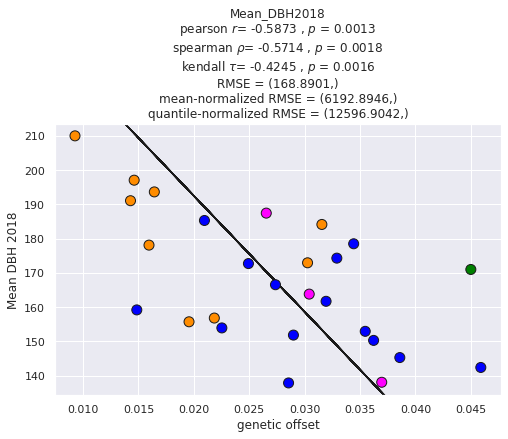

jp fontbrune baypass-real k1
jp fontbrune baypass-real k2
jp fontbrune baypass-real k3
jp fontbrune wza-random full
Beta: [7548.49600668  -13.24881988]
Beta Std Error: [2870.21860051   31.65839289]
Beta Covariance: [[ 9.20103562e+11 -1.00525842e+10]
 [-1.00525842e+10  1.11939791e+08]]
Residual Variance: 8.9535082294409e-06
Inverse Condition #: 0.03511762496355716
Reason(s) for Halting:
  Iteration limit reached
y = 7548.49601x + -13.24882


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


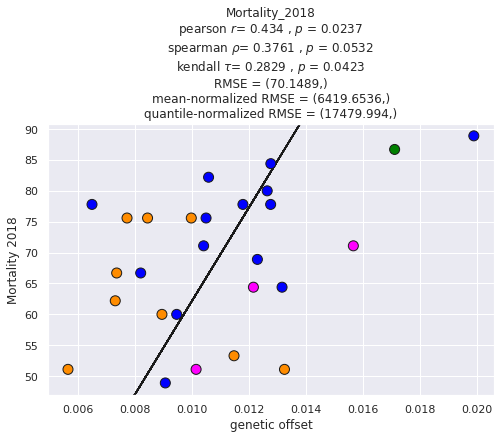

Beta: [-27993.36421616   1905.57042682]
Beta Std Error: [5094.52510513   58.44857393]
Beta Covariance: [[ 2.37447815e+12 -2.59462785e+10]
 [-2.59462785e+10  3.12542155e+08]]
Residual Variance: 1.0930480056941405e-05
Inverse Condition #: 0.0034702716046016296
Reason(s) for Halting:
  Iteration limit reached
y = -27993.36422x + 1905.57043


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


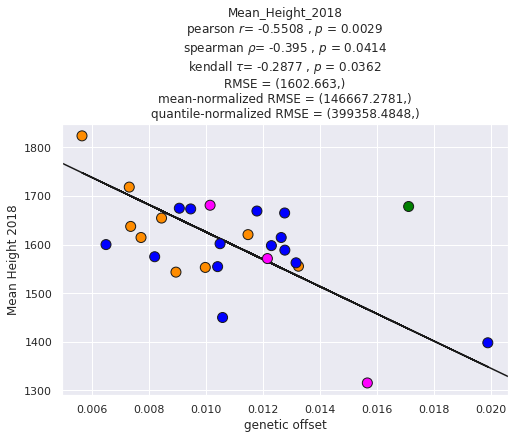

Beta: [-9540.06952188   272.11176298]
Beta Std Error: [2686.93208912   29.82465723]
Beta Covariance: [[ 8.78587944e+11 -9.59918932e+09]
 [-9.59918932e+09  1.08248723e+08]]
Residual Variance: 8.217281038782211e-06
Inverse Condition #: 0.025824754276805237
Reason(s) for Halting:
  Iteration limit reached
y = -9540.06952x + 272.11176


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


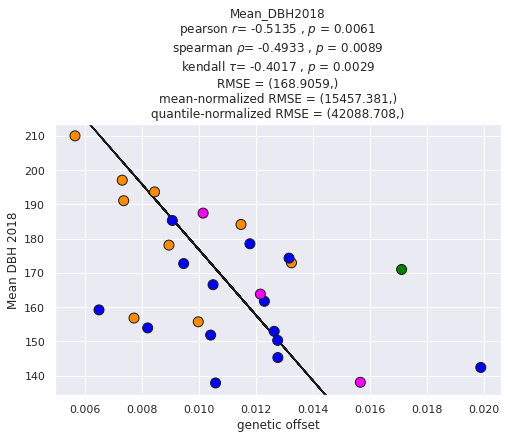

jp fontbrune wza-random k1
jp fontbrune wza-random k2
jp fontbrune wza-random k3
jp fontbrune wza-real full
Beta: [2.11214696e+03 1.14013382e+00]
Beta Std Error: [815.12868997  26.64233794]
Beta Covariance: [[ 5.64031069e+09 -1.81807398e+08]
 [-1.81807398e+08  6.02553113e+06]]
Residual Variance: 0.00011780109595567336
Inverse Condition #: 0.005270741424070668
Reason(s) for Halting:
  Sum of squares convergence
y = 2112.14696x + 1.14013


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


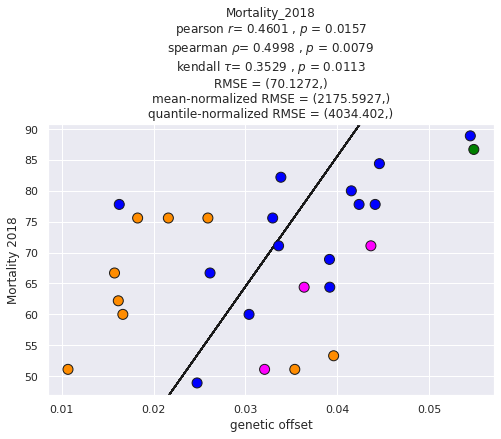

Beta: [-10560.71463832   1940.07760871]
Beta Std Error: [2661.43225734   89.25902024]
Beta Covariance: [[ 4.80975264e+10 -1.55028814e+09]
 [-1.55028814e+09  5.40998598e+07]]
Residual Variance: 0.00014726789908383746
Inverse Condition #: 0.009057729021351367
Reason(s) for Halting:
  Iteration limit reached
y = -10560.71464x + 1940.07761


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


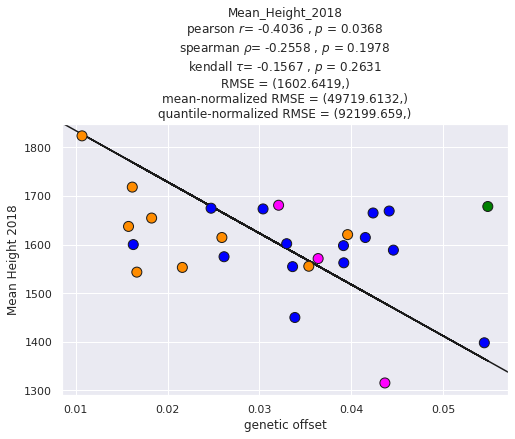

Beta: [-2897.47399419   261.27581744]
Beta Std Error: [883.94676095  29.05748999]
Beta Covariance: [[ 7.47576594e+09 -2.40970806e+08]
 [-2.40970806e+08  8.07829432e+06]]
Residual Variance: 0.00010451930710925467
Inverse Condition #: 0.006286658544538559
Reason(s) for Halting:
  Sum of squares convergence
y = -2897.47399x + 261.27582


<ipython-input-24-4059696a0adf>:64: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = pd.Series(xlims[0]).append(x)
<ipython-input-24-4059696a0adf>:65: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  xnew = xnew.append(pd.Series(xlims[1]))


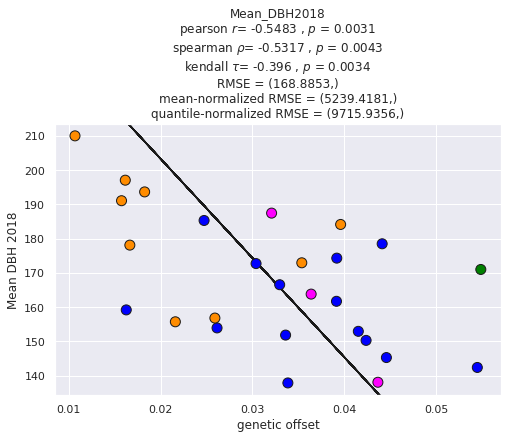

jp fontbrune wza-real k1
jp fontbrune wza-real k2
jp fontbrune wza-real k3
Function `get_statistics` completed after : 0-00:00:14


In [29]:
_ = get_statistics(plot_using='odr', switch_xy=True)

<a id='crossval'></a>
# cross-validation correlations

[top](#home)

In [30]:
# validation_scores['pearson'][garden][spp][dataset][kfold][pheno]

In [31]:
# get average r2s from cross-validation, store cv scores
cv_scores = wrap_defaultdict(None, 4)  # store cv scores
cv = wrap_defaultdict(None, 4)  # average cv scores

for garden,sppdict in validation_scores['pearson'].items():
    for spp,datadict in sppdict.items():
        for dataset,kdict in datadict.items():
            _vals = wrap_defaultdict(list, 2)
            for kfold,phenodict in kdict.items():
                if kfold == 'full':
                    continue
                assert kfold.startswith('k')
                for pheno,(sqstat, pval) in phenodict.items():
                    _vals['pearson'][pheno].append(sqstat)
                    for validation_stat in ['spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                        _vals[validation_stat][pheno].append(
                            validation_scores[validation_stat][garden][spp][dataset][kfold][pheno][0]
                        )
        
            for validation_stat in ['pearson', 'spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                cv_scores[validation_stat][garden][spp][dataset] = _vals[validation_stat]
                # create a dictionary with keys=phenos and vals = average r2 among cv sets
                cv[validation_stat][garden][spp][dataset] = dict(
                    pd.DataFrame(_vals[validation_stat]).apply(lambda x: x.mean())
                )

pd.DataFrame(_vals['spearman']).head()

,Mortality_2018,Mean_Height_2018,Mean_DBH2018
0,0.7531,0.2000,-0.2667
1,0.1757,-0.0667,-0.6500
2,0.1350,-0.6333,-0.3000


In [32]:
garden,spp,dataset

('fontbrune', 'jp', 'wza-real')

In [33]:
dict(pd.DataFrame(_vals['spearman']).apply(lambda x: x.mean()))

{'Mortality_2018': 0.3546,
 'Mean_Height_2018': -0.16666666666666666,
 'Mean_DBH2018': -0.4055666666666667}

In [34]:
# create dataframe to hold all of the scores
results = {}
for garden,sppdict in cv['pearson'].items():
    for spp,datadict in sppdict.items():
        if spp not in results:
            results[spp] = pd.DataFrame()
        for dataset,phenodict in datadict.items():
            for pheno,cv_pearson_r2 in phenodict.items():
                # easier names
                cv_spearman_r2 = cv['spearman'][garden][spp][dataset][pheno]
                full_spearman_r2 = validation_scores['spearman'][garden][spp][dataset]['full'][pheno][0]
                r2 = validation_scores['pearson'][garden][spp][dataset]['full'][pheno][0]
                # add data to dataframe
                results[spp].loc[
                    nrow(results[spp]),
                    ['garden',
                     'pheno',
                     'dataset',
                     'full_pearson',
                     'cv_pearson',
                     'full_spearman',
                     'cv_spearman',
                     'full_rmse',
                     'cv_rmse',
                     'full_rmse_mean',
                     'cv_rmse_mean',
                     'full_rmse_iq',
                     'cv_rmse_iq']
                ] = (garden,
                     pheno,
                     dataset,
                     r2,
                     cv_pearson_r2,
                     full_spearman_r2,
                     cv_spearman_r2,
                     validation_scores['rmse'][garden][spp][dataset]['full'][pheno][0],                     
                     cv['rmse'][garden][spp][dataset][pheno],
                     validation_scores['rmse_mean'][garden][spp][dataset]['full'][pheno][0],
                     cv['rmse_mean'][garden][spp][dataset][pheno],
                     validation_scores['rmse_iq'][garden][spp][dataset]['full'][pheno][0],
                     cv['rmse_iq'][garden][spp][dataset][pheno])

# save to file
for spp,df in results.items():
    f = op.join(txtdir, f'{spp}_validation_results.txt')
    print('\n', ColorText(spp).custom('blue').bold(), nrow(df))
    print('   ', ColorText('saved to :').bold(), f)
    df.to_csv(f, sep='\t', index=False)
    display(df)


 combined 8
    saved to : /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/combined_validation_results.txt


,garden,pheno,dataset,full_pearson,cv_pearson,full_spearman,cv_spearman,full_rmse,cv_rmse,full_rmse_mean,cv_rmse_mean,full_rmse_iq,cv_rmse_iq
0,vancouver,blup_increment,baypass-random,-0.8700,-0.867725,-0.8550,-0.848275,26.4699,26.456475,1.0466,1.046025,1.8836,1.988925
1,vancouver,blup_shoot_biomass,baypass-random,-0.8677,-0.860250,-0.8352,-0.836275,10.0164,10.013550,1.1264,1.126325,1.2317,1.301500
2,vancouver,blup_increment,baypass-real,-0.8695,-0.868325,-0.8481,-0.841500,26.4621,26.450300,1.0463,1.045775,1.8831,1.988450
3,vancouver,blup_shoot_biomass,baypass-real,-0.8646,-0.860850,-0.8236,-0.828925,10.0094,10.007875,1.1256,1.125675,1.2308,1.300750
4,vancouver,blup_increment,wza-random,-0.8699,-0.867325,-0.8551,-0.848700,26.4691,26.455425,1.0466,1.045975,1.8836,1.988850
5,vancouver,blup_shoot_biomass,wza-random,-0.8678,-0.859925,-0.8340,-0.835825,10.0158,10.012775,1.1263,1.126225,1.2316,1.301400
6,vancouver,blup_increment,wza-real,-0.8780,-0.872275,-0.8526,-0.840975,26.4644,26.451525,1.0464,1.045800,1.8833,1.988525
7,vancouver,blup_shoot_biomass,wza-real,-0.8696,-0.864300,-0.8279,-0.828300,10.0105,10.008175,1.1257,1.125725,1.2310,1.300800



 fdc 8
    saved to : /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/fdc_validation_results.txt


,garden,pheno,dataset,full_pearson,cv_pearson,full_spearman,cv_spearman,full_rmse,cv_rmse,full_rmse_mean,cv_rmse_mean,full_rmse_iq,cv_rmse_iq
0,vancouver,blup_increment,baypass-random,-0.6103,-0.562300,-0.7398,-0.635225,32.2094,32.180000,1.0104,1.009525,4.1164,4.853575
1,vancouver,blup_shoot_biomass,baypass-random,-0.3177,-0.366200,-0.4796,-0.451500,13.1370,13.114325,1.0208,1.019325,2.8886,3.648225
2,vancouver,blup_increment,baypass-real,-0.4425,-0.443425,-0.6277,-0.578800,32.1941,32.165950,1.0099,1.009075,4.1145,4.851400
3,vancouver,blup_shoot_biomass,baypass-real,-0.1809,-0.279275,-0.3938,-0.382950,13.1217,13.100175,1.0196,1.018200,2.8852,3.644325
4,vancouver,blup_increment,wza-random,-0.6030,-0.552800,-0.7313,-0.643550,32.2095,32.180100,1.0104,1.009525,4.1165,4.853575
5,vancouver,blup_shoot_biomass,wza-random,-0.3069,-0.349075,-0.4800,-0.443175,13.1371,13.114425,1.0208,1.019325,2.8886,3.648250
6,vancouver,blup_increment,wza-real,-0.4124,-0.423050,-0.4693,-0.503800,32.1863,32.160350,1.0096,1.008900,4.1135,4.850625
7,vancouver,blup_shoot_biomass,wza-real,-0.1699,-0.277525,-0.3012,-0.334850,13.1139,13.094650,1.0190,1.017800,2.8835,3.642750



 fdi 8
    saved to : /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/fdi_validation_results.txt


,garden,pheno,dataset,full_pearson,cv_pearson,full_spearman,cv_spearman,full_rmse,cv_rmse,full_rmse_mean,cv_rmse_mean,full_rmse_iq,cv_rmse_iq
0,vancouver,blup_increment,baypass-random,-0.2100,-0.187650,-0.1846,-0.087500,18.3909,18.345750,1.0139,1.012325,4.2677,5.221225
1,vancouver,blup_shoot_biomass,baypass-random,-0.1792,-0.196475,-0.1728,-0.133350,4.7784,4.746825,1.0445,1.042250,2.0228,3.037575
2,vancouver,blup_increment,baypass-real,-0.1827,-0.158800,-0.1692,-0.050000,18.3106,18.274725,1.0095,1.008400,4.2491,5.201075
3,vancouver,blup_shoot_biomass,baypass-real,-0.1589,-0.172650,-0.1742,-0.104175,4.7015,4.678650,1.0277,1.027225,1.9902,2.994200
4,vancouver,blup_increment,wza-random,-0.2102,-0.187250,-0.1770,-0.075600,18.3931,18.348200,1.0140,1.012450,4.2682,5.221975
5,vancouver,blup_shoot_biomass,wza-random,-0.1744,-0.196475,-0.1583,-0.121450,4.7805,4.749175,1.0450,1.042750,2.0237,3.039075
6,vancouver,blup_increment,wza-real,-0.1874,-0.154175,-0.1986,-0.070850,18.2924,18.252075,1.0085,1.007075,4.2448,5.194875
7,vancouver,blup_shoot_biomass,wza-real,-0.1380,-0.153650,-0.1790,-0.112500,4.6839,4.656900,1.0238,1.022300,1.9828,2.981325



 jp 24
    saved to : /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/jp_validation_results.txt


,garden,pheno,dataset,full_pearson,cv_pearson,full_spearman,cv_spearman,full_rmse,cv_rmse,full_rmse_mean,cv_rmse_mean,full_rmse_iq,cv_rmse_iq
0,christine,Mortality_2018,baypass-random,0.4968,0.421433,0.5604,0.413067,77.5959,77.520433,1.0078,1.007533,5.8674,5.659333
1,christine,Mean_Height_2018,baypass-random,-0.3030,-0.360933,-0.0646,-0.163633,1878.6418,1878.832200,1.0018,1.001767,15.3776,24.911733
2,christine,Mean_DBH2018,baypass-random,-0.0136,-0.132233,0.0985,-0.036400,234.1687,234.021733,1.0027,1.002600,8.9488,10.415300
3,christine,Mortality_2018,baypass-real,0.5104,0.419000,0.5203,0.300833,77.5788,77.504633,1.0076,1.007333,5.8661,5.658200
4,christine,Mean_Height_2018,baypass-real,-0.2952,-0.346800,-0.1177,-0.148500,1878.6252,1878.816833,1.0018,1.001767,15.3775,24.911567
5,christine,Mean_DBH2018,baypass-real,-0.0582,-0.233500,0.0099,-0.196467,234.1520,234.006333,1.0027,1.002533,8.9482,10.414600
6,christine,Mortality_2018,wza-random,0.4900,0.420533,0.5412,0.429300,77.5956,77.519833,1.0078,1.007533,5.8673,5.659300
7,christine,Mean_Height_2018,wza-random,-0.3010,-0.374167,-0.0788,-0.159600,1878.6416,1878.831600,1.0018,1.001767,15.3776,24.911733
8,christine,Mean_DBH2018,wza-random,-0.0222,-0.144733,0.0898,-0.028300,234.1685,234.021167,1.0027,1.002600,8.9488,10.415267
9,christine,Mortality_2018,wza-real,0.4913,0.415467,0.4937,0.276267,77.5742,77.500467,1.0076,1.007300,5.8657,5.657900


<a id='subset'></a>
# 5. get stats from full-variety/interior model for each variety and genetic group

[top](#home)

In [35]:
# match order from figs in ../09_RONA.ipynb
pretty_order = ['baypass-real',
                'baypass-pseudo_random_loci',
                'baypass-random',
                'wza-real',
                'wza-pseudo_random_loci',
                'wza-random']

### get stats for coastal and interior groups

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_baypass-real_full_regplot_blup_increment.pdf


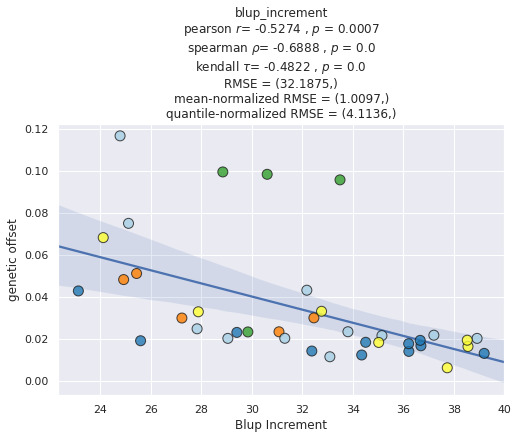

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


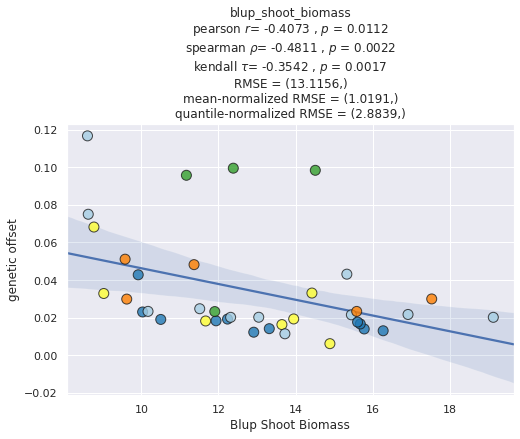

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_baypass-random_full_regplot_blup_increment.pdf


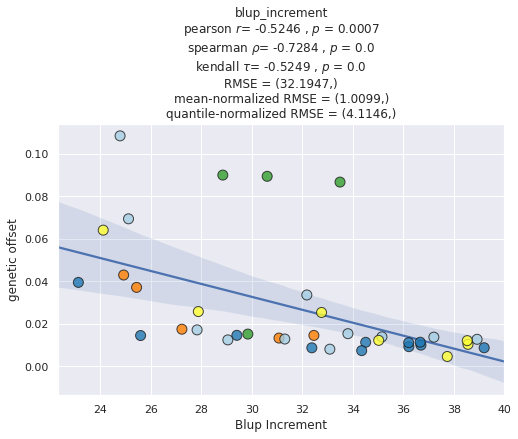

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


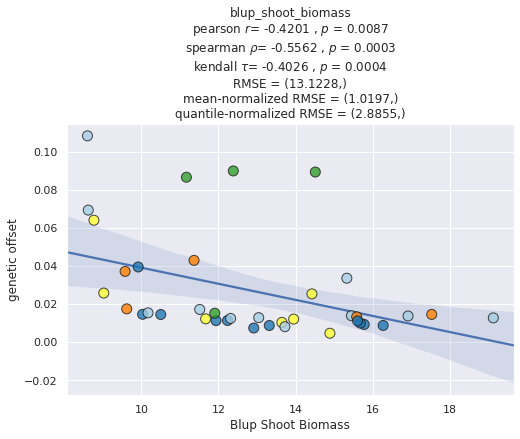

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_wza-real_full_regplot_blup_increment.pdf


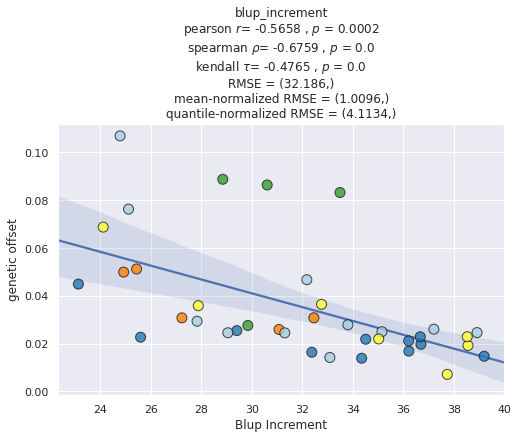

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


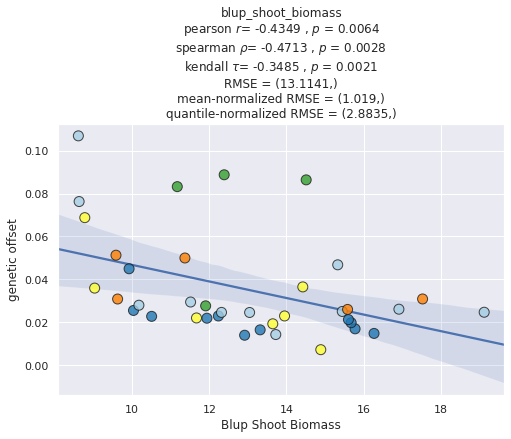

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_wza-random_full_regplot_blup_increment.pdf


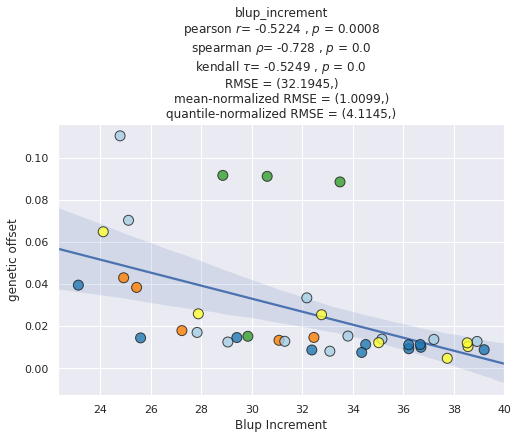

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdc-combined_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


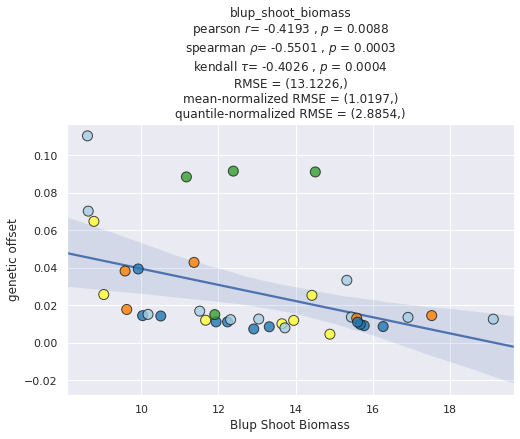

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_baypass-real_full_regplot_blup_increment.pdf


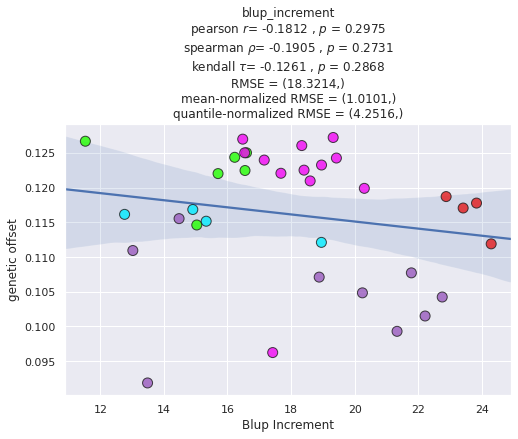

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


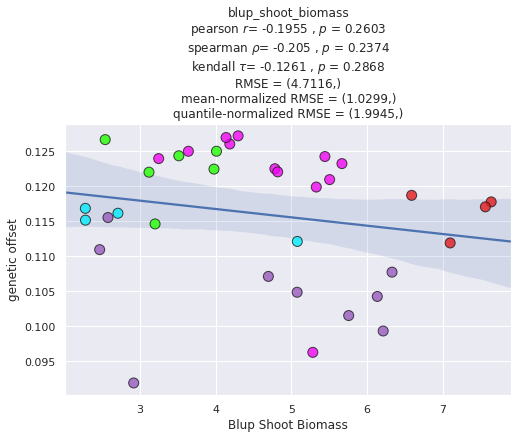

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_baypass-random_full_regplot_blup_increment.pdf


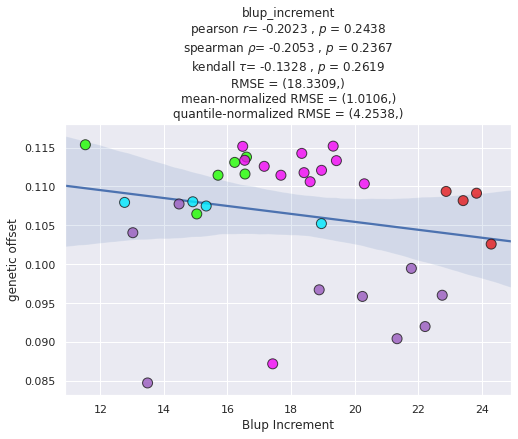

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


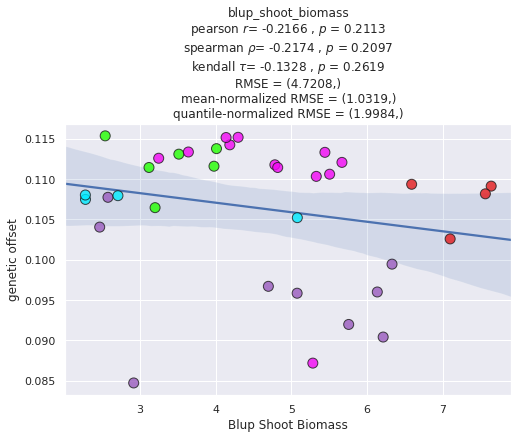

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_wza-real_full_regplot_blup_increment.pdf


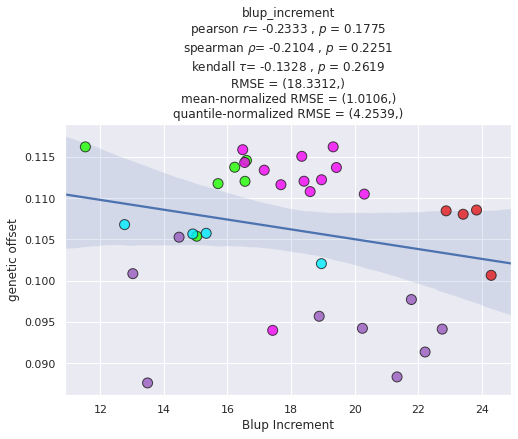

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


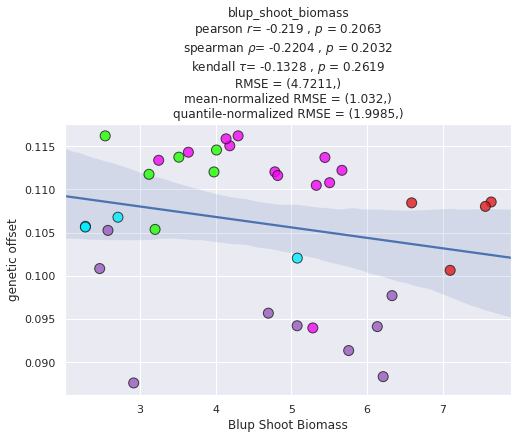

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_wza-random_full_regplot_blup_increment.pdf


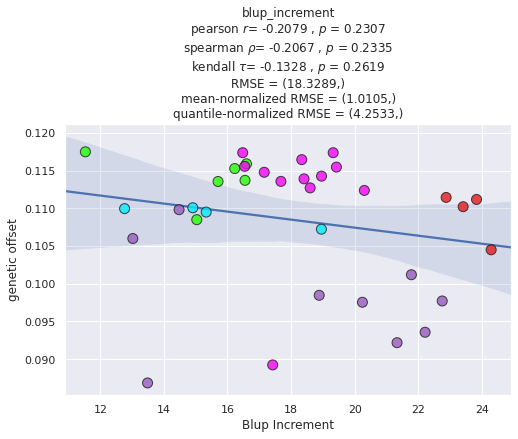

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/fdi-combined_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


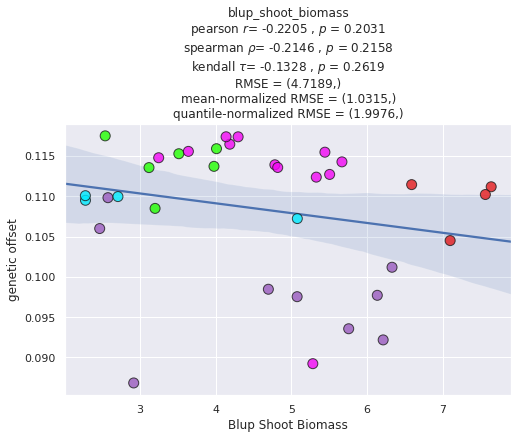

In [36]:
# get correlation between phenotype and offset from the combined model for each individual variety

# - send an `offsets` data frame to `calculate_statistics` that is subset from the combined to only include a specific variety
files = []
validation_scores_twovariety = wrap_defaultdict(None, 5)
# for switch_xy in [True, False]:
for variety in ['fdc', 'fdi']:
    for dataset in pretty_order: 
        for kfold,offset_df in offsets['vancouver']['combined'][dataset].items():
            varoffset_df = offset_df[offset_df.index.isin(envdata[variety].index)]
            
            if kfold != 'full':
                cvdata = testtrain['combined'][f'{kfold} training']
                plot_using = None
            else:
                cvdata = None
                plot_using = 'regplot'
                
            valdict = calculate_statistics(varoffset_df,
                                           phenodata['combined']['vancouver'][['blup_increment', 'blup_shoot_biomass']],
                                           cvdata=cvdata,
                                           plot_with=plot_using,
#                                                switch_xy=switch_xy,
                                           saveloc=op.join(figdir, f'{variety}-combined_vancouver_{dataset}_{kfold}_regplot.pdf'))
            for validation_stat in ['pearson', 'spearman', 'rmse', 'rmse_mean', 'rmse_iq', 'tls_residuals']:
                validation_scores_twovariety[
                    validation_stat][
                    'vancouver'][
                    f'{variety}-combined'][
                    dataset][
                    kfold] = valdict[validation_stat]

### get stats for interior genetic groups

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_baypass-real_full_regplot_blup_increment.pdf


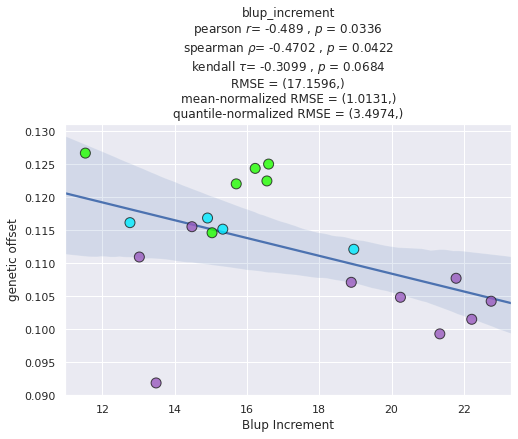

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


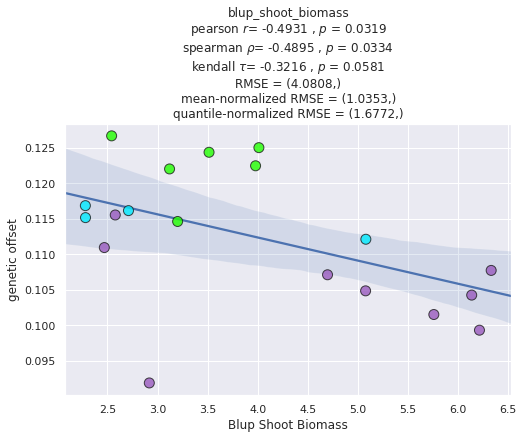

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_baypass-real_full_regplot_blup_increment.pdf


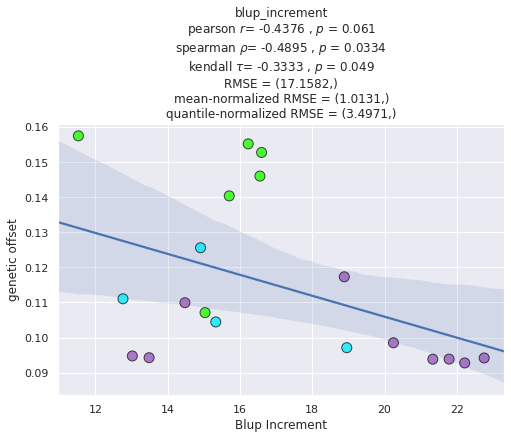

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


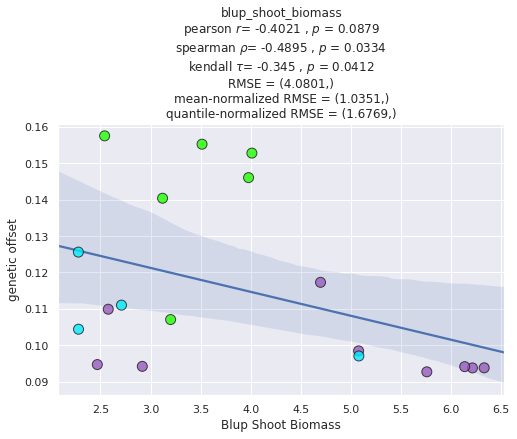

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_baypass-random_full_regplot_blup_increment.pdf


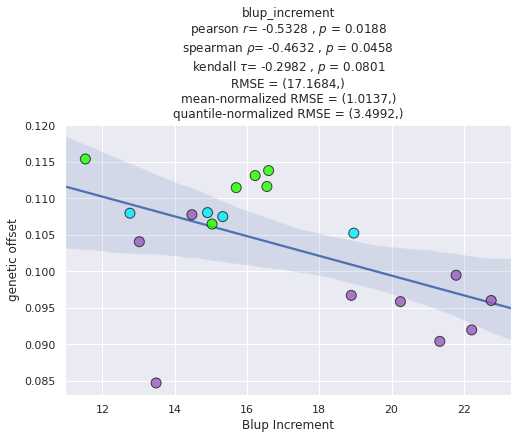

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


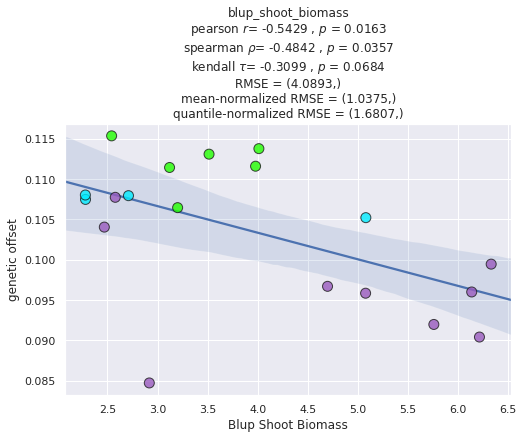

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_baypass-random_full_regplot_blup_increment.pdf


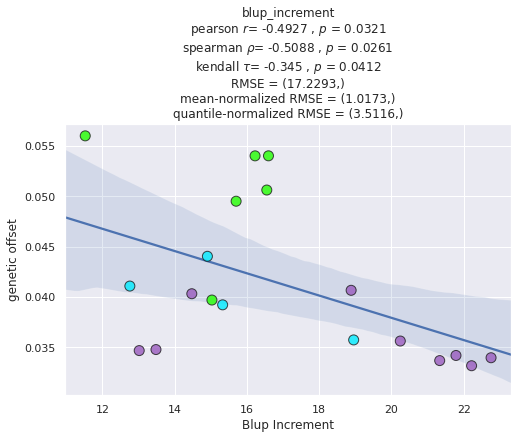

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


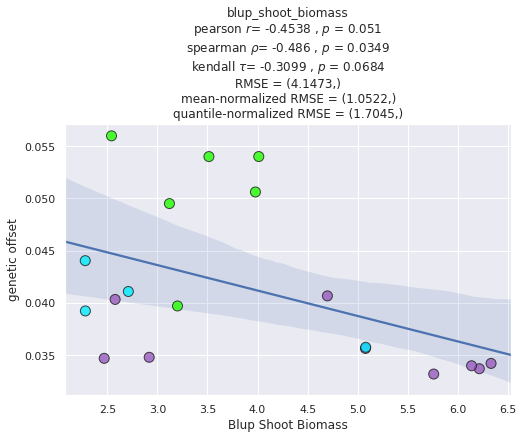

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_wza-real_full_regplot_blup_increment.pdf


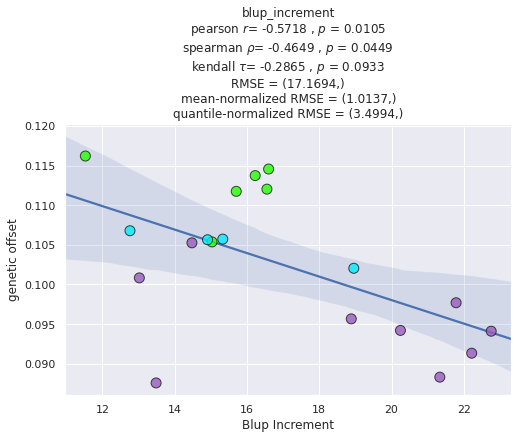

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


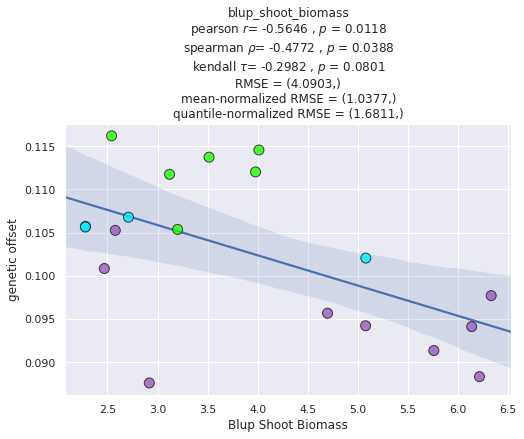

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_wza-real_full_regplot_blup_increment.pdf


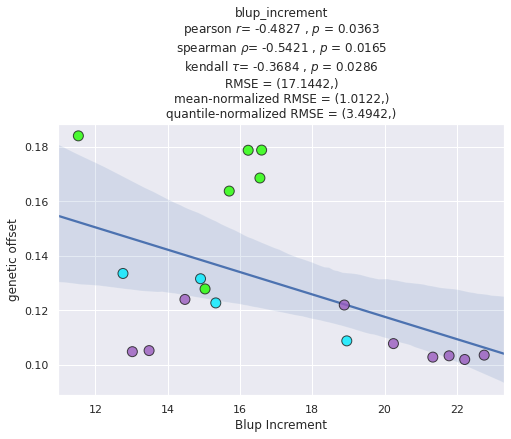

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


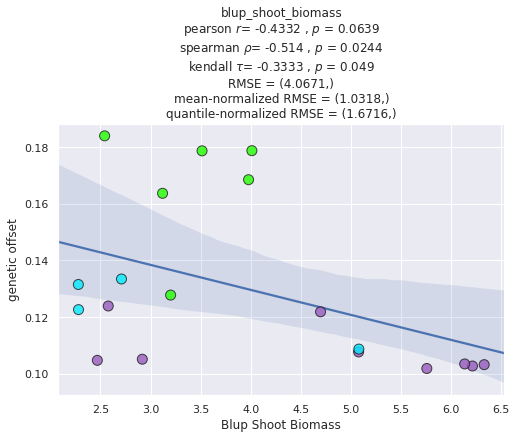

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_wza-random_full_regplot_blup_increment.pdf


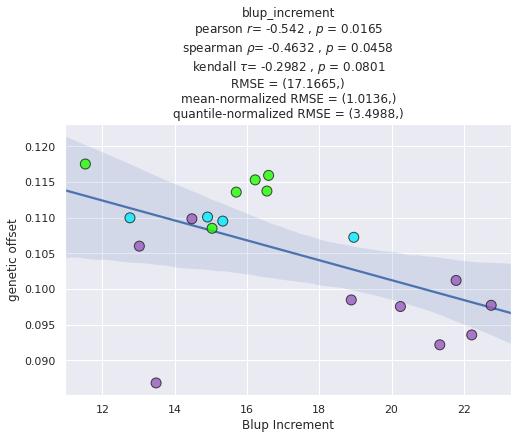

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-combined_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


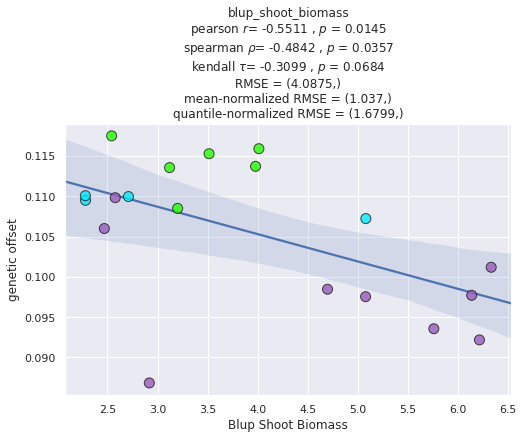

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_wza-random_full_regplot_blup_increment.pdf


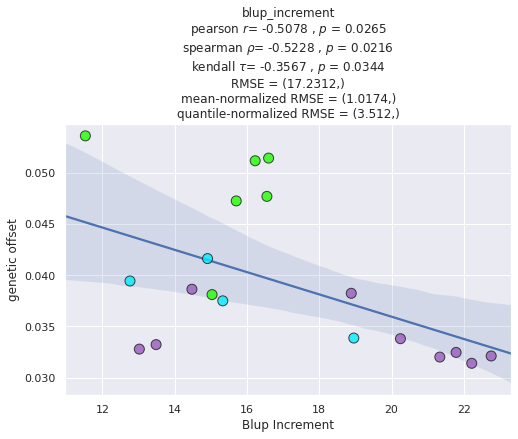

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/eastern-fdi_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


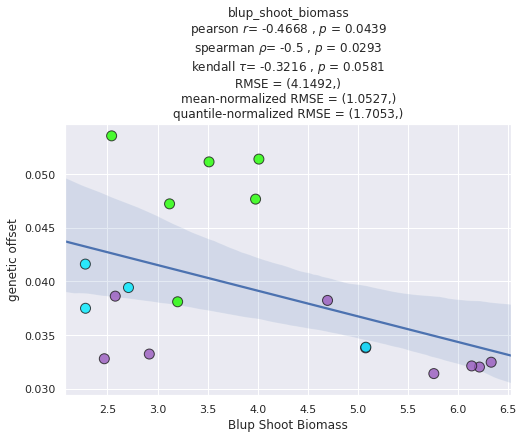

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_baypass-real_full_regplot_blup_increment.pdf


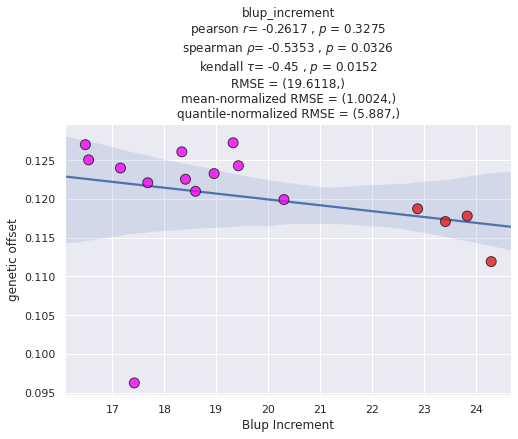

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


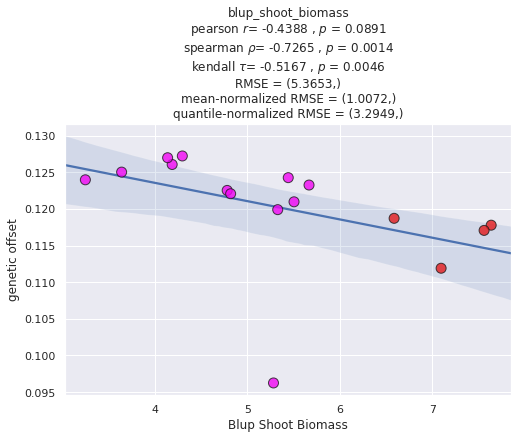

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_baypass-real_full_regplot_blup_increment.pdf


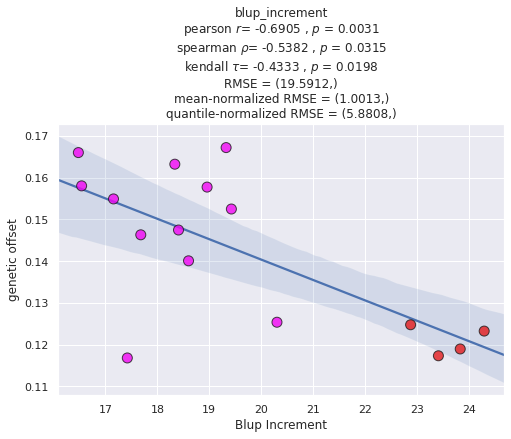

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_baypass-real_full_regplot_blup_shoot_biomass.pdf


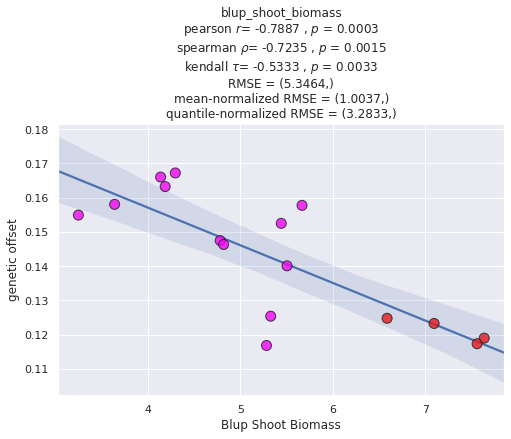

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_baypass-random_full_regplot_blup_increment.pdf


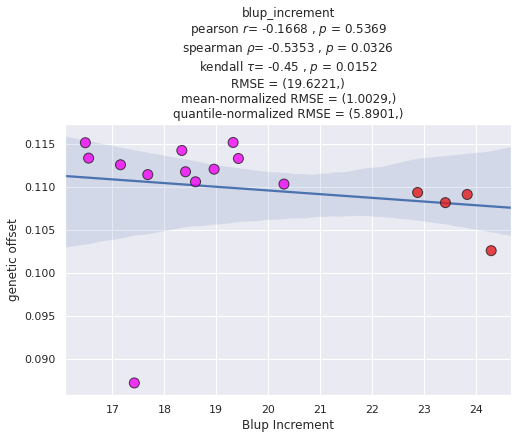

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


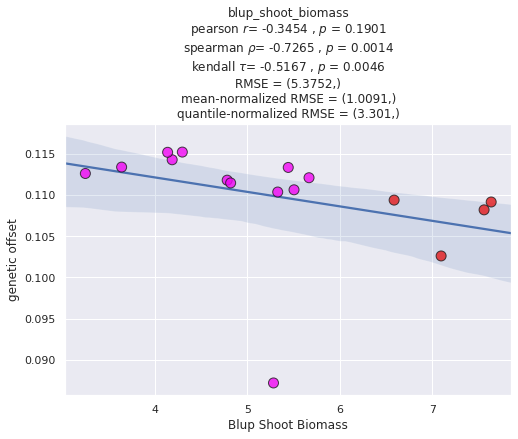

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_baypass-random_full_regplot_blup_increment.pdf


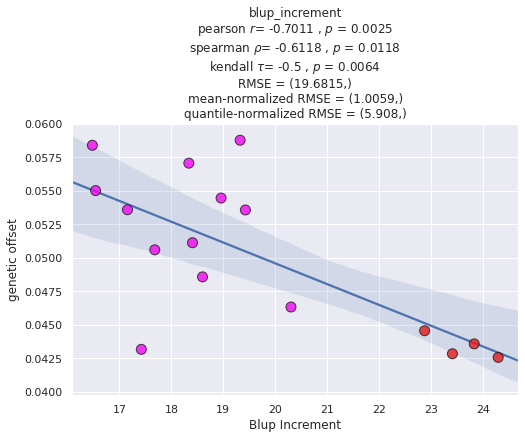

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_baypass-random_full_regplot_blup_shoot_biomass.pdf


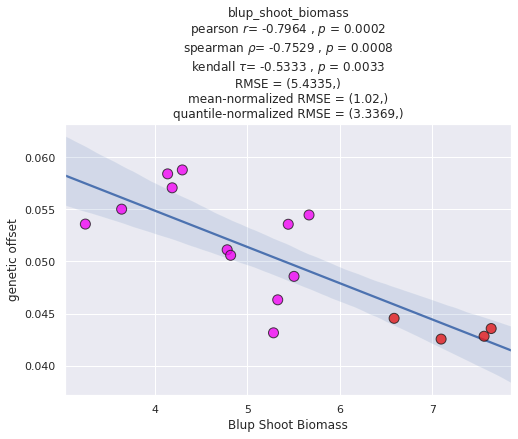

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_wza-real_full_regplot_blup_increment.pdf


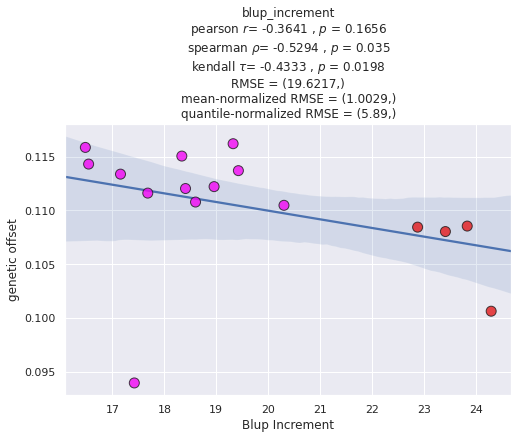

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


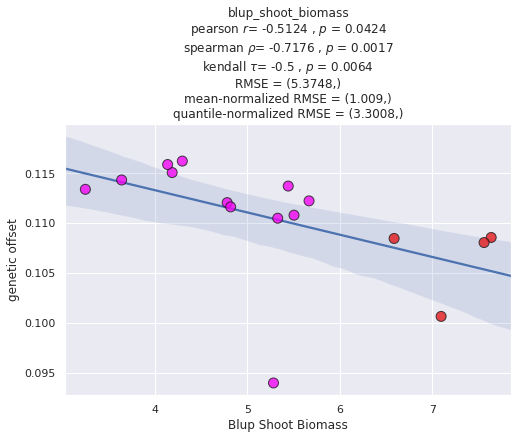

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_wza-real_full_regplot_blup_increment.pdf


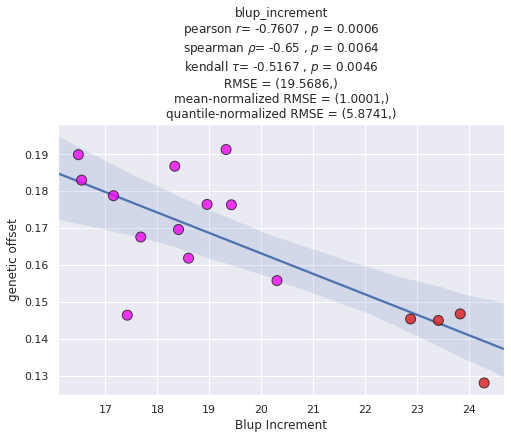

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_wza-real_full_regplot_blup_shoot_biomass.pdf


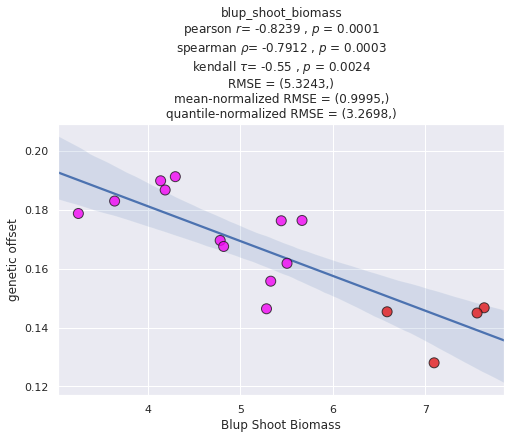

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_wza-random_full_regplot_blup_increment.pdf


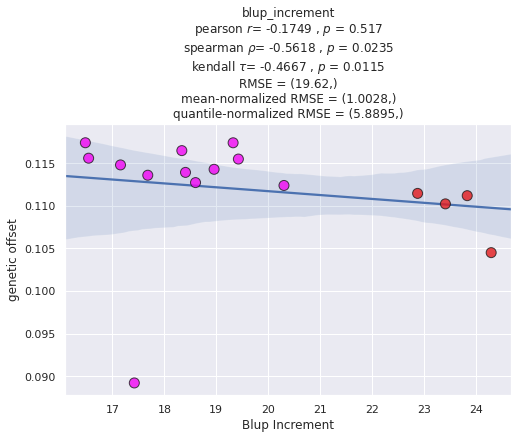

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-combined_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


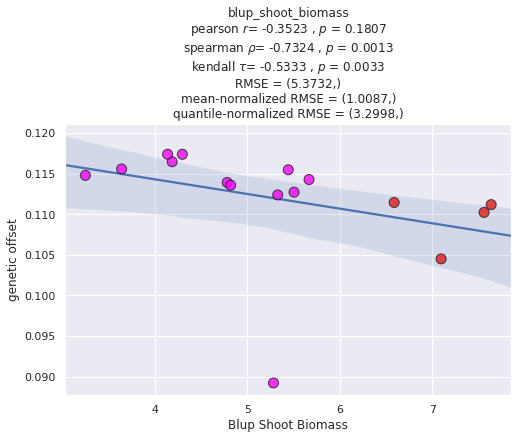

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_wza-random_full_regplot_blup_increment.pdf


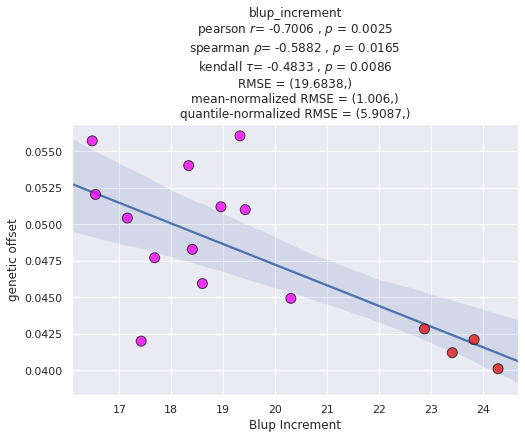

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/figs/western-fdi_vancouver_wza-random_full_regplot_blup_shoot_biomass.pdf


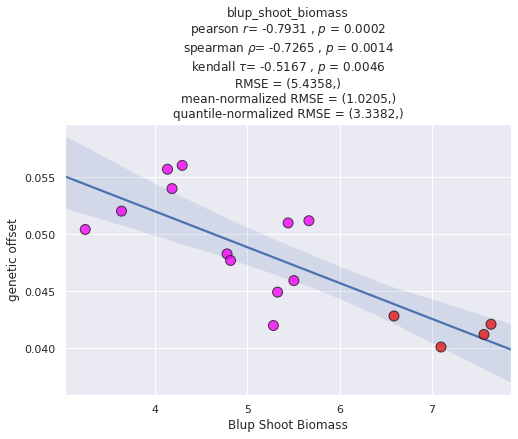

In [37]:
# get validation scores for full and cross-validation models
validation_scores_interior = wrap_defaultdict(None, 6)
for genetic_group in ['eastern', 'western']:
    for dataset in pretty_order:
        for spp in ['combined', 'fdi']:  # for each of two trained models (one across varieties, one just interior-trained)
            for kfold,offset_df in offsets['vancouver'][spp][dataset].items():
                varoffset_df = offset_df[offset_df.index.isin(fdi_groups[genetic_group])]

                if kfold != 'full':
                    cvdata = testtrain[spp][f'{kfold} training']
                    plot_using = None
                else:
                    cvdata = None
                    plot_using = 'regplot'

                valdict = calculate_statistics(
                    varoffset_df,
                    phenodata[spp]['vancouver'][['blup_increment', 'blup_shoot_biomass']],
                    cvdata=cvdata,
                    plot_with=plot_using,
                    #switch_xy=switch_xy,
                    saveloc=op.join(figdir, f'{genetic_group}-{spp}_vancouver_{dataset}_{kfold}_regplot.pdf')
                )
                
                for validation_stat in ['pearson', 'spearman', 'rmse', 'rmse_mean', 'rmse_iq', 'tls_residuals']:
                    validation_scores_interior[
                        validation_stat][
                        'vancouver'][
                        f'{genetic_group}-{spp}'][
                        dataset][
                        kfold] = valdict[validation_stat]

### get avg cross-validation scores

In [38]:
# get average correlation from cross-validation, store cv scores
cv_scores_twovariety = wrap_defaultdict(None, 4)  # store cv scores
cv_twovariety = wrap_defaultdict(None, 4)  # average cv scores

for garden,sppdict in validation_scores_twovariety['pearson'].items():
    for spp,datadict in sppdict.items():
        for dataset,kdict in datadict.items():
            _vals = wrap_defaultdict(list, 2)
            for kfold,phenodict in kdict.items():
                if kfold == 'full':
                    continue
                assert kfold.startswith('k')
                for pheno,(sqstat, pval) in phenodict.items():
                    _vals['pearson'][pheno].append(sqstat)
                    for validation_stat in ['spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                        _vals[validation_stat][pheno].append(
                            validation_scores_twovariety[validation_stat][garden][spp][dataset][kfold][pheno][0]
                        )

            for validation_stat in ['pearson', 'spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                cv_scores_twovariety[validation_stat][garden][spp][dataset] = _vals[validation_stat]
                # create a dictionary with keys=phenos and vals = average r2 among cv sets
                cv_twovariety[validation_stat][garden][spp][dataset] = dict(
                    pd.DataFrame(_vals[validation_stat]).apply(lambda x: x.mean())
                )

In [39]:
# get average correlations from cross-validation, store cv scores
cv_scores_interior = wrap_defaultdict(None, 4)  # store cv scores
cv_interior = wrap_defaultdict(None, 4)  # average cv scores

for garden,sppdict in validation_scores_interior['pearson'].items():
    for spp,datadict in sppdict.items():
        for dataset,kdict in datadict.items():
            _vals = wrap_defaultdict(list, 2)
            for kfold,phenodict in kdict.items():
                if kfold == 'full':
                    continue
                assert kfold.startswith('k')
                for pheno,(sqstat, pval) in phenodict.items():
                    _vals['pearson'][pheno].append(sqstat)
                    for validation_stat in ['spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                        _vals[validation_stat][pheno].append(
                            validation_scores_interior[validation_stat][garden][spp][dataset][kfold][pheno][0]
                        )

            for validation_stat in ['pearson', 'spearman', 'rmse', 'rmse_mean', 'rmse_iq']:
                cv_scores_interior[validation_stat][garden][spp][dataset] = _vals[validation_stat]
                # create a dictionary with keys=phenos and vals = average r2 among cv sets
                cv_interior[validation_stat][garden][spp][dataset] = dict(
                    pd.DataFrame(_vals[validation_stat]).apply(lambda pheno: pheno.mean())
                )

In [40]:
# save calculations
for obj in pbar(['offsets',
                 'validation_scores', 'validation_scores_twovariety', 'validation_scores_interior',
                 'cv', 'cv_twovariety', 'cv_interior',
                 'cv_scores', 'cv_scores_interior', 'cv_scores_twovariety']):
    
    assert obj in globals()
    
    pkl = op.join(txtdir, f'{obj}.pkl')
    
    print(pkl)
    
    pkldump(globals()[obj], pkl)

100%|███████████████| 10/10 [00:00<00:00, 287.45it/s]

/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/offsets.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/validation_scores.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/validation_scores_twovariety.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/validation_scores_interior.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/cv.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/cv_twovariety.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/cv_interior.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/cv_scores.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/cv_scores_interior.pkl
/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_fo

In [41]:
# time to complete notebook
formatclock(dt.now() - t1, exact=True)

'0-00:01:59'

<a id='bottom'></a>
# bottom label

[top](#home)